In [14]:
import io, base64

from IPython.display import display, HTML
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

import numpy as np
import pandas as pd
from scipy.cluster.hierarchy import linkage, leaves_list
from scipy.spatial.distance import pdist

import scanpy as sc

In [15]:
%matplotlib inline

matplotlib.rcParams["figure.figsize"] = [4, 4]
matplotlib.rcParams["figure.dpi"] = 150
matplotlib.rcParams["image.cmap"] = "Spectral_r"
# no bounding boxes or axis:
matplotlib.rcParams["axes.spines.bottom"] = "on"
matplotlib.rcParams["axes.spines.top"] = "off"
matplotlib.rcParams["axes.spines.left"] = "on"
matplotlib.rcParams["axes.spines.right"] = "off"

In [16]:
ad_url = "https://fh-pi-setty-m-eco-public.s3.amazonaws.com/mellon-tutorial/preprocessed_t-cell-depleted-bm-rna.h5ad"
ad = sc.read("data/preprocessed_t-cell-depleted-bm-rna.h5ad", backup_url=ad_url)
ad

AnnData object with n_obs × n_vars = 8627 × 17226
    obs: 'sample', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'batch', 'DoubletScores', 'n_counts', 'leiden', 'phenograph', 'log_n_counts', 'celltype', 'palantir_pseudotime', 'selection', 'NaiveB_lineage', 'mellon_log_density', 'mellon_log_density_clipped'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'PeakCounts'
    uns: 'DMEigenValues', 'DM_EigenValues', 'NaiveB_lineage_colors', 'celltype_colors', 'custom_branch_mask_columns', 'hvg', 'leiden', 'mellon_log_density_predictor', 'neighbors', 'pca', 'sample_colors', 'umap'
    obsm: 'DM_EigenVectors', 'X_FDL', 'X_pca', 'X_umap', 'branch_masks', 'chromVAR_deviations', 'palantir_branch_probs', 'palantir_fate_probabilities', 'palantir_lineage_cells'
    varm: 'PCs', 'geneXTF'
    layers: 'Bcells_lineage_specific', 'Bcells_primed', 'MAGIC_imputed_data'
    obsp: 'DM_Kernel', 'DM_Similarity', 'connectivities', 'distances', 'knn

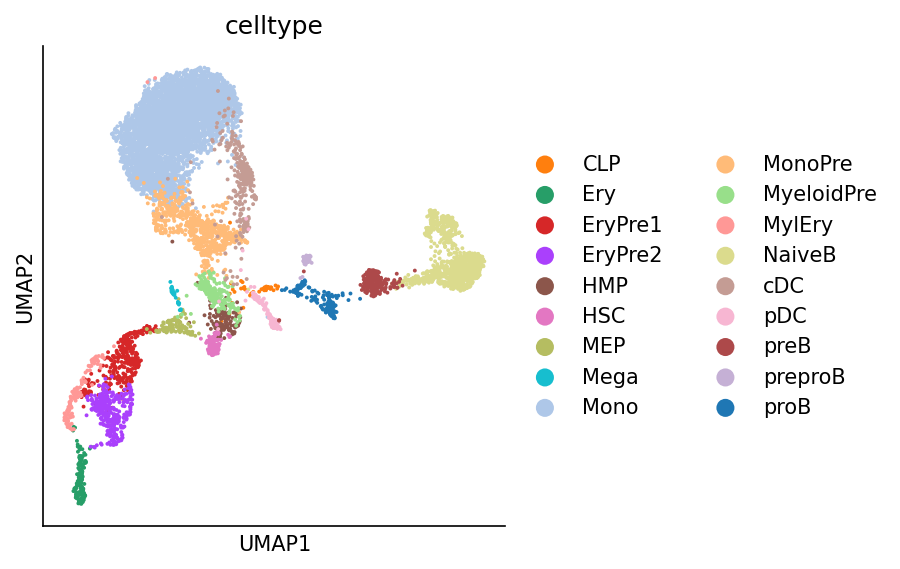

In [17]:
sc.pl.scatter(ad, basis="umap", color="celltype")

# H3K4me123 ande H3K27me3 Cluster Enriched Genes Average Z-scores

In [18]:
zscore_lists = {
    "K4me123_HSC_Genes":  ["ST6GAL2","SLC16A7","FAM198B","MIR4474","MIR99AHG","TBX3","IL1R1","RASSF6","SUCLG2","LINC00841","MIR874",
                           "MIR6132","PCDH17","TMEM252","PLCL1","ANKRD6","TMEM246-AS1","TTC21B","METTL24","SLC5A12","LINC00534","CDH11",
                           "TMEM246","ESRRG","EMC2","LUZP2","TCAP","GRIN2A","UPP1","SLCO1B3","PNMT","TEKT3","EPPK1","SLC26A11","AARS",
                           "WNT5A","EBF2","LONP2","BET1","LINC00508","AP3B2","FAM24B-CUZD1","LINC00113","GRM5"],
    
    "K4me123_MEP_Genes": ["ZFPM1","ZC3H18","MIR5189","UBR4","SLC24A3","PVT1","ASIC4","LINC00864","NECTIN1","KIAA1211","CSF2RB","MIR1207",
                          "LOC100130264","MINPP1","ABCC4","MIR1204","GATA1","MICAL2","ABCB11","SLC40A1","STXBP6","TMEM75","APBA2","CPB1",
                          "TSPAN18","MBOAT2","NUTM2A","DNAJC6","MITF","RYR3","LINC01856","CNRIP1","PLIN2","GATA5"],
    "K4me123_GMP_Genes": ["PRKCD", "MIR6774", "MPO"],
    
    "K4me123_CLP_Genes": ["LOC100420587","MIR6774","IRF8","MIR3681HG","SH3RF3","LINC00226","FAT3","BMS1P20","LINC00221","EBF1",
                          "LOC101928266","PSTPIP1","IGLL5","FCN1","LZTFL1","MDS2","RIMS3","SEPT10","C16orf78","PACSIN1","CCR7",
                          "VPREB1","LOC101928132","PADI1","WFS1","STX8","LINC00642","CLNK","TCF4","SPON1","LINC01640","MME","LINC00865",
                          "CCR9","NTN1","RNF123","ADGRD1","MAG","LRRC26","LINC01375","RAB31","PPP1R16B","IL7R","MSR1","LINC01108",
                          "ZNF831","MROH5"],


 "K4me123_PreB_Genes": ["LINC00221", "LOC101927950","LINC02273","EBF1","HS1BP3","LHPP","ELFN2","LOC100506271","MDS2","LOC100506688",
                        "CHST15","LINC02227","PRCD","VPREB1","SH3RF3","WSPAR","PRKCE","BMS1P20","MIR4316","TOP3B","ZCCHC7","CYGB","MIR5195",
                        "LINC00226","RHOB","PXDN","CD81","FARS2","BTBD6","SEPT9","MFNG","AUTS2","ZNF423","IQSEC1","MIR4266","CSGALNACT1",
                        "EBLN3P","SYNE3","FAM107B","MYO7B","MAD1L1","LINC00877","SH2D4B","LINC00598","MIR3139","LDLRAD4","LOC101928443",
                        "TRIP13","PALM2","LINC00163","LINC00870","LINC00642","GALNT2","LINC01679","BLNK","MGMT","FOXO6","LINC01539","BRF1",
                        "POU2AF1","PALM2-AKAP2","IL7R","TCL1B","GGTLC2","MED9","PAX5","GAB1","MIR5190","MIR378B","BLACE","ZNF750","MIR650",
                        "C11orf74","NTNG1","SLC8A1-AS1","MIR3161","MIR548AJ1","NID2","EIPR1","DNMT3L","TSPAN9","CTGF","PDE9A","SLC9A9",
                        "MME","PTMA","NRXN2","TEAD4","DKFZP434A062","LINC02532","MIR885","GAS7","RSPH14","TPO","VPREB3","FGF6","LINC00868",
                        "TBCD", "LINC01507", "LDLRAD4-AS1", "PVRIG","MIR4265","FAM163B","MIR634","IGLL5","UNQ6494","RAG1","LOC285766",
                        "UBASH3B","SERINC5","UGT3A2","MEG9","CMTM8","HHIP","GRK5","MIR5571","HMHB1","KLHDC4","CHMP6","IPO9-AS1","VDAC1","MSH6",
                        "LINC00502","GH1","LINC02080","CD79B","ZC3H3","CIB4","OR4B1","CCDC182","LINC02487","ANKRD1","LINC01180","SYNDIG1",
                        "RTN4R","LINC00426","ARPP21","LRRC8C","SLFNL1-AS1","MIR5197","PRKCA","RIMS3","CORO2B","TCL6","MYO18B","CALM1",
                        "LINC01221","LOC105369911","ZHX2","CASTOR3","GCSAM","CETP","LRIG1","EHD1","PART1","DCANP1","E2F2","CECR3","UBE2E2",
                        "TMEM72-AS1","IRF8","GNAZ","PLXNA1","MSGN1","TCP10L2","DYRK3","ARRDC5","SLFNL1","LINC01375","SLC9A9-AS1","CRMP1",
                        "LY86-AS1","INTS3","LOC101927539","LINC01353","LINC00865","FAM201A","PPP1CA","AEBP1","COLEC12","PAG1","MIR6774",
                        "MIR4289","KIAA0556","GPR176","NRIR","RBM38","SPP2","KATNAL1","LINGO4","MND1","CTD-2201I18.1","STAG3","LINC01013",
                        "HAR1A","MIR6837","MIR153-2","SLC8A1","LOC101927557","LOC101929574","MYBPH","BLK","RGSL1","MAT1A","MIR4464","INSC",
                        "DNTT","ADAMTSL2","RAG2","RNF152","MEF2A","STK39","C3orf52","TSPAN14","LINC00396","DOK4","ADPRHL1","ITIH4","AKAP2",
                        "TEX44","GINS3","EIF2AK3","CAPN3","CCR6","MIR5191","ANTXRL","LINC01058","MIR1231","ARHGEF10","CCNJL","FHIT","TBC1D19",
                        "LINC01107","ADARB2-AS1","LILRB1","DTX1","LINC00524","SLC23A1","ID3","LINC00316","C3orf56","ZNF70","RTP5","SLC22A13",
                        "RNFT2","CLLU1OS","CACNG5","MIR4526","IFNG-AS1","RHD","ATF7IP2","PGLYRP3","ALKAL2","MIR7843","FZD2","SHROOM3","TENM4",
                        "PLEKHG1","SLC6A3","TBC1D3","EHD3","MGAT5","SERINC2","CST2","MSR1","MIR194-2","MIR6746","MIR192","ABLIM2","SNTG2",
                        "CAPSL","GSDME","C22orf15","LINC02570","ESM1","STK32B","SNN","RAB20","C5orf64","LINC00424","TEKT5","SFXN5","SPSB1",
                        "DUSP26","SLC27A3","ACRV1","MIR572","MIR4457","LINC02584","BANK1","LINC01511","MAFTRR","ITIH3","TBC1D10C","LINC01257",
                        "LOC100128531","P2RX1","TCF4","LINC02538","PATE1","URB2","DLEU7","LOC100420587","SLC22A11","ANO1","FAM241A","PPP1R3G",
                        "SBF1","FAM3D","LL22NC03-63E9.3","C17orf77","EDN3","LOC283710","LCN10","MIR124-3","AQP5","LRRC14B","NRN1","MIR4752",
                        "PGAM2","ATP2B2","CD248","APCDD1","CARNS1","UGT3A1","TEX41","LCN6","KU-MEL-3","LINC01136","MIR378I","MIR6754",
                        "PLA2G5","LOC105374952","MIR1237","CCDC14","CHD7","MIR3621","IGLL1","PXK","NFKB1","PCDH9","RORC","LINC01922",
                        "HDAC5","HHIP-AS1","CPM","SLCO2B1","P2RX5","BTG2","PPP1R37","CD9","FADS3","LOC101927318","RIPPLY3","PLEKHM1","CMTM2",
                        "TERT","GNG12","ZFAT-AS1","CLTC","HLX-AS1","HBEGF","ATP6V0E2","LOC101927845","FLT4","ZNF704","TCF3","FAM30A","LTA",
                        "SYVN1","TMEM210","LOC729652","LOC101928841","CTCFL","MIR7850","TMEM63C","TIFAB","PARD3","LINC00487","PLCB3","LY86",
                        "PPP1R14B","RPL34-AS1","TMEM131L","PPP1R18"],

"K4me123_BCell_Genes": ["MIR8071-1","VAV2","CXCR5","EBF1","PAX5","IGLL5","ARHGAP24","EBLN3P","ZCCHC7","OSBPL10","BLK","MGAT5","MDS2","PPP1R16B",
                        "PALM2-AKAP2","ZNF860","PALM2","IKZF3","NPIPB3","NCOA3","MOB3B","PTPRJ","TBC1D9","SCIMP","NIPAL4","ADAM19","TCP10L2",
                        "MIR378I","CHD7","MTSS1","MIR4424","TRAF3","TFEB","BANK1","ENTPD1","MIR6774","LOC100130950","ELOVL5","SEMA4B","FCRL3",
                        "FAM53B","DTX1","POU2AF1","LINC02324","CLLU1","PLEKHG1","FCRL1","IRF8","VOPP1","COTL1","C1orf220","RHBDF2","LPCAT1",
                        "SETBP1","HVCN1","ANKRD44","TNFAIP8","FAM107B","MIR4476","WDFY4","LPP","CCR7","ST6GAL1","LARGE1","TMEM131L","PLCG2",
                        "MIR6837","IL6","TMEM121","CRYM-AS1","VPREB1","PVRIG","CLLU1OS","ARID5B","SOX30","TMEM154","RAB30","CLEC17A","ETS1",
                        "MAP4K4","GCM1","SWAP70","LOC401312","MIR4708","TNFRSF13C","FAM81A","ZNF280B","FAM167A","GNG7","MIR7850","LHPP","GGTLC2",
                        "CSGALNACT1","LBH","BLNK","CCR6","GRHPR","CDK14","SP140","FAM53B-AS1","PGAM2","CD48","SIPA1L3","LINC01634","AKAP2","GM2A",
                        "LYN","ENTPD1-AS1","MIR6076","SLAMF1","CD79B","TCL1A","P2RX5","GH1","JAZF1","QRSL1","LINC01599","MIR7706","TNF","SLC38A1",
                        "TNS4","SP100","MPEG1","PLAC8","CASTOR3","IQSEC1","ISG20","BMS1P20","NEDD9","NR1H2","TOP3B","MIR4668","RHBDD1","PLEKHF2",
                        "CPNE5","TPD52","MYO7B","BEND5","MIR4285","MIR3679","BCL2","MIR623","TCL1B","AFF3","UTS2B","LINC01929","NUAK2","LINC01948",
                        "CENPM","HUS1","DAD1","B4GALT1","UBE2E2","ZNF365","ZNF532","SMIM14","LINC01095","PIK3AP1","SIGLEC6","SHISAL2A","MICAL3",
                        "CD81","SMAP2","GGA2","APOBEC3G","FAM9C","LY9","ZC3H12D","EPS15L1","WNT10A","TNFRSF13B","HLA-DMB","LOC100130298","RBM38",
                        "LCLAT1","LINC01484","KLF2","PLEKHA2","FCRL4","UBAC2","ST14","FAM117B","MIR5571","1-Mar","MIR1208","PRKCD","LINC00598",
                        "PLAC4","TCTN1","CD22","RAC2","GRK5","H3F3C","FNDC11","LINC02202","MIR3161","NPIPB11","MIR3681HG","SNX29P2","C5orf67",
                        "SUSD1","LINC01936","FCRL2","FCHSD2","BRD4","APOBEC3H","ARHGEF18","PRAG1","DGKD","POU2F2","SPIB","BFSP2-AS1","TCF3",
                        "RAPGEF1","RABEP1","PMEPA1","LMAN1L","UBE2G1","PNOC","LINC02532","PHTF2","CD37","PLPP3","MIR5685","ARHGEF17","LINC01679",
                        "TMEM131","MS4A1","PLCH2","LINC00926","MIR602","KLHL14","FCMR","MSH6","LINC02422","SLAMF6","DIP2C","SYT16","MIR492",
                        "LOC101927950","C16orf74","RRAS2","AGBL4","FOXO1","FUT8","LILRB1","MIR3692","IL22RA2","POLR3K","ID3","HLA-DQA1","KIAA0040",
                        "WSPAR","CD40","IRF4","LINC01485","CAMK2D","CXCR4","DIPK1A","ZNF175","FCER2","GLB1","CCDC69","NLRC5","CD72","LOC102723824",
                        "NPIPB4","STIM2","MAP3K1","STX7","SMARCB1","SRMS","SIPA1L1","RALGPS2","DBNL","SEC22B","COL19A1","ESPNL","CSHL1","TGFBR2",
                        "P2RX5-TAX1BP3","TCL6","AP1S3","MEF2A","FARS2","LOC100505622","HLA-DOB","CD79A","PCED1B-AS1","SNORA108","DDX6","CLVS1",
                        "KIAA0355","TNFSF9","C6orf99","USP3","MIR3150B","BACE2","TLR10","C5orf15","LINC02280","C8orf37-AS1","SIDT2","SRPK2",
                        "HMBOX1","PKDCC","CCDC50","SH3BP5","CNR1","ZHX2","TENT5C","STK24","LCOR","BASP1-AS1","CLASRP","PLA2G5","HES1","NFATC3",
                        "SMIM20","MIR625","TNR","UST","C12orf77","KDM6A","SEMA7A","DLEU1","WDFY1","HDAC1","CD1D","TSPAN3","SESTD1","DPF3","BCAS4",
                        "LINC02201","SNORA70E","MKLN1","CD83","TP73","SPOCD1","LOC100506472","CD74","LINC01506","ZNF92","ARL4C","OSTN","FBXO10",
                        "DRAM2","CEPT1","CYTH1","ASAP1","DOP1B","LOC100506725","MIR4471","PXDNL","MIR648","VWA3B","ACTR3","SNORA66","MEF2B","STRBP",
                        "3-Mar","CD200R1L","CD1C","MIR4451","ALPK2","CD70","WASIR2","PRDM2","MTG1","FAM214A","SNX25","DEF8","TRAK1","SRGAP2B",
                        "SRGAP2C","CBLB","DNMT3L","MIR1207","LARGE-AS1","LINC02541","EPN1","IL21R","LCK","LINC02026","SGPP1","ANKRD44-IT1","MIR4464",
                        "SH2B2","CIITA","HERPUD1","EZR","ABI3","SNN","CDV3","NUP160","CDC42SE2","ZNF627","BTLA","CD86","ZNRF2","TEAD2","GDI2","UGCG",
                        "SLC7A7","SHISA8","ACBD3","ATP6V1G3","TRPM1","TLE1","VANGL2","SMIM7","SLC12A3","PLEK","MIR6881","ARMH3","ADSL","SYNGR2",
                        "BHLHA9","CCDC178","RASGRF1","IFNGR1","LY86-AS1","ANXA6","PVT1","DOCK10","CYBB","IL17C","RAB44","FLJ42393","MIR129-1",
                        "SKIL","AP1M1","LINC01176","E2F5","MIR4758","ZNF318","RAB36","EML4","HLA-DRA","PARP15","FAM177B","FAM3C","HLA-DQB1-AS1",
                        "HMOX1","SIT1","LCN8","PPFIBP2","SSH2","PXK","LRRK2","OR2T2","PHF21A","HLA-DPA1","EIF2AK3","SHLD1","LINC02399","ZMIZ2",
                        "FAM129C","MIR593","LINC01907","LARGE2","OR5AN1","IFNGR2","KCNJ1","SIGLEC5","C14orf180","LINC01522","RHOQ","PDCD4","RSPH14",
                        "CETP","PARP8","CD55","GPR25","TMSB4X","MIR6836","MIR6838","MIR6729","ATF7IP","A4GALT","LINC00208","FAM111B","CHST15","AIM2",
                        "CASC19","IL20RA","GLDC","FCRLA","CHD1","FCHO1","MIR548C","CHL1","MYO1E","PARP14","SLC25A37","LINC01342","DEFA6","SLC6A16",
                        "LINC00494","IFNAR1","PPP3CC","LINC01353","JAK1","LINC00332","LINC01136","LINC01141","C8orf37","LDHAL6B","MIR4323","ALDH3B2",
                        "MIR4255","IFNLR1","MIR4324","GPCPD1","AGRP","SREBF2","KAT2B","RUBCNL","OSTN-AS1","NPIPB5","DOK7","ADARB2-AS1","MCM9",
                        "LINC01238","HLA-DRB1","LINC00293","CCAT1","LINC01298","KLHL36","MIR550A1","STK17B","NUBPL","NT5DC1","PCED1B","AMN","MIR6069",
                        "RAB30-AS1","CR2","AEBP1"],


"K4me123_Mono_Genes": ["PTPRJ","SLC24A4","PRKCD","CDH23","CD300E","SMIM25","FPR1","CD300C","LRP1","MAFB","IRF8","SERPINA1","HRH2","COTL1","LPCAT1",
                        "APOBEC3A_B","C10orf105","ASAP1","NEDD9","SPIDR","NCF2","RHBDF2","MIR8061","APOBEC3A","MIR4269","SLC7A7","MARCO","CYP1B1-AS1",
                        "NID1","RBM47","SRGAP2C","ASGR2","FCN1","LRP1-AS","CEBPB","CHST15","FPR2","SIGLEC11","AP3S2","FPR3","CD93","ZNF365","LOC102724153",
                        "CCR3","CDC42EP3","SRGAP2B","LILRA1","B4GALT5","KIR3DL3","TNFRSF1B","VCAN","CMKLR1","LILRB2","LOC102723672","TGM3","SIRPA","LILRB3",
                        "HDAC4","SAMHD1","SRGN","MIR1537","PSAP","KRT80","HCK","CD86","LOC283214","LILRB4","LILRB1","LILRA6","FAM72C","LINC00656","SIGLEC7",
                        "CD48","CD300LD","TLR4","TLR5","VIPR1-AS1","S100A9","MIR6831","LRRC25","LINC01258","SLC9A8","SIGLEC9","SRGAP2","SNX18","ASGR1",
                        "SULF2","SASH1","TGFBI","TRIT1","FAM157B","HK3","GAS7","TPRG1-AS1","CTSH","DGAT2","AATBC","ZNF710","FAM49B","ADAP2","MYOF","HMOX1",
                        "MIR4802","MEFV","TMEM170B","TTYH2","SNX30","CCR2","SCIMP","LINC00622","FAM9C","HK1","RETN","DHX34","TMEM131L","LINC00189","TTLL5",
                        "UPK3A","PECAM1","MGAM","PSTPIP1","C17orf77","PTPRE","RIN2","CTSS","RNF175","IL4R","CXorf21","HSD3B1","FLVCR2","CD1D","RNF144B",
                        "KIF1BP","CST3","GIMAP4","SLC7A10","TMEM154","LRRK2","OR10P1","SGK1","IL10RA","KRT36","BCL2A1","MIR6774","OR52K2","C15orf38-AP3S2",
                        "PID1","FYB1","ITGAX","ANPEP","SH3BP2","MGC16275","LY86-AS1","CTLA4","SYT8","IFI30","SHLD1","RAB31","TM9SF4","LPP","CD14",
                        "LOC103344931","TBC1D8","CCR1","LOC101928231","MTSS1","PCAT29","MNDA","RAB20","CTSK","SLC8A1","MIR4662B","S100A12","LINC02453",
                        "RRP12","APBB3","FCGR2A","THEMIS2","PTAFR","VIPR1","PILRA","CPVL","MIR3174","CD36","MS4A4A","C5AR1","LILRA4","NRG1","STX11","LYST",
                        "AQP9","LILRA5","KCNJ15","COX4I1","RHOU","MIR1237","C5orf67","ITGB2","DNER","MRTFA","SIDT2","PRKCA-AS1","C3AR1","LOC100130950","WSB1",
                        "ENTPD1","ADAP1","IL1RN","KLF4","HLA-DMB","TREM1","LOC101927243","LINC00243","ADGRD1","CRISPLD2","BACH1","NLRC5","HVCN1","CDC42EP2",
                        "RFT1","SMG7","CX3CR1","ITGB2-AS1","DSCR10","MPEG1","SLC16A3","GNLY","LINC00399","CYBB","ABI3","NLRP12","PFKFB4","LYZ","MIR6503",
                        "FAM81A","SIRPB2","CYP19A1","RBPJ","CTSL","RBL1","METTL7B","CLMN","INPP4A","TM4SF5","TSPAN14","LRTM1","NTSR1","FGD2","LINC00908",
                        "CPEB4","SCARNA1","MYO1F","MIR1228","1-Mar","PGA4","PRKAG2","MIR4632","TFEB","VAV2","LINC01423","CD300LB","METTL9","OR52K1",
                        "DUSP1","NFAM1","MAP4K4","MEGF9","LOC388780","PCP2","SLC18A1","LINC01032","RNASE3","C5AR2","ARHGEF10L","FCAR","NUP62","ATG7",
                        "LGALS3","SLAMF7","PPFIBP2","NBPF18P","CCDC13","XRCC4","P2RY6","C12orf80","DMXL2","RELT","OR6N2","MICU1","CSF2RB","FAM53B-AS1",
                        "PLBD1-AS1","MIR3605","RUBCNL","LOC729296","IRAK3","C9orf72","E2F2","LILRB5","MIR6864","PAG1","FBP1","CYP1B1","FCGR3A",
                        "RNF216-IT1","GK","OPRM1","TOP3A","IL17RA","SLC15A3","SLC25A37","TLR1","TCF7L2","GPBAR1","LOC101929384","NSUN7","MS4A6E",
                        "SIRPB1","FCER2","WISP1","VSTM1","LOC100507291","CPQ","LINC01146","TMEM105","LYVE1","OTULINL","MLXIPL","PLEKHG2","ADRB2",
                        "TBC1D9","HBEGF","CTSB","ICOS","PIGX","OTUD1","APBB1IP","TMEM176B","SMIM35","MIR4497","MIR4752","PPARG","MYCL","KLF11",
                        "RCBTB2","LINC01504","LOC100134391","LINC02363","SCNN1A","ADA2","LINC00968","LINC01498","IGF2R","ARHGAP26","MAPK13","RASSF2",
                        "TRIOBP","LINC02345","LINC01270","USP3","LOC643339","SIGLEC12","DNMBP-AS1","GGA2","FAM49A","CD1C","RNASE1","C9orf47",
                        "LINC01619","ACOXL","LINC02185"],

    
"K27me3_HSC_Genes": ["PPFIBP2","WIF1","PRDM16","SUCLG2","ZNRF3","RALGPS1","LINC00841","GRK5","IL1R1","ARHGEF12","MECOM","MCF2L","SETBP1",
                       "FAM221B","PARD3B","TMEM8B","KCNJ5","RYR3","GARNL3","KIF1C","LYPD6B","MAP3K9","SPTBN1","SNX25","LOC101927166","AMOTL2",
                       "LRP6","COL6A1","TMTC1","EPPK1","FARP2","STIM2","LRRC20","RGS10","OTUD7B","TRPM4","ANGPTL8","MIR6827","ANGPTL2",
                       "LINC02520","LINC01016","WWTR1","FAM19A2","DMTN","LINC01333","ADM","OSBP2","TSPAN16","ID3","CPEB1","DKKL1","ABCA3",
                       "LGI3","PDE4C","BMPR2","CDC14B","MAFA","CHPF","TTC12","SPNS2","CCDC9","KDM4B","CNTNAP1","MIR3190","C11orf45","THRB",
                       "CDK5R2","LTBP4","TMEM198","ZNRF3-AS1","MOCOS","MAN1C1","ODF3B","CCR10","ALPG"],
    
"K27me3_MEP_Genes": ["SUSD1","GRPEL1","C14orf177", "LINC00698","PPM1L","CAMK1","OGG1","PAG1","DKK1","TYR","EFS","LINC02126","MIR548AG1",
                     "DKFZP434K028","LINC01615"],

"K27me3_MEP_Genes":  ["SUSD1","GRPEL1","C14orf177","LINC00698","PPM1L","CAMK1","OGG1","PAG1","DKK1","TYR","EFS","LINC02126","MIR548AG1",
                      "DKFZP434K028","LINC01615","MIR603","LINC00353","ABCB11","NAALADL2-AS2","CDRT1","DACH1","LINC01444","SPATA8","PCAT5",
                      "LINC01519","KCTD8","OSTN","DPCD","LINC01520","RWDD3","INO80C","HSPB6","MS4A6A","COL11A1","CNTN3","LINC02372","CNRIP1",
                      "IL25","LOC105376599","ATP6V1B2","CD84","ITPRID2","LINC01645","ALG10B","LINC01047","LINC02616","PPFIA2-AS1","CPB1"],

"K27me3_PreB_Genes":  [ "TTC34","SORCS2","RBFOX3","PTPRN2","RP1L1","AJAP1","IGF2R","IGSF21","MIR6774","GRIK3","CACNA1H","ARHGAP39","C9orf62",
                       "GPR78","SLC22A1","MAGI1","ABLIM2","CTNNA2","DIP2C","MIR4689","KIAA1324","C1QTNF8","PDE10A","KCNT1","IRF8","SUSD1",
                       "SMOC2","LINC00243","CHST8","EPHA8","AIRN","C8orf74","FRMD1","COX4I1","MIR4274","ADGRA1","MIR4798","KIF1C","TCERG1L",
                       "LINC01164","MIR4668","TJP1","PAX5","LINC01654","ADRA2C","ZNF251","GREM2","LOC283177","PPARD","SORCS1","CHRNA4","MUC16",
                       "SSTR5-AS1","VPREB1","MIR4476","MIR5702","LOC105378137","IER3","NRG1","LINC01310","LOC101928443","LINC01777","CHL1",
                       "FAM189A1","MIR4472-1","AFAP1-AS1","JAKMIP3","CPZ","MAGI1-AS1","LINC01346","MROH5","LINC02487","LINC02418","TPO",
                       "MIR3201","PSAPL1","LINC00917","LINC02338","COL22A1","LINC01304","LOC101929420","MUC5B","LINC00922","DACT2",
                       "CTD-2194D22.4","DSCAM","SEMA5A","TP63","DISP3","LOC100507548","MIR4266","SH3RF3","TMEM179","LOC101929473","MIR634",
                       "GCNT3","SNTG2","DPP6","LOC101929497","TCP10","LINC00583","NRCAM","MIR4255","TEX29", "LINC00924","MIR646HG","DESI1",
                       "MAS1","ZNRF4","C1QA","PLCG1","LINC00955", "KCNJ18","MIR95","GALNT9","GALNT17","MIR378D1","CACNG5","DMBT1","C3orf56",
                       "JPH3","TADA2B","AKAP12","LINC00840","LOC100130587","LINC00619","PLXNA1","LOC100130238","ADAMTSL1","DCDC2C",
                       "LOC100129931","IL1RAP","MTA3","SLC6A19","SPON1","MUC5AC","LINC01532","GOLGA6L2","PTPRO","LDLRAD3","ELOC","SIRPG",
                       "HTR5A-AS1","LINC00898","LINC01756","KLHDC7A","SEC24B-AS1","SLC26A11","ADGRL3","GFRA1","CELSR2","MIR378C","PDK1",
                       "CCDC96","SLC16A6","LCN9","PDE3B","GOLGA8S","SAMD5","NPSR1-AS1","ZBTB40","IQGAP1","C10orf90","LINC01718","LINC02189",
                       "LOC101927394","SIRPB1","REEP5","EGFR","BPIFA2","BCL2L11","OR1M1","PRKCA","SGSH","AMER3","OR4B1","LOC101927141",
                       "HRH2","SOHLH1","LINC00618", "LINC00698","PDE6B","CIB4","NRG1-IT1", "CHST15","FMN2","MEF2A","POLE4","LINC02294",
                       "ASAP1","MACROD2","PI16","LINC01395","MIR4535","MIR7843","GRK5","SPACA7","KLHL14","TM2D3","SLC6A18","MIR153-2",
                       "FAT1","SFMBT1","NDUFS6","TERT","SLC38A9","LOC101929653","LINC01115","PSMA1","LINC01511","LOC101929268","SPATA19",
                       "TBX18-AS1","OTOS","PCDH7","C9orf84","TRAP1","MIR6871","ADGRD1-AS1","UNC93A","LOC284930","LINC01939","LINC02110",
                       "APCDD1L-DT","LINC01081","MIR3125"],

"K27me3_BCell_Genes":  ["DPF3","FCGBP","ABLIM2","SORCS2","PAX5","PPFIBP2","RBFOX3","KLHL29","DOCK9","NRG1","GRK5","IGF2R","ARHGAP39",
                        "EBLN3P","MIR4668","TENM4","MIR7843","MIR95","SUSD1","SLC22A1","CHCHD6","PDE10A","AGAP1","PAX2","CTNNA2","SYNE2",
                        "RHPN2","AIRN","RP1L1","MIR6774","DOCK9-DT","BCL11B","RALGPS1","CACNA1I","CHD7","LINC02338","PLCG1","PAX7","HMX1",
                        "EGFLAM","AJAP1","CDKN2B-AS1","TJP1","DIP2C","PTPN3","RRAS2","MIR4476","FAM135B","NTM","EGFLAM-AS2","LIFR","SFMBT1",
                        "TSPAN9","PPARD","ZNF536","COL22A1","TCERG1L","IKZF3","JAZF1","PTCH1","LINC00618","SIRPG","SOX7","ONECUT3","B9D1",
                        "TOX2","EN2","SORCS1","LINC00924","CAMKMT","IRF8","FOXP4-AS1","UNCX","TRABD2A","REEP5","TMEM8B","KIF1C","LINC00950",
                        "MIR4533","STX1A","NEO1","FENDRR","CDKN2B","GALNT9","TCF3","MIR4274","DUSP8","TEAD1","COL4A2","C8orf74","LINC01197",
                        "CISTR","KIAA1324","BMP2","GATA4","SLC26A11","VPREB1","BNC2","OLFM1","FAM221B","GPR78","EPN2","GRAP2","AFAP1",
                        "ARHGEF1","MYO1C","LINC01574","ADGRL3","MTA3","MSX2","FZD10-DT","WNT10A","KRTAP5-AS1","FZD10","PPP1R13B","TADA2B",
                        "LOC100129931","LRRC55","COL19A1","APTX","LINC00922","LINC00917","SGSH","IRX1","PLXNA1","MIR1469","MIR646HG",
                        "MIR9-3","TBX3","SCARA5","UBXN10-AS1","BCAR1","ENTHD1","FMN2","BMP7","GLP1R","CPLX2","DOCK9-AS1","CHST15","SMUG1",
                        "OTOP1","PDGFB","LHX2","FGF3","KCNG1","DOK7","LOC101927419","DCP2","RPP21","CFDP1","CCDC96","SLC38A8","EN1","PSMC4",
                        "LMX1B","HLA-E","LINC01141","GPR68","PRAP1","PRSS16","HIF1AN","LOC100505588","ADGRA1","PRAC2","PDK1","TLX1NB",
                        "NKX2-2","DEFA5","EPB41L4B","LINC00583","EMX2","TWIST2","LOC101928416","FAM204A","DMPK","RHCG","HOXC5","SYT2",
                        "PDZRN3","SDC3","CHRNA1","DLX4","RAET1L","COL4A2-AS2","NKX2-8","RGS9","LINC00261","SIX3","FCGR2A","SLFN5","SH3BP5",
                        "SALL1","LINC01238","C1QTNF8","LINC01237","MIR4284","COX4I1","IQGAP1","TBX5-AS1","GRPEL1","KLHL14","MIR124-3",
                        "ZNF831","CPLX1","LINC02418","AFAP1-AS1","IRS1","KCND2","BMPR1A","KLK4","BTRC","TTC6","LINC01276","ZBTB40",
                        "LINC02116","MIR593","LINC01428","CHL1","LINC01411","SEMA5A","LINC02426","MIR196A1","LINC01749","TGM6","LHX5-AS1",
                        "MIR8089","KCNT1","NOVA1","NKX2-5","BLACE","SSTR5-AS1","MIR6871","MIR8073","SHANK1","NPHS1","RIC8B","MIR4262",
                        "NKX1-1","LOC100130238","CALY","PLEKHG1","EGR3","GRIN1","SLC15A3","CAMK2D","LINC01727","WFS1","GATA6","PCDHGA1",
                        "ARHGAP24","FOXP4","PDE6B","ETNPPL","HOXC6","BCL2L11","TFAP2B","SEMA3E","LZTS1-AS1","LINC00533","PAX9","MIR124-2HG",
                        "HOXC13","PAX6","SLC16A6","TLX1","LINC01511","CBX8","OR2V1","PCDHGA2","UGCG","DMWD","IRX6","APC2","IRF4","MIR4287",
                        "TMEM132A","PCDHGA3","MIR378C","DENND3","RFT1","LINC01751","EVX1","BET1","DTX1","LOC149684","CBLN1","HHIPL1","BUD23",
                        "PBK","AGAP1-IT1","FLJ12825","GATA6-AS1","EBF1","CHRNA4","WIPF1","LOC101929497","ARF1","MIR8080","LRRIQ1","RABGEF1",
                        "ANKRD7","YAP1","LZTS1","ASB18","GSC","NECAB2","AGRN","FAM107B","OSMR-AS1","LINC01623","LINC02447","AFDN","EPN2-AS1",
                        "SIPA1L1","PCDHGB2","PCDHGB1","PCDHGA4","GTSF1L","DEFA4","PRDM12","NUAK1","DMRT1","SIM2","PI16","IER3","PPFIA2",
                        "PCDHGA5","JAZF1-AS1","TRIB2","MIR8062","HCN4","LINC01398","LOC100128770","ASAP1","TSSK1B","DACT2","HOXC4",
                        "PAX6-AS1","GGN","SEC24B-AS1","EPHA5","C9orf92","MIR4520-1","MIR646","PIWIL1","ANGPTL2","TTBK1","WNT1","LINC01082",
                        "KIZ","VSTM2B","BICDL2","DEFA1B","ZNF318","LINC00243","SIRPB1","DEFA6","KIRREL2","SNCB","CFAP77","PHOX2B","CPZ",
                        "COPB1","SNX25","SIRPG-AS1","PCDHGB3","IL22RA2","SLC52A1","SPRED3","FGF19","SOX1-OT","LINC02135","MIR153-2","KLK2",
                        "ZIC4","FOXF2","SATB2","LOC100506885","TMEM215","CALCOCO1","AKTIP","DMBX1","LINC02520","LHX1","MRPL36","SIX3-AS1",
                        "PLCH2","NPTX1","IRX4","PROP1","TMEM263","LINC00619","C1orf61","LINC01422","MLXIPL","WNT5A","KRTAP5-2","COLCA2",
                        "NKX6-2","LRRC4B","ARSG","SOX8","HSD11B1-AS1","FCRL4","TEX29","RAPGEF4-AS1","MIR135B","BARX2","OSTM1","LRP10",
                        "MIR1180","ZIC5","BNIP3","GREM2","SAA4","VAX1","ICK","MIR4456","PDE4A","APLNR","CAMK2N1","GSX1","B3GAT1","PCDHGA6",
                        "PCDHGB5","LOC101928443","AFDN-DT","PDLIM3","CTD-2194D22.4","KAZALD1","LINC00354","SLC8A2","EGFLAM-AS4","GCNT3",
                        "KCTD7","ULBP1","MAP3K9","IL17C","MAP1B","LOC105378137","SHH","RBM19","NETO1","MIR4664","IL1RAP","NSG1","SLFN12L",
                        "LINC01056","ZNF213","TINCR","RAB2A","NBPF15","VAV2","LHX3","LINC01012","PINX1","DEFA3","SPATA6L","GBX2","CDKN2A",
                        "PCDHGA8","SUCLG2","TMEM174","LOC389199","ADGRA1-AS1","LINC00029","KCNK4-TEX40","FCGR2C","LHFPL4","SARS","MIR3125",
                        "MIR5702","CCR7","PCDHGA9","KCNIP4-IT1","C2CD4C","BMP8B","IGF2","RAB30","PCDH7","LINC02189","PRLHR","DSC3","THEG",
                        "KRT24","RNVU1-15","TBX2-AS1","ZIC1","LOC440982","KRTAP10-12","FOXF1","NXPH4","FBXL16","PCDHGB6","PCDHGA7","SHMT2",
                        "SKOR2","MIR4681","FOXD1","CTAGE1","LINC02202","IL20RA","PPP2R5C","PCDHGB4","RNA5S1","MIR129-1","MNX1-AS1","KCNK4",
                        "OR1F1","CNTNAP1","MAPK7","MXI1","LINC02078","MIR9-3HG","VPS37D","HAR1B","ZBED9","ID3","LOC101929653","HOXD3","IRX2",
                        "RUNX1T1","CRLF1","BCAS3","PTPRJ","OSTC","POM121L2","SOX9","HMX3","PLEC","BPI","IFNLR1","BMP8A","CACNG7","PCP4",
                        "KLK1","NKAIN4","KIAA1755","PMM1","P2RX5","KCNC3","MXRA8","ZHX3","CSNK2A3","SLC12A3","SHISA8","SALL3","COLCA1",
                        "GRIN2C","LINC00840","LINC01081","SLC17A7","MIR661","CELSR2","FCGR3B","ERC2-IT1","LBX1-AS1","EEF2KMT","ABHD11-AS1",
                        "WNT10B","BLK","EPN2-IT1","LMNTD2","UBE2I","MNX1","CACNA2D1","SCRIB","MSLN","UTS2R","C8orf82","FAM83H-AS1",
                        "P2RX5-TAX1BP3","LINC02268","STC2","SLC25A21","SYT12","MIR5579","CCDC174","SOX1","ALX1","CCR10","IRX5","MYOD1",
                        "SHC2","DESI1","FEZF2"]
    
}


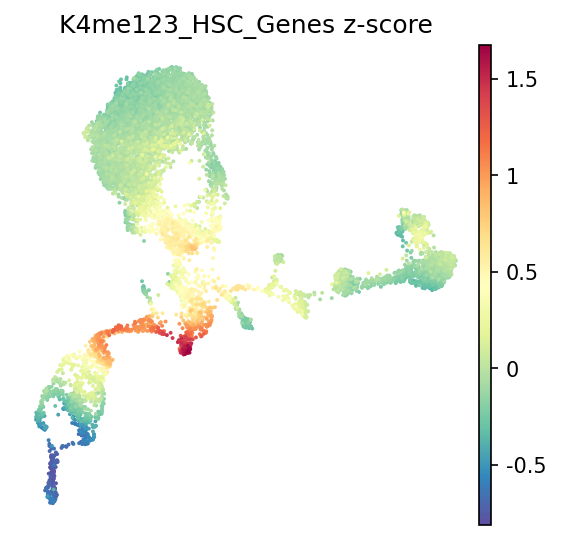


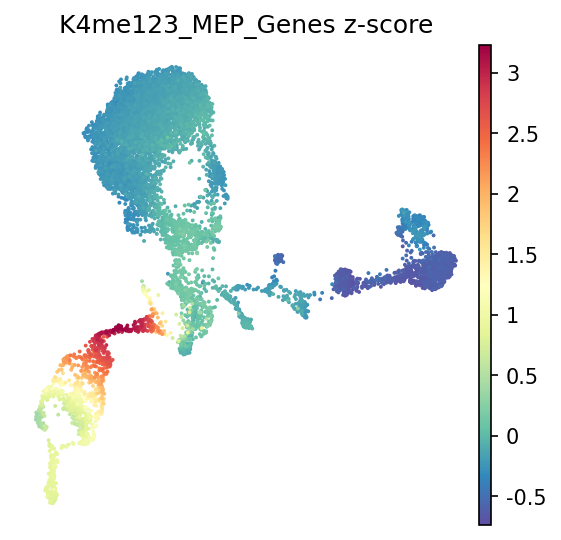


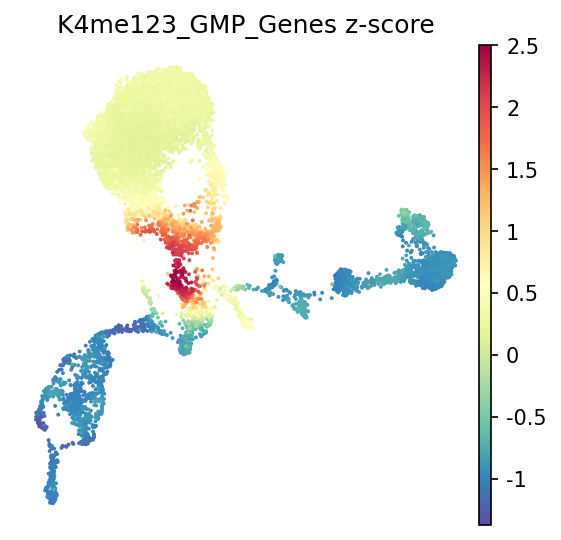


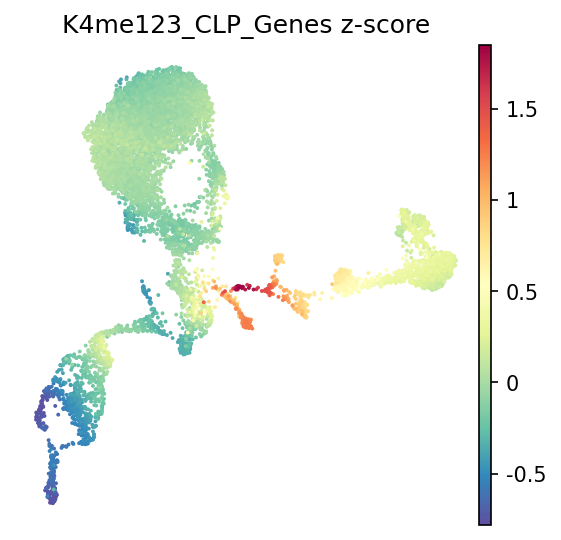


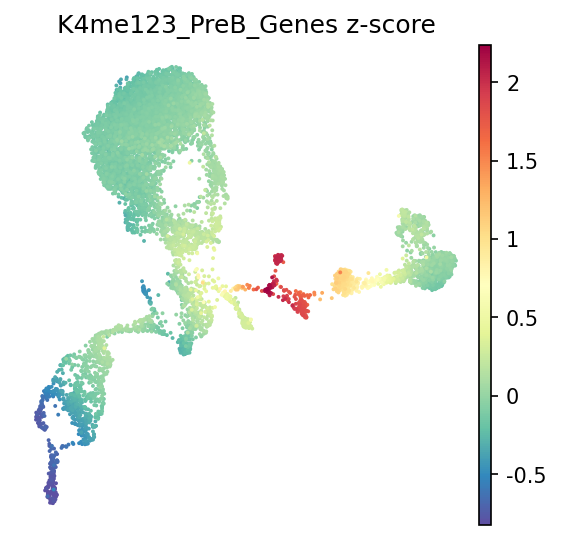


...


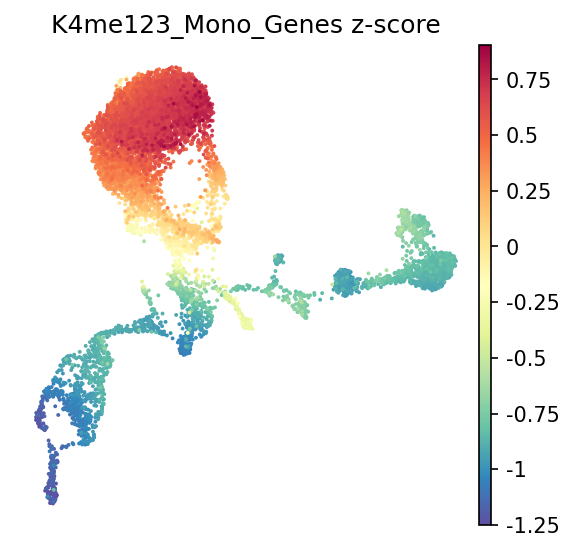


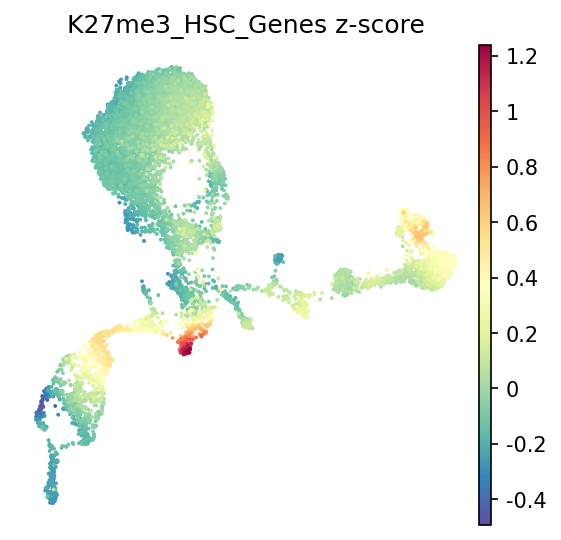


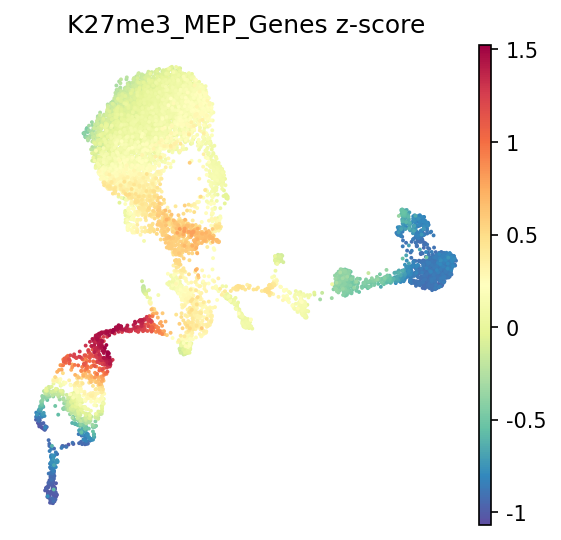


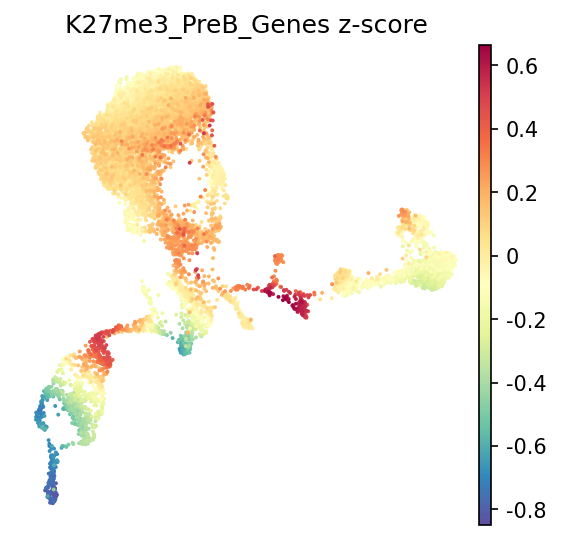


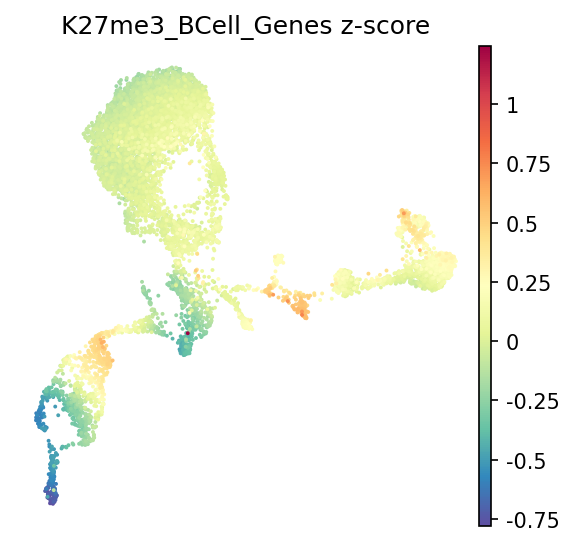

In [19]:
for fl, z_score_gene_list in zscore_lists.items():
    # 1) Identify which genes exist in your AnnData
    genes = np.asarray(z_score_gene_list)
    exists = np.isin(genes, ad.var_names)
    found   = genes[exists].tolist()
    missing = genes[~exists].tolist()
    total, n_found, n_missing = len(genes), len(found), len(missing)
    frac_found = (n_found / total) if total else 0

    # 2) Compute the z‑scores
    expr = ad[:, found].layers["MAGIC_imputed_data"].todense()
    expr = expr - np.mean(expr, axis=0)
    expr = expr / np.std(expr,  axis=0)
    ad.obs["z-score"] = np.mean(expr, axis=1)

    # 3) Generate the UMAP scatter into an in‑memory PNG
    sc.pl.scatter(ad, basis="umap", color="z-score",
                  title=f"{fl} z-score", frameon=False, show=False)
    fig = plt.gcf()
    buf = io.BytesIO()
    fig.savefig(buf, format="png", bbox_inches="tight")
    plt.close(fig)
    img_b64 = base64.b64encode(buf.getvalue()).decode("utf-8")

    # 4) Build the HTML report section
    report_html = f"""
    <div style="padding:10px; max-width:300px; font-family:sans-serif;">
      <h3 style="margin:0 0 10px 0;">{fl}</h3>
      <ul style="padding-left:20px; margin:0;">
        <li><b>Total genes</b>: {total}</li>
        <li><b>Found</b>: {n_found} ({frac_found:.1%})</li>
        <li><b>Missing</b>: {n_missing}</li>
        {f"<li><b>Missing genes:</b> {', '.join(missing)}</li>" if n_missing else ""}
        <li><b>Found genes:</b> {', '.join(found)}</li>
      </ul>
    </div>
    """

    # 5) Combine with the plot in a flex container
    html = f'''
    <div style="display:flex; align-items:flex-start; margin-bottom:20px;">
      {report_html}
      <div>
        <img src="data:image/png;base64,{img_b64}"
             style="max-height:600px; margin-left:20px;">
      </div>
    </div>
    '''
    display(HTML(html))

# Indiviual Gene Expression During HSC to MEP commitment

In [20]:
genes = """

ZFPM1
GATA1
MECOM
PRDM16

""".strip().splitlines()
genes = np.asarray(sorted(genes))

In [21]:
exists = np.asarray([g in ad.var_names for g in genes])
n_missing = np.sum(~exists)
if n_missing:
    print(
        f"The following {n_missing} genes are not in the anndata: "
        + ", ".join(genes[~exists])
    )

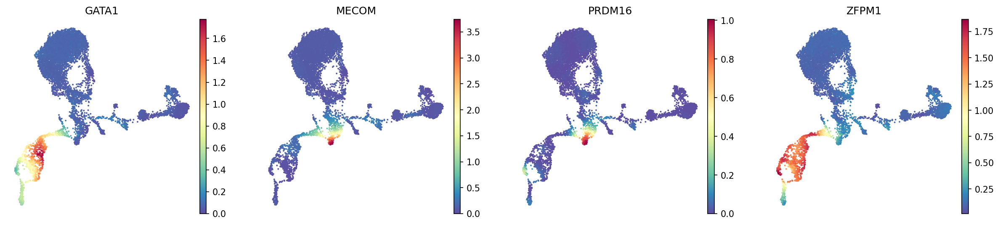

In [22]:
sc.pl.embedding(
    ad, basis="umap", color=genes[exists], layer="MAGIC_imputed_data", frameon=False
)

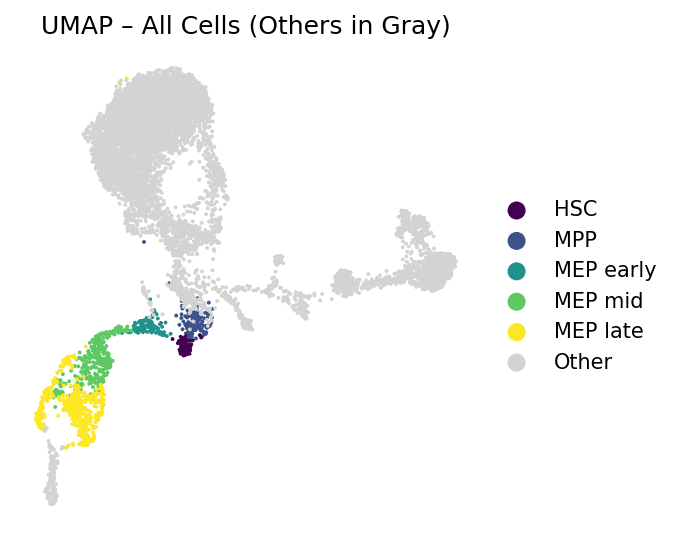

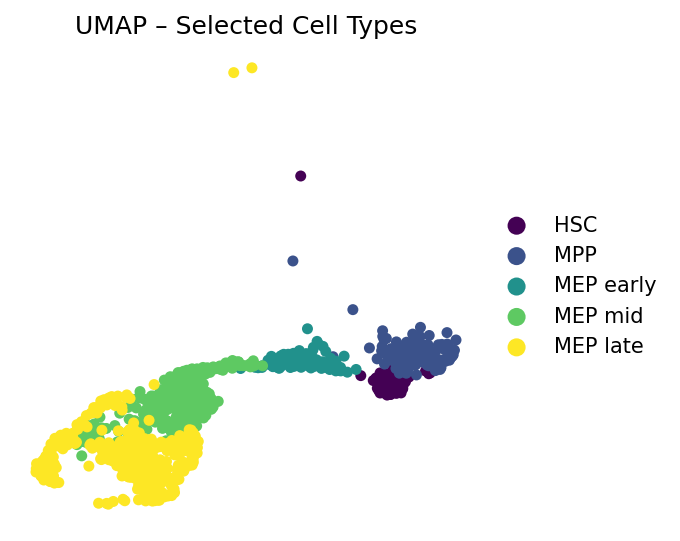

In [23]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt

# --------------------------------------------
# STEP 1: Define mapping and create merged column
# --------------------------------------------

# Mapping from original to merged cell types
celltype_map = {
    'HSC': 'HSC',
    'HMP': 'MPP',
    'MEP': 'MEP early',
    'EryPre1': 'MEP mid',
    'EryPre2': 'MEP late',
    'MylEry': 'MEP late'
}

# Apply mapping to create a new column in ad.obs
ad.obs['celltype_merged'] = ad.obs['celltype'].map(celltype_map).fillna('Other')

# Set category order (add 'Other' at the end for grey coloring)
ordered_categories = ['HSC', 'MPP', 'MEP early', 'MEP mid', 'MEP late', 'Other']
ad.obs['celltype_merged'] = pd.Categorical(
    ad.obs['celltype_merged'],
    categories=ordered_categories,
    ordered=True
)

# --------------------------------------------
# STEP 2: Define color palette
# --------------------------------------------

custom_colors = {
    'HSC': "#440154",
    'MPP': "#3b528b",
    'MEP early': "#21918c",
    'MEP mid': "#5ec962",
    'MEP late': "#fde725",
    'Other': "#d3d3d3"  # gray for anything not in the main set
}

# Create list of colors in same order as category list
ad.uns['celltype_merged_colors'] = [custom_colors[ct] for ct in ad.obs['celltype_merged'].cat.categories]

# --------------------------------------------
# STEP 3: Plot UMAP with ALL cells (others in gray)
# --------------------------------------------

sc.pl.scatter(
    ad,
    basis="umap",
    color="celltype_merged",
    title="UMAP – All Cells (Others in Gray)",
    frameon=False, 
    save="scRNAseq_MEP_Clusters_UMAP.png"
)

# --------------------------------------------
# STEP 4: Plot UMAP with ONLY selected cell types
# --------------------------------------------

# Define the list of categories to show
selected_categories = ['HSC', 'MPP', 'MEP early', 'MEP mid', 'MEP late']

# Subset the AnnData to just those categories
selected = ad.obs['celltype_merged'].isin(selected_categories)
adata_subset = ad[selected].copy()

# Re-order the categorical
adata_subset.obs['celltype_merged'] = pd.Categorical(
    adata_subset.obs['celltype_merged'],
    categories=selected_categories,
    ordered=True
)

# Pass palette **as a list**, not a dict
palette_list = [
    "#440154",  # HSC
    "#3b528b",  # MPP
    "#21918c",  # MEP early
    "#5ec962",  # MEP mid
    "#fde725"   # MEP late
]

# Plot
sc.pl.scatter(
    adata_subset,
    basis="umap",
    color="celltype_merged",
    palette=palette_list,
    title="UMAP – Selected Cell Types",
    frameon=False
)


/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:900: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


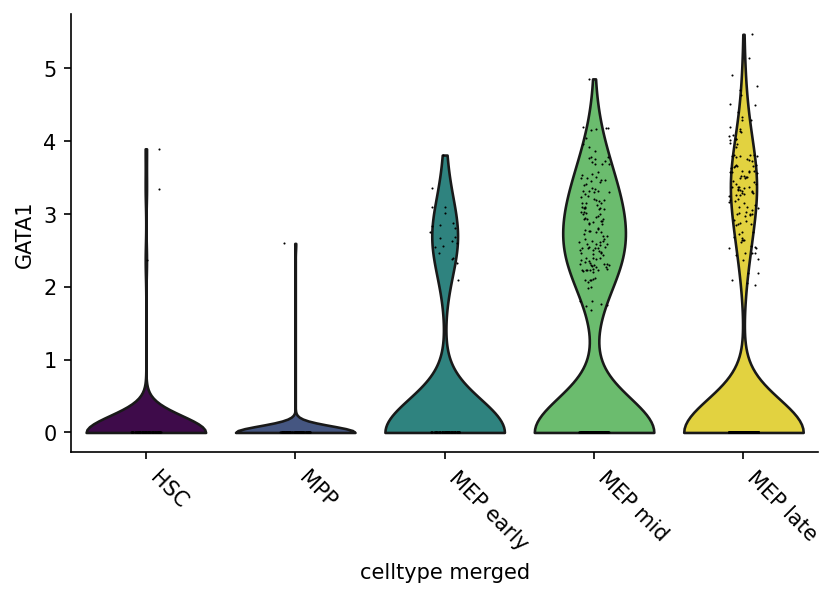

/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:900: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


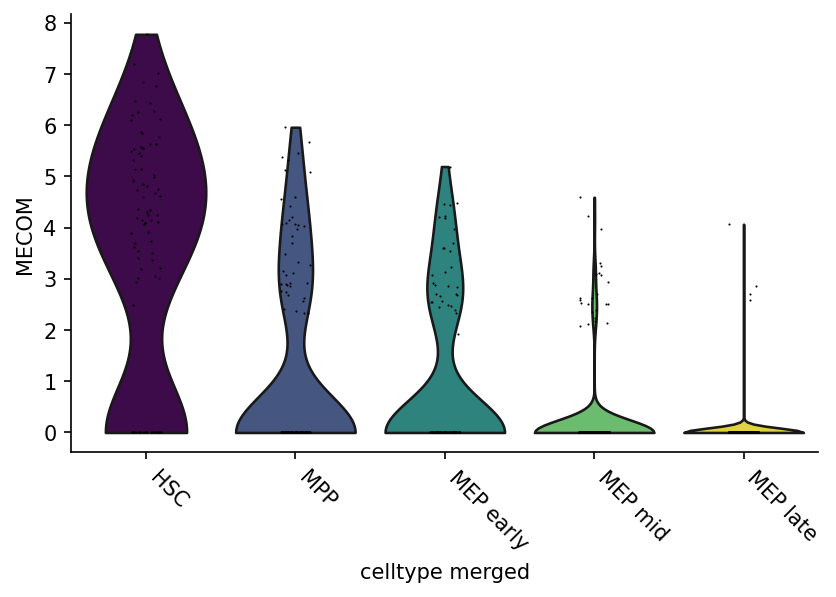

/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:900: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


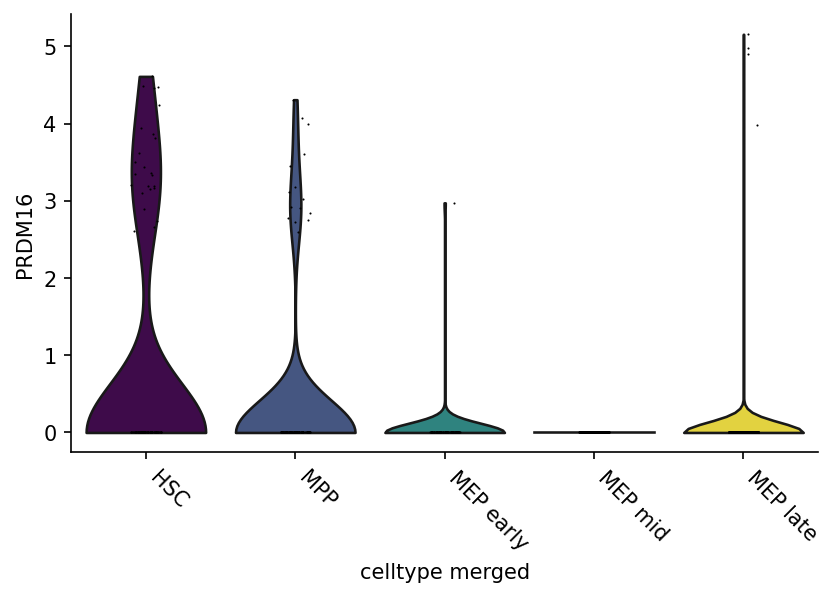

/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:900: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


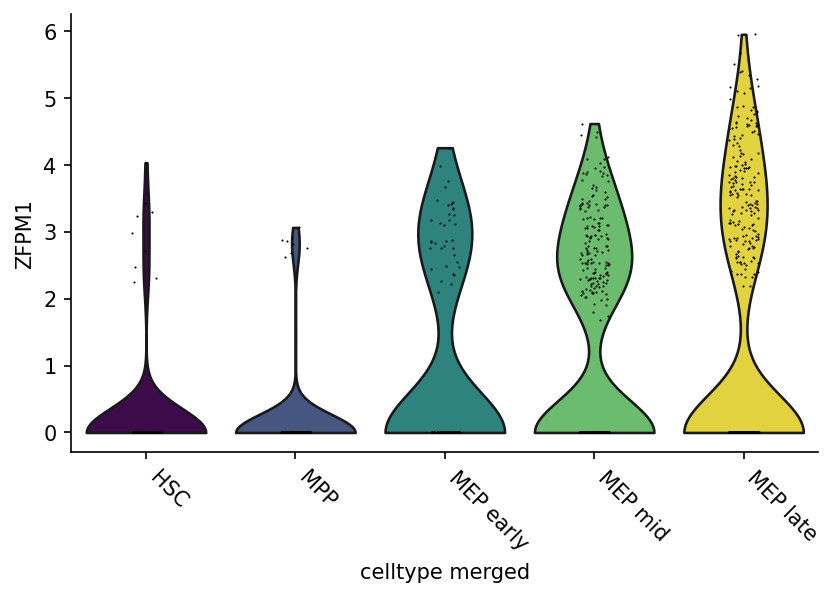

In [24]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib

# Desired order and relabeling
celltype_map = {
    'HSC': 'HSC',
    'HMP': 'MPP',
    'MEP': 'MEP early', 
    'EryPre1': 'MEP mid', 
   'EryPre2' : 'MEP late',
    'MylEry' : 'MEP late'
}

keep = ad.obs['celltype'].isin(celltype_map.keys())
ad_subset = ad[keep].copy()
ad_subset.obs['celltype_merged'] = ad_subset.obs['celltype'].map(celltype_map)

# Make it a categorical with the correct order
ordered_categories = ['HSC', 'MPP', 'MEP early', 'MEP mid', 'MEP late']
ad_subset.obs['celltype_merged'] = pd.Categorical(
    ad_subset.obs['celltype_merged'], 
    categories=ordered_categories,
    ordered=True
)

custom_colors = {
    'HSC': "#440154",
    'MPP': "#3b528b",
    'MEP early': "#21918c",
    'MEP mid': "#5ec962",
    'MEP late': "#fde725"
}

import os
os.makedirs("violin_plots", exist_ok=True)

matplotlib.rcParams["figure.figsize"] = [6, 4]

for gene in genes[exists]:
    sc.pl.violin(
        ad_subset, 
        gene, 
        groupby="celltype_merged", 
        use_raw=False, 
        show=False, 
        palette=custom_colors
    )
    plt.xticks(rotation=-45, ha="left")
    plt.savefig(f"violin_plots/{gene}.png", dpi=300, bbox_inches="tight")
    plt.show()

# Reset to default
matplotlib.rcParams["figure.figsize"] = [4, 4]


In [25]:
ad.layers["logcounts_og"] = ad.X.copy()
ad.X = ad.raw.X.copy()
ad.layers["raw_counts"] = ad.X.copy()
sc.pp.normalize_total(ad)
ad.layers["normalized_counts"] = ad.X.copy()
ad.X = ad.layers["normalized_counts"].copy()
ad.uns["log1p"] = {"base": 2}
ad.X.data = np.log2(ad.X.data + 1)
ad.layers["logcounts"] = ad.X.copy()

## Redo with revised cluster labels

In [26]:
from scipy import sparse

def _to_dense(X):
    if sparse.issparse(X):
        return X.toarray()
    return np.asarray(X)

def _get_matrix(adata, use_raw=True, layer=None):
    if layer is not None:
        X = adata.layers[layer]
    elif use_raw and adata.raw is not None:
        X = adata.raw.X
    else:
        X = adata.X
    return X

def pairwise_pvals_for_genes(
    adata,
    pairs,
    genes,
    label="celltype",
    method="wilcoxon",
    use_raw=None,
    layer=None,
    verbose=True,
    celltype_map=None  # <-- new
):
    if celltype_map is not None:
        mapped_label = f"{label}_mapped"
        adata.obs[mapped_label] = adata.obs[label].map(celltype_map)
        label = mapped_label  # Use mapped labels from here on

    if use_raw is None:
        use_raw = (adata.raw is not None)

    results = []
    present_genes = [g for g in genes if g in adata.var_names]
    missing_genes = [g for g in genes if g not in adata.var_names]
    if verbose and missing_genes:
        print(f"[info] Skipping missing genes: {', '.join(missing_genes)}")

    for g1, g2 in pairs:
        g2_list = g2 if isinstance(g2, (list, tuple, set)) else [g2]
        mask = adata.obs[label].isin([g1] + list(g2_list))
        ad_pair = adata[mask].copy()

        # Subset to genes of interest to keep it fast.
        keep = [g for g in present_genes if g in ad_pair.var_names]
        if len(keep) == 0:
            if verbose:
                print(f"[warn] No target genes present for comparison {g1} vs {g2_list}")
            continue
        ad_pair = ad_pair[:, keep].copy()

        # Build a temporary binary label for this comparison
        pair_col = "_pair_label"
        ad_pair.obs[pair_col] = np.where(ad_pair.obs[label] == g1, "group1", "group2")
        ad_pair.obs[pair_col] = ad_pair.obs[pair_col].astype("category")
        ad_pair.obs[pair_col].cat.set_categories(["group1", "group2"])

        # Run Wilcoxon on just these genes
        sc.tl.rank_genes_groups(
            ad_pair,
            groupby=pair_col,
            groups=["group1"],
            reference="group2",
            method=method,
            use_raw=use_raw,
            layer=layer,
            tie_correct=True,
            corr_method="benjamini-hochberg",
        )

        # Extract RG results
        try:
            df = sc.get.rank_genes_groups_df(ad_pair, group="group1")
        except Exception:
            # Fallback if get.rank_genes_groups_df not available
            rg = ad_pair.uns["rank_genes_groups"]
            names = list(rg["names"][0])
            scores = list(rg["scores"][0])
            pvals = list(rg["pvals"][0])
            pvals_adj = list(rg["pvals_adj"][0])
            lfc = list(rg.get("logfoldchanges", [np.nan] * len(names))[0])
            df = pd.DataFrame(
                {"names": names, "scores": scores, "logfoldchanges": lfc,
                 "pvals": pvals, "pvals_adj": pvals_adj}
            )

        df = df[df["names"].isin(keep)].copy()

        # Compute simple summaries (means and %>0) on the same layer we tested
        X = _get_matrix(ad_pair, use_raw=use_raw, layer=layer)
        X = _to_dense(X)
        is_g1 = (ad_pair.obs[pair_col].values == "group1")
        is_g2 = ~is_g1

        means_g1 = {}
        means_g2 = {}
        pct_g1 = {}
        pct_g2 = {}

        for gene in keep:
            j = ad_pair.var_names.get_loc(gene)
            x1 = X[is_g1, j]
            x2 = X[is_g2, j]
            means_g1[gene] = float(np.mean(x1))
            means_g2[gene] = float(np.mean(x2))
            pct_g1[gene] = float(np.mean(x1 > 0.0))
            pct_g2[gene] = float(np.mean(x2 > 0.0))

        df["mean_g1"] = df["names"].map(means_g1)
        df["mean_g2"] = df["names"].map(means_g2)
        df["delta_mean"] = df["mean_g1"] - df["mean_g2"]
        df["pct_expr_g1"] = df["names"].map(pct_g1)
        df["pct_expr_g2"] = df["names"].map(pct_g2)
        df["n_cells_g1"] = int(is_g1.sum())
        df["n_cells_g2"] = int(is_g2.sum())
        df["comparison"] = f"{g1} vs {','.join(g2_list)}"
        df.rename(columns={"names": "gene", "pvals": "pval", "pvals_adj": "fdr"}, inplace=True)

        # Keep only requested genes and useful columns
        df = df.set_index("gene").reindex(genes).reset_index()
        df = df[[
            "comparison", "gene", "n_cells_g1", "n_cells_g2",
            "scores", "logfoldchanges", "pval", "fdr",
            "mean_g1", "mean_g2", "delta_mean", "pct_expr_g1", "pct_expr_g2"
        ]]

        results.append(df)

    if results:
        out = pd.concat(results, ignore_index=True)
        # Nice ordering
        out["gene"] = pd.Categorical(out["gene"], categories=genes, ordered=True)
        out.sort_values(["comparison", "gene"], inplace=True)
        return out
    else:
        return pd.DataFrame()

In [27]:
# --- Genes of interest ---
genes_of_interest = ["PRDM16", "MECOM", "ZFPM1", "GATA1"]

# --- Original celltype column in adata.obs ---
label_col = "celltype"

# --- Celltype remapping ---
celltype_map = {
    'HSC': 'HSC',
    'HMP': 'MPP',
    'MEP': 'MEP early', 
    'EryPre1': 'MEP mid', 
    'EryPre2': 'MEP late',
    'MylEry': 'MEP late'
}

# --- Ordered erythroid progression using mapped names ---
stage_order = ["HSC", "MPP", "MEP early", "MEP mid", "MEP late"]

# --- Pairwise comparisons, with mapping applied ---
pairs = [
    ("HSC", "MPP"),
    ("MPP", "MEP early"),
    ("MEP early", "MEP mid"),
    ("MEP mid", "MEP late"),
]

# --- Use raw or not ---
use_raw_default = False


In [28]:
res_combined = pairwise_pvals_for_genes(
    ad,
    pairs=pairs,
    genes=genes_of_interest,
    label="celltype",
    method="wilcoxon",
    use_raw=use_raw_default,
    celltype_map={
        'HSC': 'HSC',
        'HMP': 'MPP',
        'MEP': 'MEP early',
        'EryPre1': 'MEP mid',
        'EryPre2': 'MEP late',
        'MylEry': 'MEP late'
    }
)
display(res_combined)
res_combined.to_csv("pairwise_pvals_combined_late.csv", index=False)

,comparison,gene,n_cells_g1,n_cells_g2,scores,logfoldchanges,pval,fdr,mean_g1,mean_g2,delta_mean,pct_expr_g1,pct_expr_g2
0,HSC vs MPP,PRDM16,95,121,2.608241,1.348941,9.100893e-03,1.820179e-02,0.270389,0.112264,0.158124,0.252632,0.123967
1,HSC vs MPP,MECOM,95,121,6.695491,2.314150,2.149491e-11,8.597964e-11,1.410617,0.415212,0.995405,0.705263,0.338843
2,HSC vs MPP,ZFPM1,95,121,0.796213,0.711125,4.259085e-01,4.259085e-01,0.074442,0.045927,0.028515,0.094737,0.066116
3,HSC vs MPP,GATA1,95,121,1.263268,2.550714,2.064930e-01,2.753240e-01,0.028614,0.004924,0.023690,0.031579,0.008264
8,MEP early vs MEP mid,PRDM16,99,315,1.783765,22.349661,7.446183e-02,7.446183e-02,0.007690,0.000000,0.007690,0.010101,0.000000
9,MEP early vs MEP mid,MECOM,99,315,6.433988,2.575418,1.242987e-10,4.971949e-10,0.302455,0.055378,0.247077,0.323232,0.076190
10,MEP early vs MEP mid,ZFPM1,99,315,-1.801122,-0.420102,7.168359e-02,7.446183e-02,0.297361,0.385448,-0.088087,0.373737,0.517460
11,MEP early vs MEP mid,GATA1,99,315,-4.434240,-1.390124,9.239749e-06,1.847950e-05,0.142969,0.348282,-0.205314,0.212121,0.466667
12,MEP mid vs MEP late,PRDM16,315,448,-1.680355,-23.476473,9.288831e-02,1.238511e-01,0.000000,0.016741,-0.016741,0.000000,0.008929
13,MEP mid vs MEP late,MECOM,315,448,4.846567,2.927867,1.256162e-06,5.024650e-06,0.055378,0.007400,0.047979,0.076190,0.008929


In [29]:
def de_all_genes_for_pairs(
    adata,
    pairs,
    label="celltype",
    method="wilcoxon",
    use_raw=None,
    layer=None,
    corr_method="benjamini-hochberg",
    verbose=True,
    celltype_map=None  # <-- new argument
):
    if use_raw is None:
        use_raw = (adata.raw is not None)

    if celltype_map is not None:
        mapped_label = f"{label}_mapped"
        adata.obs[mapped_label] = adata.obs[label].map(celltype_map)
        label = mapped_label  # swap to use mapped labels

    all_results = []
    for g1, g2 in pairs:
        g2_list = g2 if isinstance(g2, (list, tuple, set)) else [g2]
        mask = adata.obs[label].isin([g1] + list(g2_list))
        ad_pair = adata[mask].copy()
        if ad_pair.n_obs == 0:
            if verbose:
                print(f"[warn] No cells for {g1} vs {g2_list}")
            continue

        # binary label
        pair_col = "_pair_label"
        ad_pair.obs[pair_col] = np.where(ad_pair.obs[label] == g1, "group1", "group2")
        ad_pair.obs[pair_col] = ad_pair.obs[pair_col].astype("category")
        ad_pair.obs[pair_col].cat.set_categories(["group1", "group2"])

        sc.tl.rank_genes_groups(
            ad_pair,
            groupby=pair_col,
            groups=["group1"],
            reference="group2",
            method=method,
            use_raw=use_raw,
            layer=layer,
            tie_correct=True,
            corr_method=corr_method,
        )

        # extract all genes
        df = sc.get.rank_genes_groups_df(ad_pair, group="group1")
        df.rename(columns={"names": "gene", "pvals": "pval", "pvals_adj": "fdr"}, inplace=True)
        df["comparison"] = f"{g1} vs {','.join(g2_list)}"
        df["n_cells_g1"] = int((ad_pair.obs[pair_col] == "group1").sum())
        df["n_cells_g2"] = int((ad_pair.obs[pair_col] == "group2").sum())
        df["log2FC"] = df["logfoldchanges"] / np.log(2.0)

        # numeric safety
        df["pval"] = df["pval"].astype(float).clip(lower=1e-300)
        df["fdr"] = df["fdr"].astype(float).clip(lower=1e-300)

        all_results.append(df)

    if all_results:
        out = pd.concat(all_results, ignore_index=True)
        out["neglog10p"] = -np.log10(out["pval"])
        return out
    return pd.DataFrame()


In [30]:
ad.X = ad.layers["normalized_counts"].copy()
ad.X = np.log2(ad.X.todense() + 1)
ad.layers["logcounts"] = ad.X.copy()

/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/anndata/_core/storage.py:85: ImplicitModificationWarning: X should not be a np.matrix, use np.ndarray instead.
  warnings.warn(msg, ImplicitModificationWarning)


In [31]:
res_all_combined = de_all_genes_for_pairs(
    ad,
    pairs=pairs,
    label="celltype",
    use_raw=False,
    method="wilcoxon",
    celltype_map={
        'HSC': 'HSC',
        'HMP': 'MPP',
        'MEP': 'MEP early',
        'EryPre1': 'MEP mid',
        'EryPre2': 'MEP late',
        'MylEry': 'MEP late'
    }
)
display(res_all_combined.head())

/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:320: RuntimeWarning: invalid value encountered in divide
  scores = (
/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:320: RuntimeWarning: invalid value encountered in divide
  scores = (
/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:320: RuntimeWarning: invalid value encountered in divide
  scores = (
/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:320: RuntimeWarning: invalid value encountered in divide
  scores = (


,gene,scores,logfoldchanges,pval,fdr,comparison,n_cells_g1,n_cells_g2,log2FC,neglog10p
0,AJ009632.2,8.876476,2.498344,6.901155e-19,5.943965e-15,HSC vs MPP,95,121,3.604348,18.161078
1,PRKG1,8.692360,2.167208,3.549879e-18,1.844329e-14,HSC vs MPP,95,121,3.126621,17.449786
2,PLXDC2,8.671021,1.663203,4.282662e-18,1.844329e-14,HSC vs MPP,95,121,2.399495,17.368286
3,ZNF385D,8.357456,2.842376,6.408503e-17,1.839881e-13,HSC vs MPP,95,121,4.100682,16.193243
4,PRKG2,7.949333,2.134439,1.875183e-15,4.037738e-12,HSC vs MPP,95,121,3.079344,14.726956


In [32]:
from adjustText import adjust_text
import matplotlib.pyplot as plt
import os

def plot_volcano_panels(
    df_all,
    highlight_genes,
    outdir="volcano_plots_combined",
    point_size=20,          # Larger base points
    alpha=1.0,              # Fully opaque
    label_offset=(0.05, 0.2),
    use_adjusttext=True,
    grey_color="#D3D3D3",   # Lighter grey
    highlight_size=60,      # Larger black highlight points
    fontsize=10             # Bigger gene labels
):
    os.makedirs(outdir, exist_ok=True)
    comps = list(df_all["comparison"].dropna().unique())

    for comp in comps:
        d = df_all[df_all["comparison"] == comp].copy()
        if d.empty:
            continue

        fig, ax = plt.subplots(figsize=(6.5, 5.5))

        # Mask for genes of interest
        is_highlight = d["gene"].isin(highlight_genes)

        # Background genes (light grey)
        ax.scatter(
            -d.loc[~is_highlight, "log2FC"],
            d.loc[~is_highlight, "neglog10p"],
            s=point_size,
            color=grey_color,
            edgecolors='none',
            alpha=alpha
        )

        # Highlight genes (big black points)
        ax.scatter(
            -d.loc[is_highlight, "log2FC"],
            d.loc[is_highlight, "neglog10p"],
            s=highlight_size,
            color='black',
            edgecolors='none',
            alpha=1.0,
            zorder=3
        )

        # Label genes of interest
        texts = []
        for g in highlight_genes:
            sub = d[d["gene"] == g]
            if sub.empty:
                continue
            x = -float(sub["log2FC"].iloc[0])
            y = float(sub["neglog10p"].iloc[0])

            if use_adjusttext:
                txt = ax.text(
                    x + label_offset[0],
                    y + label_offset[1],
                    g,
                    fontsize=fontsize,
                    color="black"
                )
                texts.append(txt)
            else:
                ax.annotate(
                    g,
                    xy=(x, y),
                    xytext=(x + label_offset[0], y + label_offset[1]),
                    textcoords="data",
                    fontsize=fontsize,
                    color="black",
                    arrowprops=dict(arrowstyle="-", lw=0.5),
                    ha="left",
                    va="bottom"
                )

        if use_adjusttext and texts:
            adjust_text(
                texts,
                only_move={"points": "y", "text": "xy", "objects": "xy"},
                autoalign=True,
                expand_points=(1.2, 1.4),
                expand_text=(1.2, 1.4),
                ax=ax,
            )

        # Axis labels and layout
        ax.axvline(0, lw=0.7, color="black", linestyle="--")
        ax.set_xlabel("log2 fold change (group1 over group2)", fontsize=12)
        ax.set_ylabel("-log10 p-value", fontsize=12)
        ax.set_title(comp, fontsize=13)
        plt.tight_layout()

        # Save
        fn = os.path.join(outdir, f"volcano_{comp.replace(' ', '').replace(',', '_').replace('/', '-')}.png")
        plt.savefig(fn, dpi=300)
        plt.show()
        print(f"[saved] {fn}")


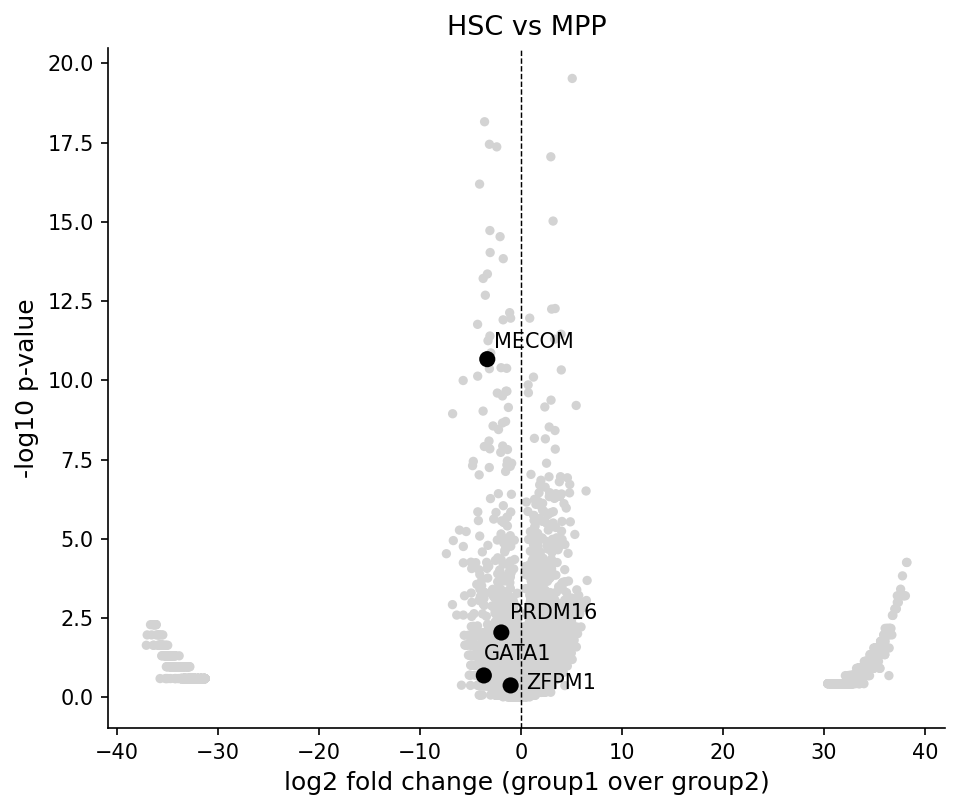

[saved] volcano_combined_panels/volcano_HSCvsMPP.png


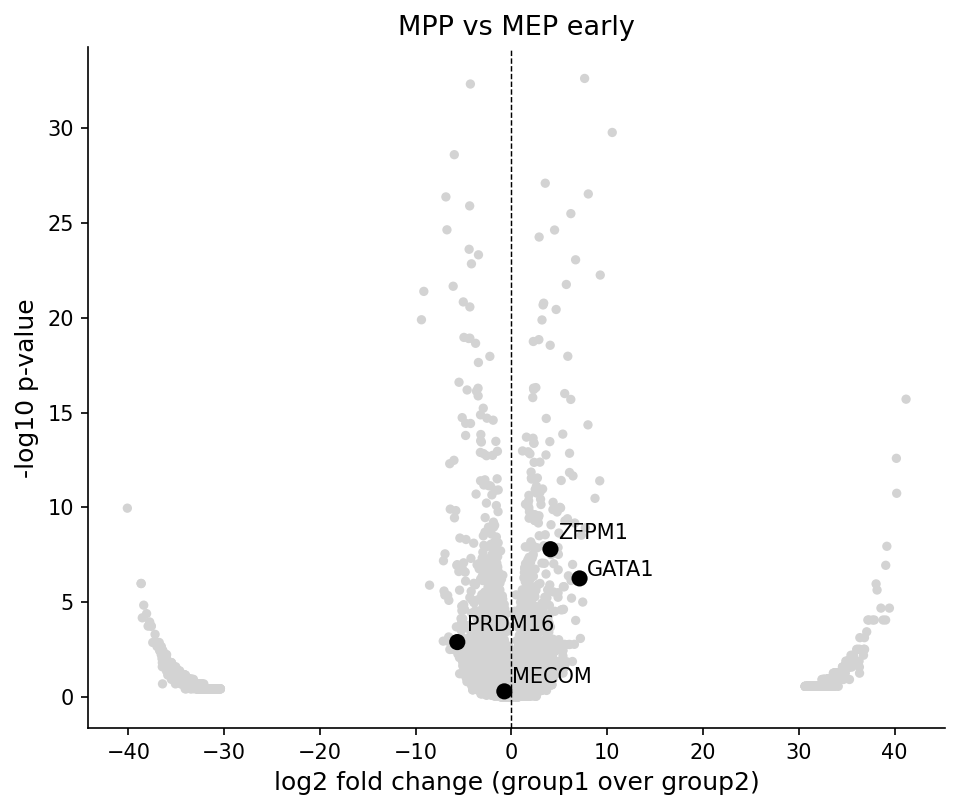

[saved] volcano_combined_panels/volcano_MPPvsMEPearly.png


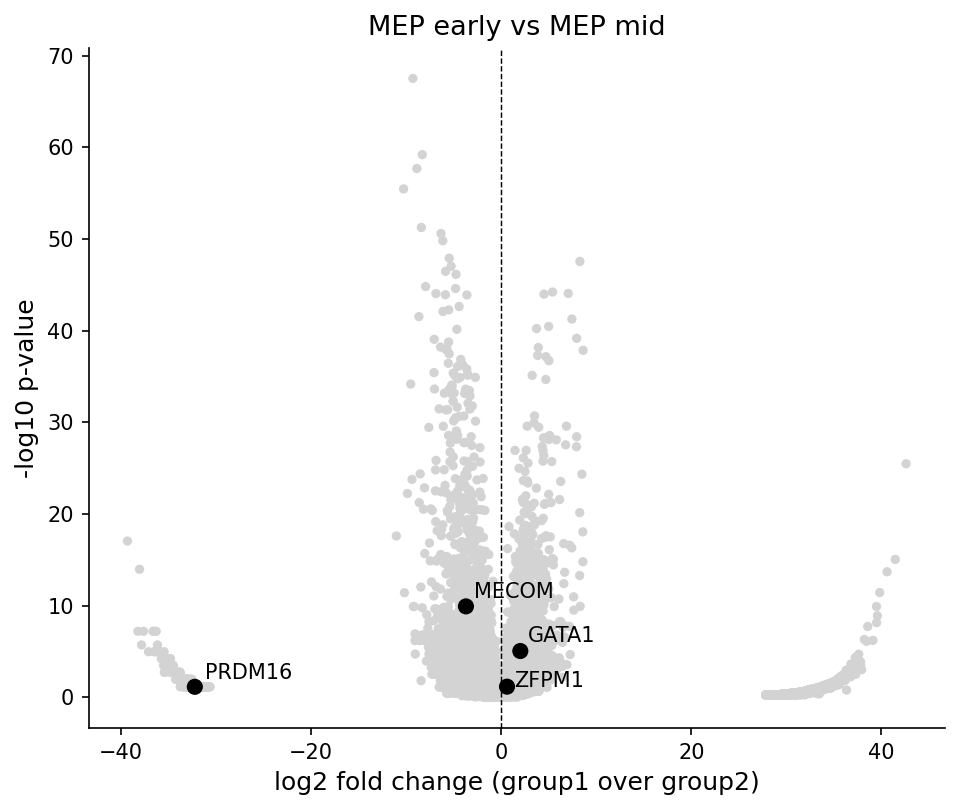

[saved] volcano_combined_panels/volcano_MEPearlyvsMEPmid.png


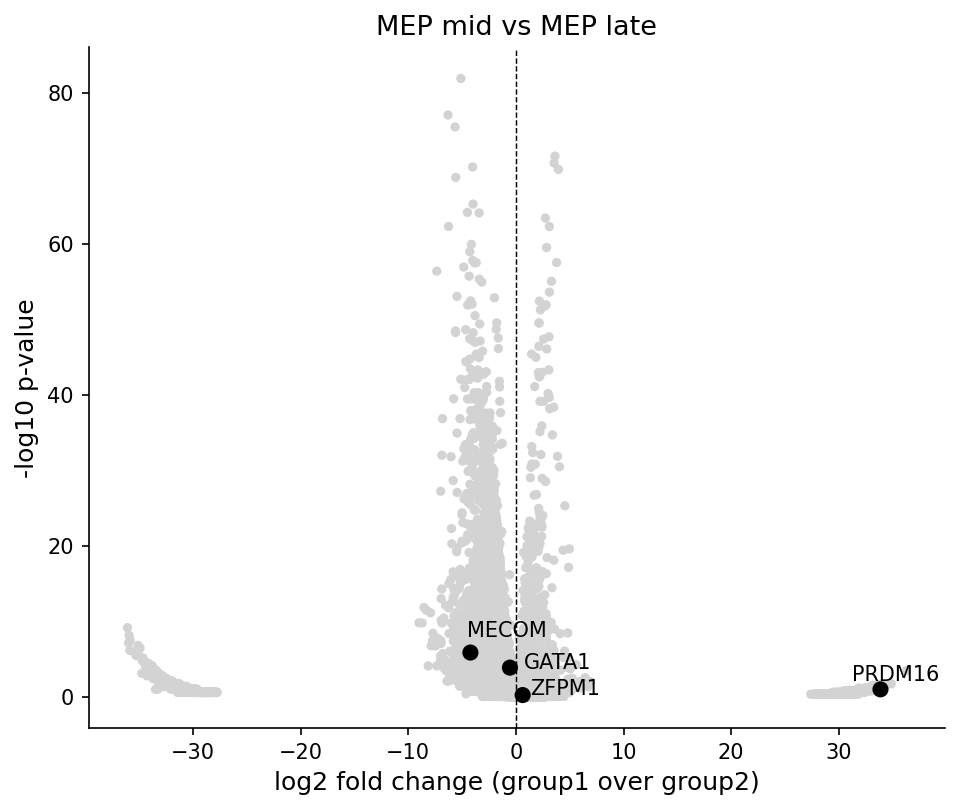

[saved] volcano_combined_panels/volcano_MEPmidvsMEPlate.png


In [33]:
highlight_genes = ["PRDM16", "MECOM", "ZFPM1", "GATA1"]

plot_volcano_panels(
    res_all_combined,
    highlight_genes=highlight_genes,
    outdir="volcano_combined_panels",
    use_adjusttext=True
)


## Dominik's way to fix the log-fold changes

In [34]:
ad.X = ad.layers["normalized_counts"].copy()
ad.layers["logp2"] = np.log2(ad.X.todense() + 2)

/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/anndata/_core/storage.py:85: ImplicitModificationWarning: Layer 'logp2' should not be a np.matrix, use np.ndarray instead.
  warnings.warn(msg, ImplicitModificationWarning)


In [35]:
res_fixed_lfc = de_all_genes_for_pairs(
    ad,
    pairs=pairs,
    label="celltype",
    use_raw=False,
    layer="logp2",
    method="wilcoxon",
    celltype_map={
        'HSC': 'HSC',
        'HMP': 'MPP',
        'MEP': 'MEP early',
        'EryPre1': 'MEP mid',
        'EryPre2': 'MEP late',
        'MylEry': 'MEP late'
    }
)
display(res_fixed_lfc.head())

/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:320: RuntimeWarning: invalid value encountered in divide
  scores = (
/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:320: RuntimeWarning: invalid value encountered in divide
  scores = (
/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:320: RuntimeWarning: invalid value encountered in divide
  scores = (
/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:320: RuntimeWarning: invalid value encountered in divide
  scores = (


,gene,scores,logfoldchanges,pval,fdr,comparison,n_cells_g1,n_cells_g2,log2FC,neglog10p
0,AJ009632.2,8.876476,1.537000,6.901155e-19,5.943965e-15,HSC vs MPP,95,121,2.217422,18.161078
1,PRKG1,8.692360,1.571899,3.549879e-18,1.844370e-14,HSC vs MPP,95,121,2.267771,17.449786
2,PLXDC2,8.671018,1.329321,4.282759e-18,1.844370e-14,HSC vs MPP,95,121,1.917804,17.368276
3,ZNF385D,8.357456,2.231000,6.408503e-17,1.839881e-13,HSC vs MPP,95,121,3.218653,16.193243
4,PRKG2,7.949333,1.118341,1.875183e-15,4.037738e-12,HSC vs MPP,95,121,1.613425,14.726956


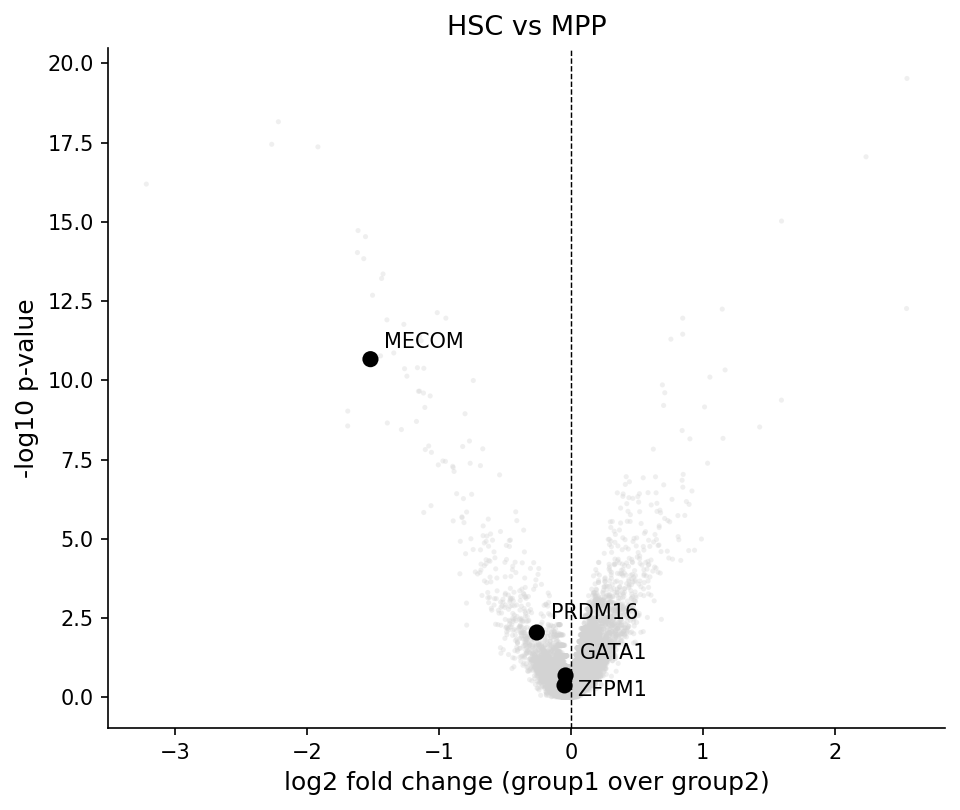

[saved] volcano_plots_corrected_lfc/volcano_HSCvsMPP.png


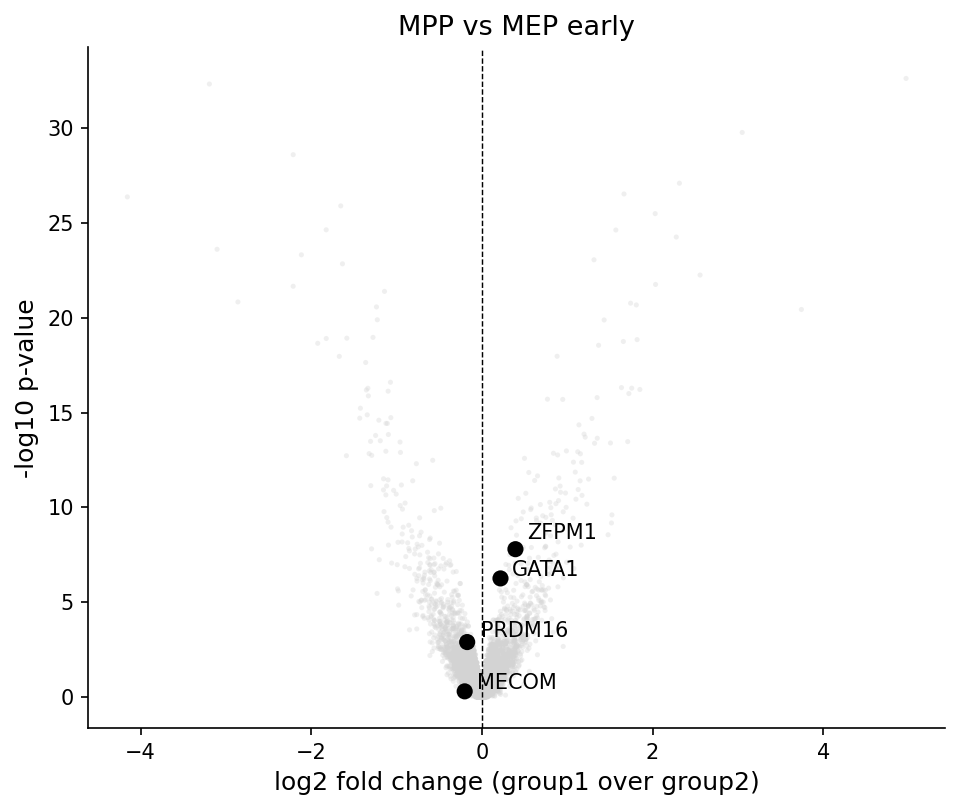

[saved] volcano_plots_corrected_lfc/volcano_MPPvsMEPearly.png


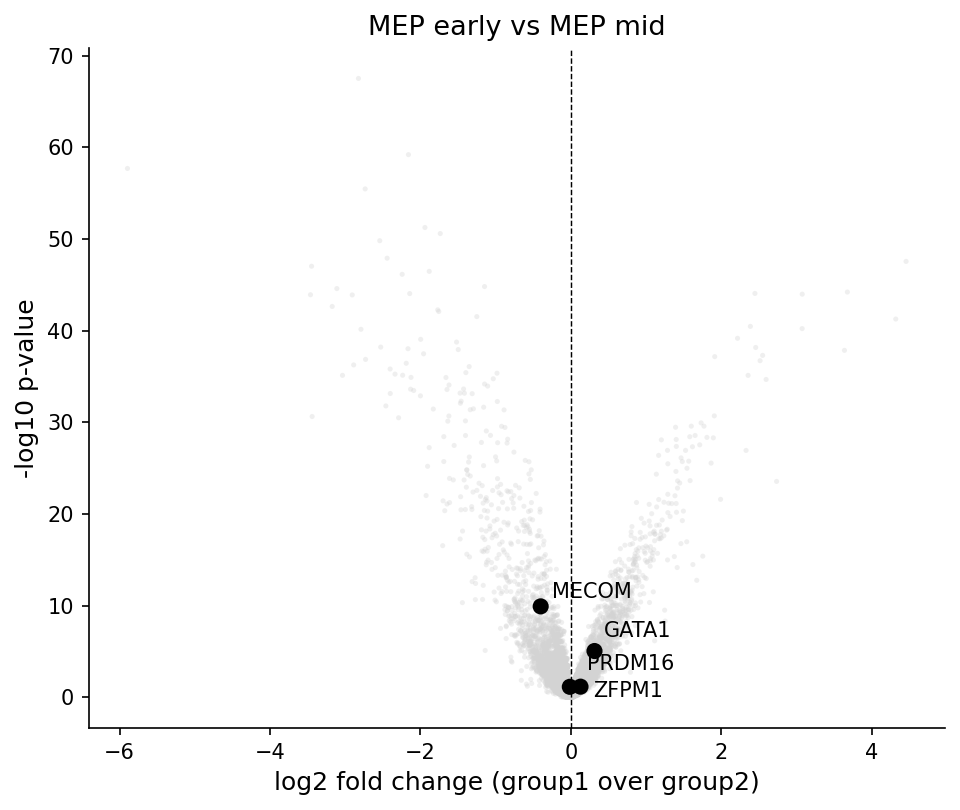

[saved] volcano_plots_corrected_lfc/volcano_MEPearlyvsMEPmid.png


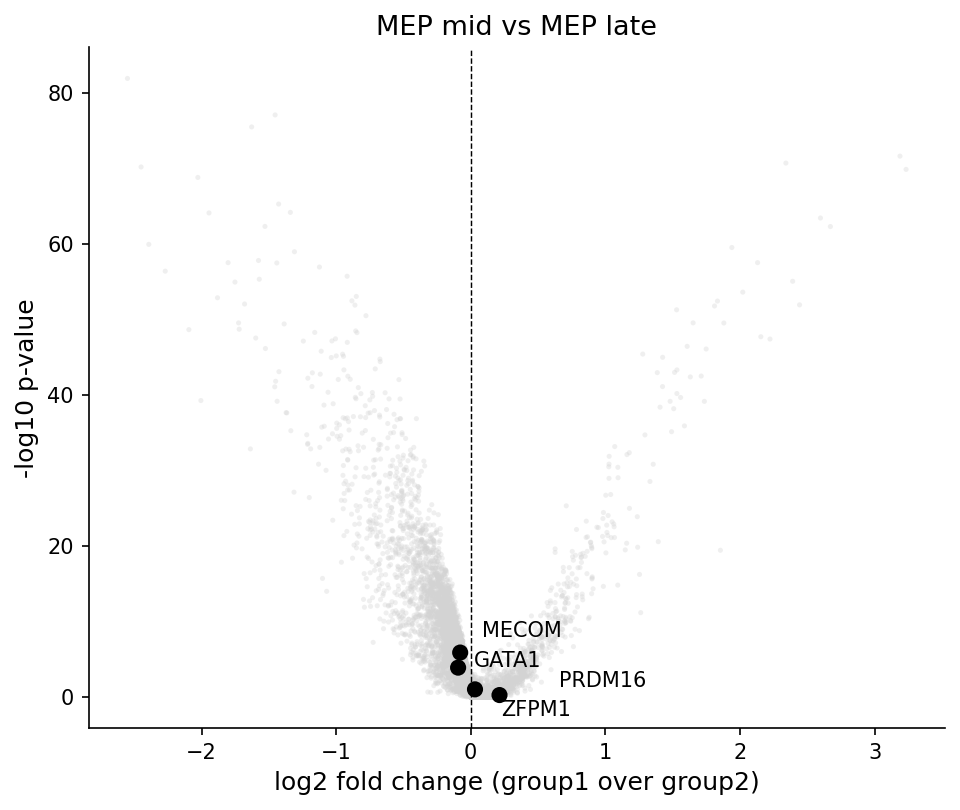

[saved] volcano_plots_corrected_lfc/volcano_MEPmidvsMEPlate.png


In [36]:
plot_volcano_panels(
    res_fixed_lfc,
    highlight_genes=genes_of_interest,
    outdir="volcano_plots_corrected_lfc",
    point_size=6,
    alpha=0.35,
    label_offset=(0.05, 0.2),
)

In [37]:
import matplotlib.pyplot as plt
from adjustText import adjust_text
import os

def plot_volcano_panels(
    df_all,
    highlight_genes,
    outdir="volcano_plots_combined",
    point_size=60,          # Larger background points
    highlight_size=120,     # Larger highlight points
    alpha=1.0,              # Fully opaque
    grey_color="#D3D3D3",   # Light grey
    show_labels=False       # Toggle for gene labels
):
    os.makedirs(outdir, exist_ok=True)
    comps = list(df_all["comparison"].dropna().unique())

    for comp in comps:
        d = df_all[df_all["comparison"] == comp].copy()
        if d.empty:
            continue

        fig, ax = plt.subplots(figsize=(6.5, 5.5))

        is_highlight = d["gene"].isin(highlight_genes)

        # Background genes (now plotting group2 over group1)
        ax.scatter(
            -d.loc[~is_highlight, "log2FC"],
            d.loc[~is_highlight, "neglog10p"],
            s=point_size,
            color=grey_color,
            edgecolors='none',
            alpha=alpha
        )

        # Highlighted genes
        ax.scatter(
            -d.loc[is_highlight, "log2FC"],
            d.loc[is_highlight, "neglog10p"],
            s=highlight_size,
            color='black',
            edgecolors='none',
            alpha=1.0,
            zorder=3
        )


        # Optional gene labels
        if show_labels:
            texts = []
            for g in highlight_genes:
                sub = d[d["gene"] == g]
                if sub.empty:
                    continue
                x = float(sub["log2FC"].iloc[0])
                y = float(sub["neglog10p"].iloc[0])
                txt = ax.text(
                    x + 0.05, y + 0.2, g,
                    fontsize=10,
                    color="black"
                )
                texts.append(txt)

            if texts:
                adjust_text(
                    texts,
                    only_move={"points": "y", "text": "xy", "objects": "xy"},
                    autoalign=True,
                    expand_points=(1.2, 1.4),
                    expand_text=(1.2, 1.4),
                    ax=ax,
                )

        # Axis styling
        ax.axvline(0, lw=2.8, color="black", linestyle="--")  # Center line, now thicker
        ax.set_xlabel("log2 fold change (group1 over group2)", fontsize=12)
        ax.set_ylabel("-log10 p-value", fontsize=12)
        ax.set_title(comp, fontsize=13)

        # Make x and y axis lines thicker
        ax.spines['bottom'].set_linewidth(2.8)
        ax.spines['left'].set_linewidth(2.8)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

        plt.tight_layout()

        # Save
        fn = os.path.join(outdir, f"volcano_{comp.replace(' ', '').replace(',', '_').replace('/', '-')}.png")
        plt.savefig(fn, dpi=300)
        plt.show()
        print(f"[saved] {fn}")


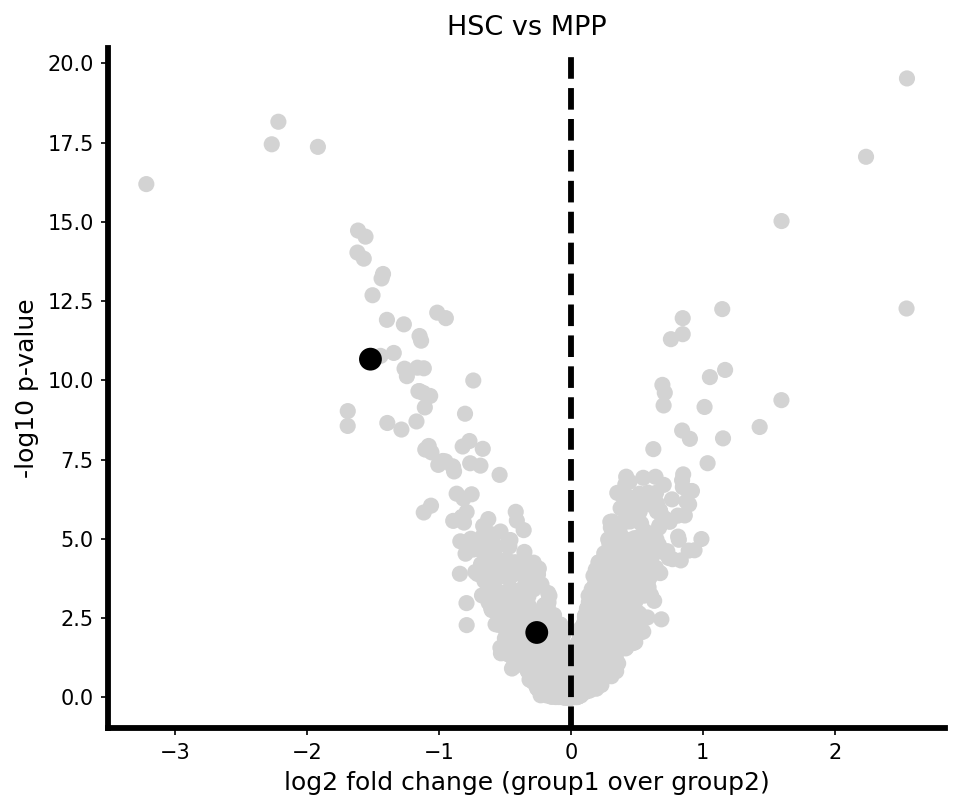

[saved] volcano_plots_corrected_lfc_MECOM_PRDM16/volcano_HSCvsMPP.png


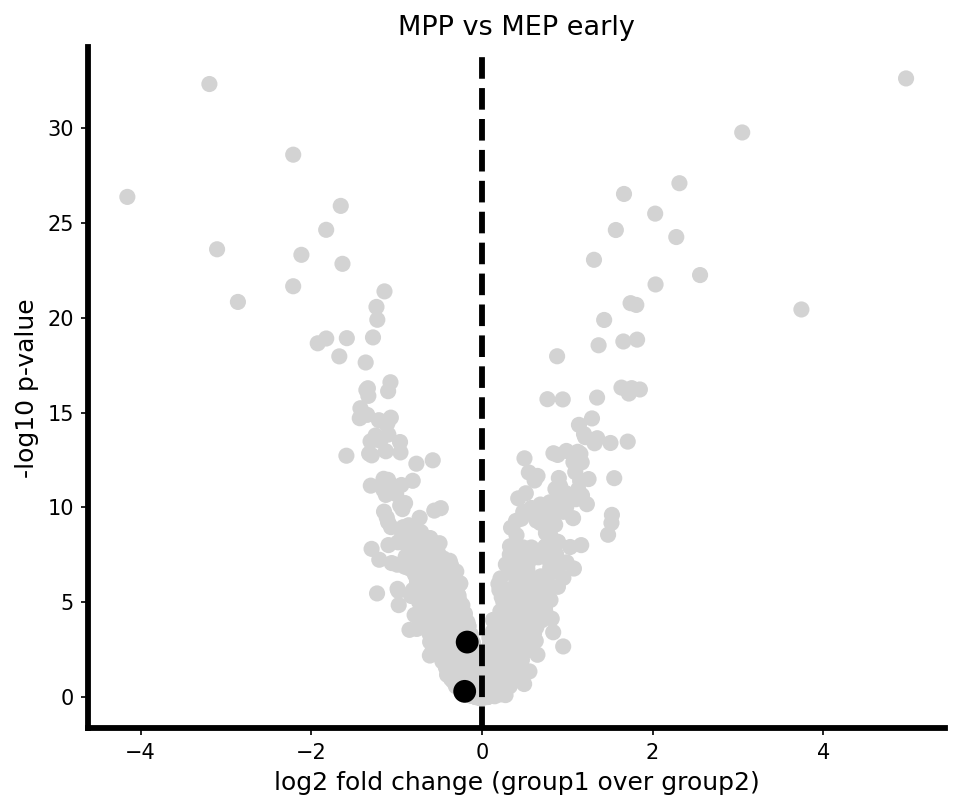

[saved] volcano_plots_corrected_lfc_MECOM_PRDM16/volcano_MPPvsMEPearly.png


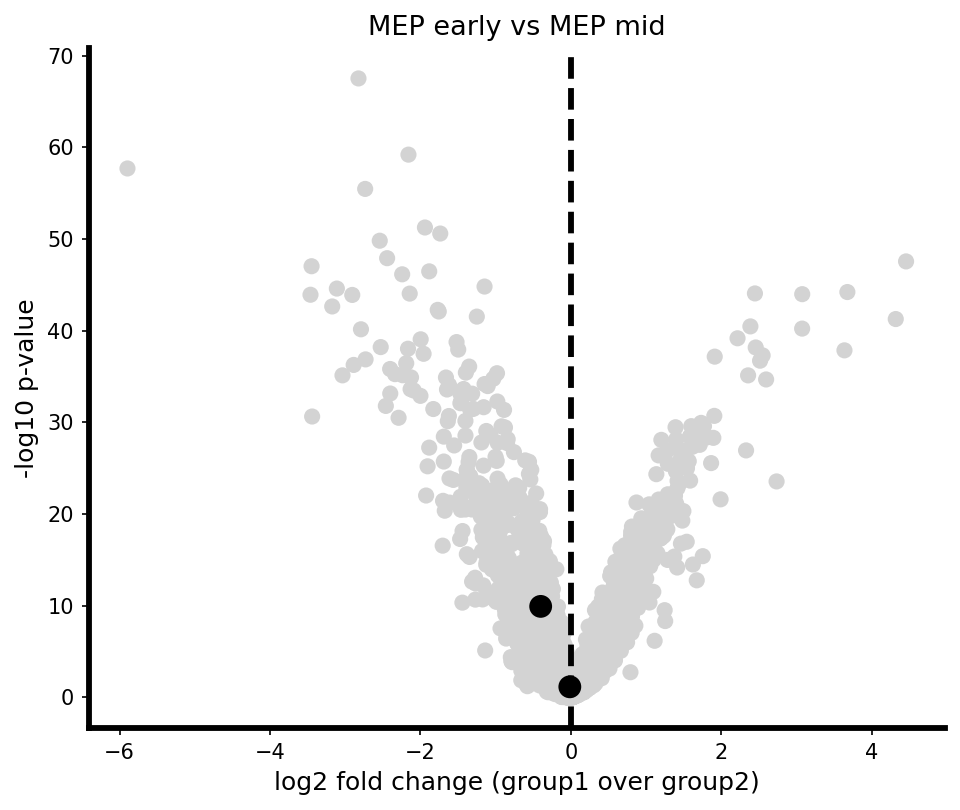

[saved] volcano_plots_corrected_lfc_MECOM_PRDM16/volcano_MEPearlyvsMEPmid.png


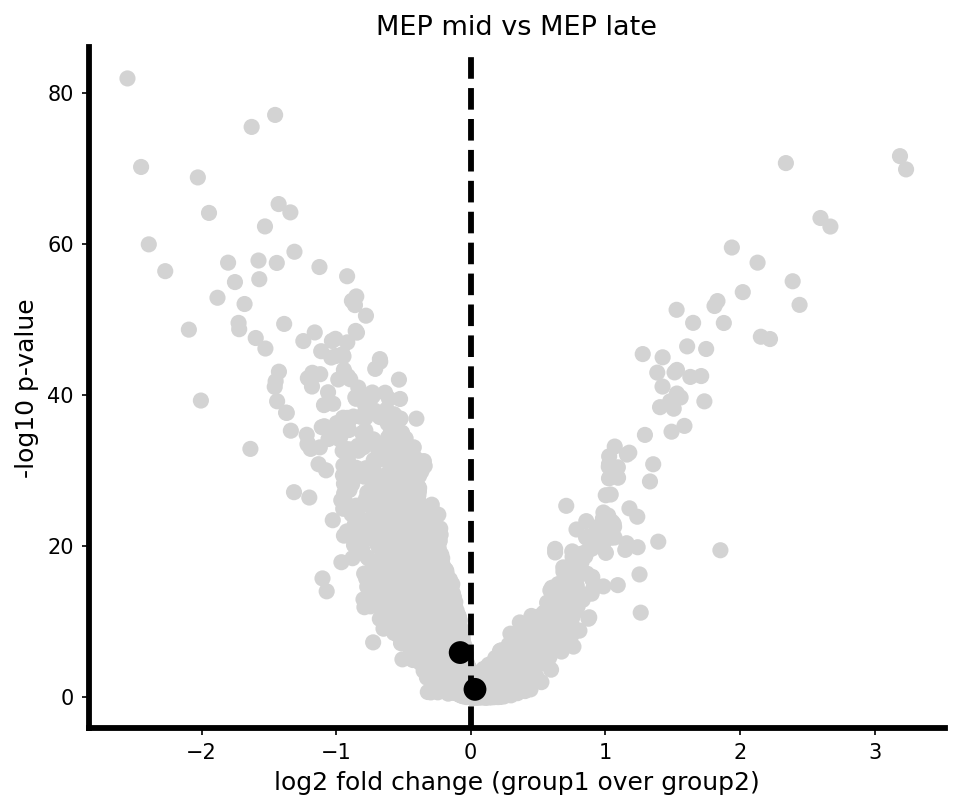

[saved] volcano_plots_corrected_lfc_MECOM_PRDM16/volcano_MEPmidvsMEPlate.png


In [38]:
genes_of_interest = ["PRDM16", "MECOM"]
plot_volcano_panels(
    res_fixed_lfc,
    highlight_genes=genes_of_interest,
    outdir="volcano_plots_corrected_lfc_MECOM_PRDM16",
    #point_size=6,
    #alpha=0.35,
    #label_offset=(0.05, 0.2),
)

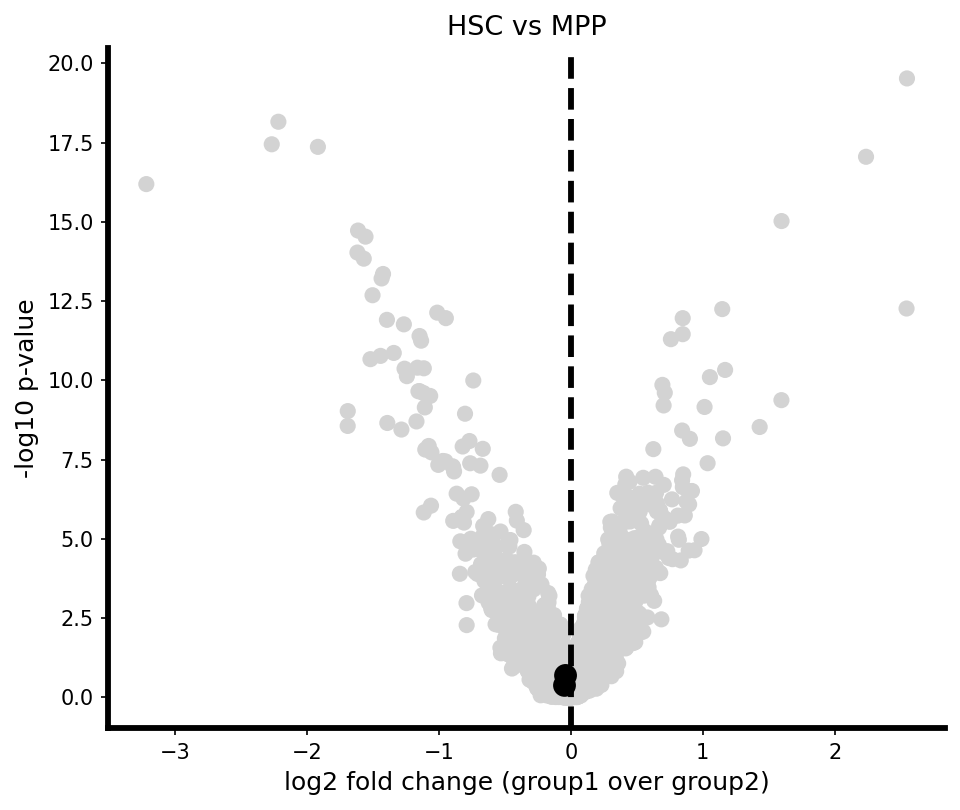

[saved] volcano_plots_corrected_lfc_ZFPM1_GATA1/volcano_HSCvsMPP.png


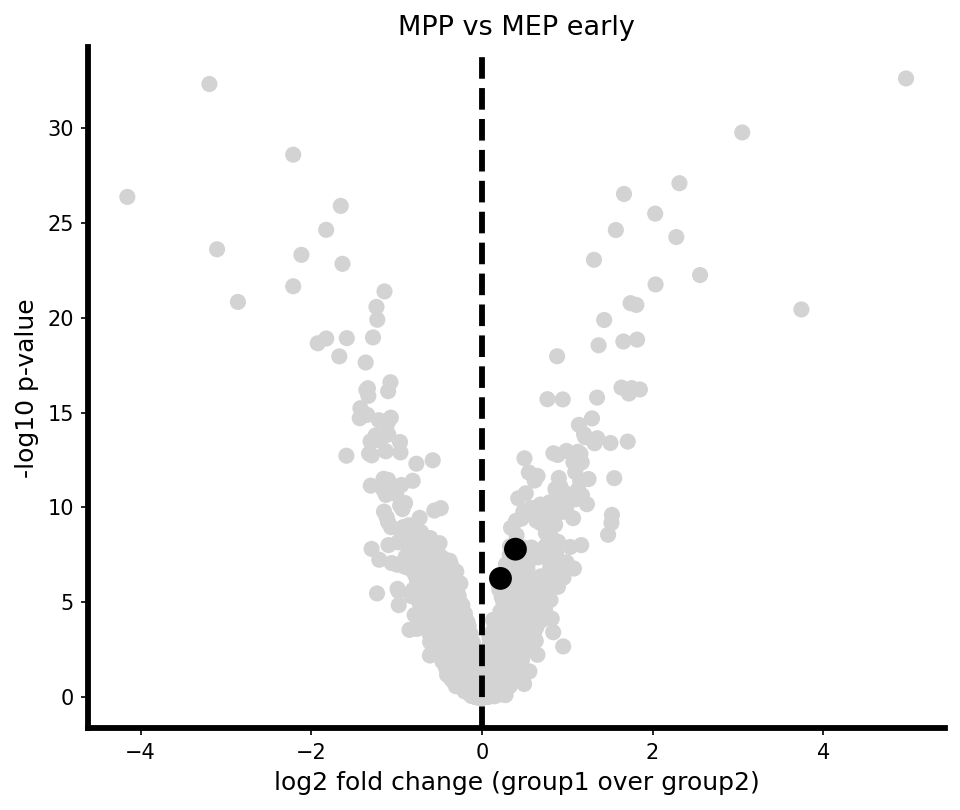

[saved] volcano_plots_corrected_lfc_ZFPM1_GATA1/volcano_MPPvsMEPearly.png


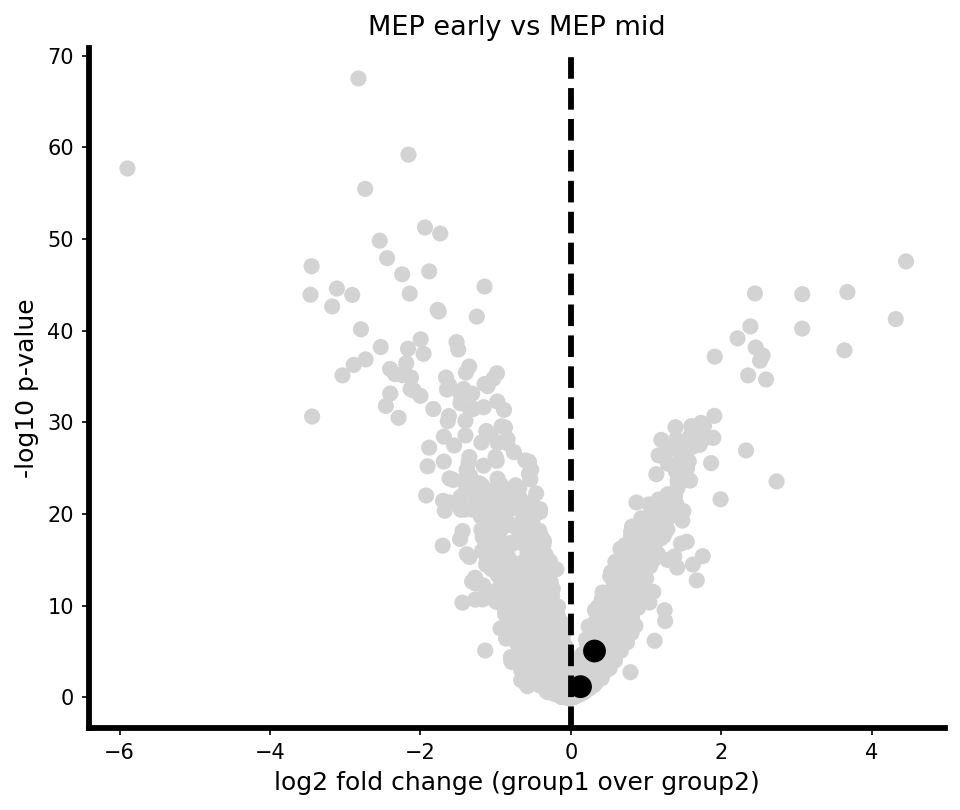

[saved] volcano_plots_corrected_lfc_ZFPM1_GATA1/volcano_MEPearlyvsMEPmid.png


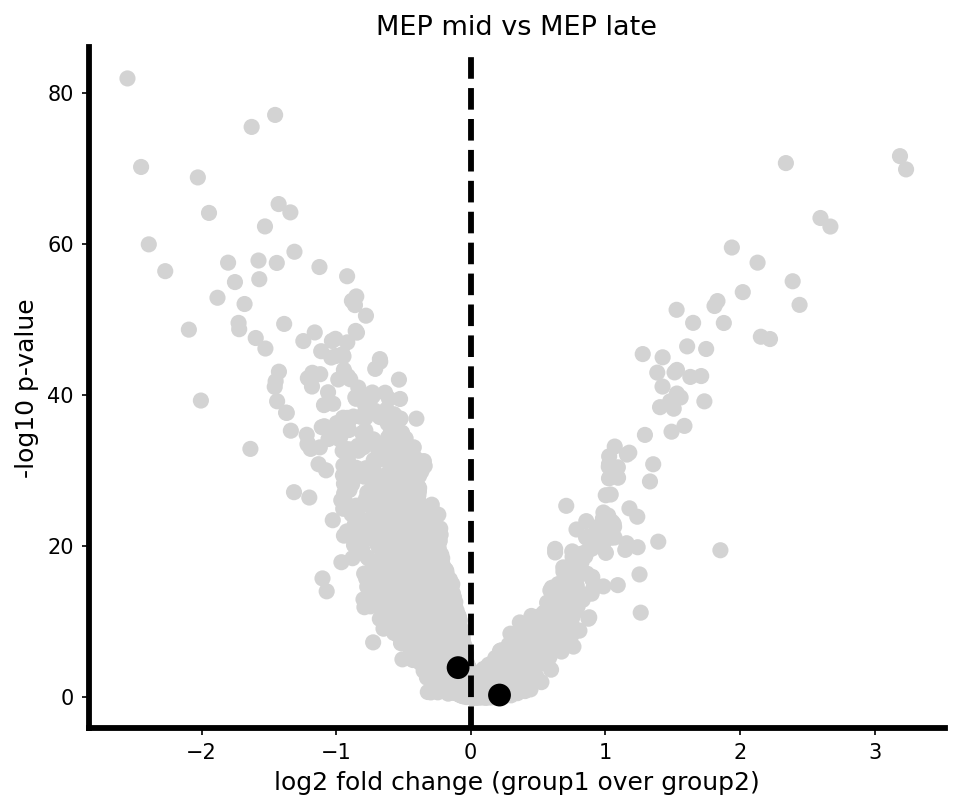

[saved] volcano_plots_corrected_lfc_ZFPM1_GATA1/volcano_MEPmidvsMEPlate.png


In [39]:
genes_of_interest = ["GATA1", "ZFPM1"]
plot_volcano_panels(
    res_fixed_lfc,
    highlight_genes=genes_of_interest,
    outdir="volcano_plots_corrected_lfc_ZFPM1_GATA1",
    #point_size=6,
    #alpha=0.35,
    #label_offset=(0.05, 0.2),
)

# Promoter versus Gene Body Gene Groups 

In [64]:
import numpy as np

MEP_Prom_genes = """


'NNMT' 'ACSM1' 'SLC38A8' 'PABPN1L' 'LINC00868' 'KLF1' 'NFIX' 'TMEM86B'
 'DNAJB8' 'GATA1'

"""


# Clean up and extract genes
MEP_Prom_genes = MEP_Prom_genes.replace("\n", " ").replace("'", "").split()
MEP_Prom_genes = np.asarray(sorted(set(MEP_Prom_genes)))  # use set() to remove duplicates if any

# Preview result
print(MEP_Prom_genes)


['ACSM1' 'DNAJB8' 'GATA1' 'KLF1' 'LINC00868' 'NFIX' 'NNMT' 'PABPN1L'
 'SLC38A8' 'TMEM86B']


In [65]:
exists = np.asarray([g in ad.var_names for g in MEP_Prom_genes])
n_missing = np.sum(~exists)
if n_missing:
    print(
        f"The following {n_missing} genes are not in the anndata: "
        + ", ".join(MEP_Prom_genes[~exists])
    )

The following 4 genes are not in the anndata: DNAJB8, LINC00868, PABPN1L, SLC38A8


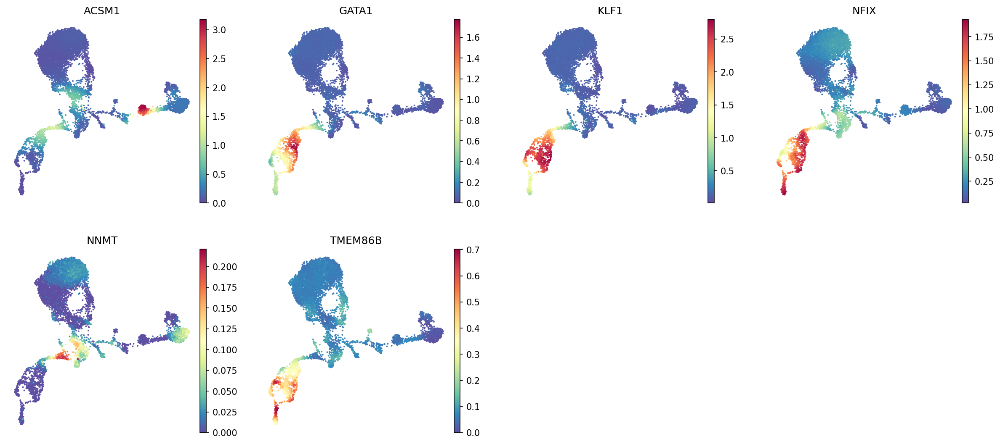

In [66]:
sc.pl.embedding(
    ad, basis="umap", color=MEP_Prom_genes[exists], layer="MAGIC_imputed_data", frameon=False
)

In [67]:
import numpy as np

MEP_GB_genes = """

'DNAJC6' 'STAM' 'SLC18A2' 'PDZD8' 'MICAL2' 'ZBTB16' 'ABCC4' 'RYR3'
 'RANBP10' 'ZFPM1' 'ANKRD27' 'ZEB2' 'SLC24A3' 'CTNNBL1' 'CSF2RB' 'ARMC8'
 'SLC39A8' 'RNF130' 'VKORC1L1' 'PVT1'

"""

# Clean up and extract genes
MEP_GB_genes = MEP_GB_genes.replace("\n", " ").replace("'", "").split()
MEP_GB_genes = np.asarray(sorted(set(MEP_GB_genes)))  # use set() to remove duplicates if any

# Preview result
print(MEP_GB_genes)


['ABCC4' 'ANKRD27' 'ARMC8' 'CSF2RB' 'CTNNBL1' 'DNAJC6' 'MICAL2' 'PDZD8'
 'PVT1' 'RANBP10' 'RNF130' 'RYR3' 'SLC18A2' 'SLC24A3' 'SLC39A8' 'STAM'
 'VKORC1L1' 'ZBTB16' 'ZEB2' 'ZFPM1']


In [68]:
exists = np.asarray([g in ad.var_names for g in MEP_GB_genes])
n_missing = np.sum(~exists)
if n_missing:
    print(
        f"The following {n_missing} genes are not in the anndata: "
        + ", ".join(MEP_GB_genes[~exists])
    )

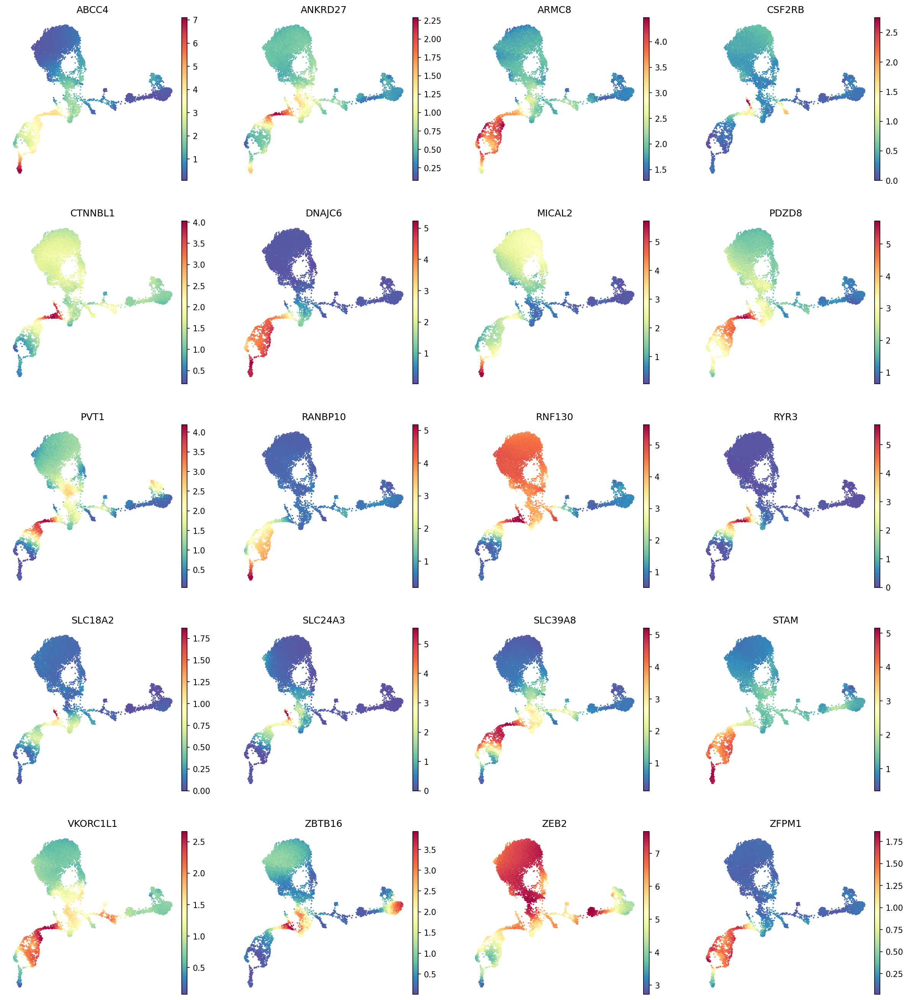

In [69]:
sc.pl.embedding(
    ad, basis="umap", color=MEP_GB_genes[exists], layer="MAGIC_imputed_data", frameon=False
)

In [46]:
import numpy as np

GMP_Prom_genes = """


'PTPRE' 'PKD1L2' 'GDF1' 'CERS1' 'TRPM2-AS' 'GPR151' 'CEBPD'

"""




# Clean up and extract genes
GMP_Prom_genes = GMP_Prom_genes.replace("\n", " ").replace("'", "").split()
GMP_Prom_genes = np.asarray(sorted(set(GMP_Prom_genes)))  # use set() to remove duplicates if any

# Preview result
print(GMP_Prom_genes)


['CEBPD' 'CERS1' 'GDF1' 'GPR151' 'PKD1L2' 'PTPRE' 'TRPM2-AS']


In [47]:
exists = np.asarray([g in ad.var_names for g in GMP_Prom_genes])
n_missing = np.sum(~exists)
if n_missing:
    print(
        f"The following {n_missing} genes are not in the anndata: "
        + ", ".join(GMP_Prom_genes[~exists])
    )

The following 5 genes are not in the anndata: CERS1, GDF1, GPR151, PKD1L2, TRPM2-AS


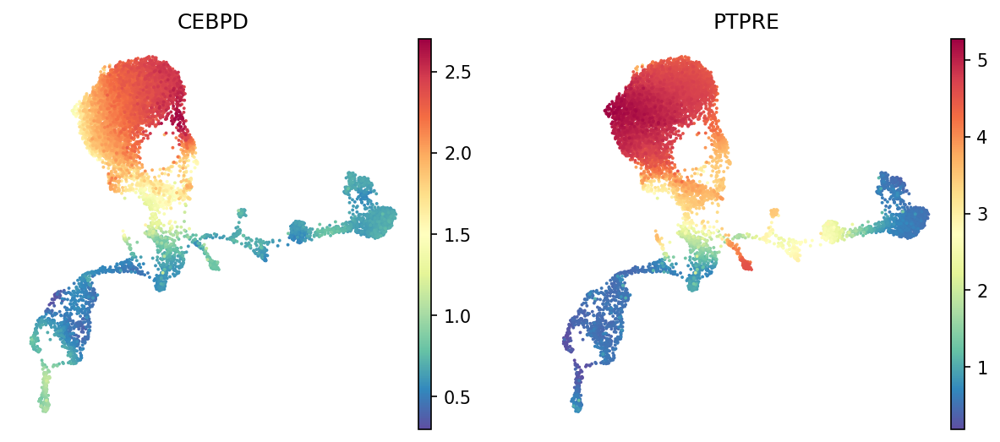

In [48]:
sc.pl.embedding(
    ad, basis="umap", color=GMP_Prom_genes[exists], layer="MAGIC_imputed_data", frameon=False
)

In [49]:
import numpy as np

GMP_GB_genes = """


'MIR181A1HG' 'ARHGEF18' 'FNDC3B'

"""

# Clean up and extract genes
GMP_GB_genes = GMP_GB_genes.replace("\n", " ").replace("'", "").split()
GMP_GB_genes = np.asarray(sorted(set(GMP_GB_genes)))  # use set() to remove duplicates if any

# Preview result
print(GMP_GB_genes)


['ARHGEF18' 'FNDC3B' 'MIR181A1HG']


In [50]:
exists = np.asarray([g in ad.var_names for g in GMP_GB_genes])
n_missing = np.sum(~exists)
if n_missing:
    print(
        f"The following {n_missing} genes are not in the anndata: "
        + ", ".join(GMP_GB_genes[~exists])
    )

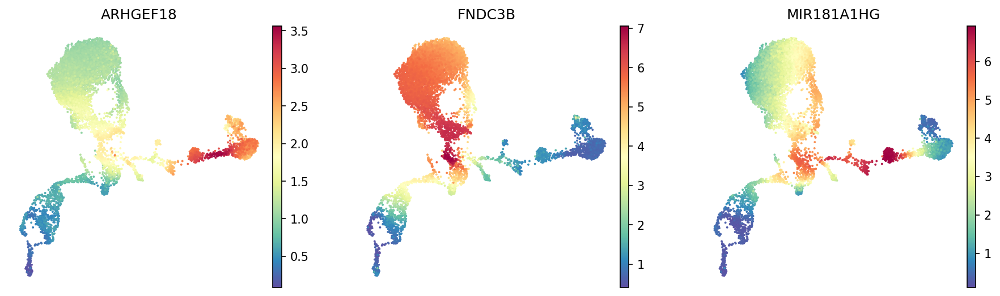

In [51]:
sc.pl.embedding(
    ad, basis="umap", color=GMP_GB_genes[exists], layer="MAGIC_imputed_data", frameon=False
)

In [52]:
import numpy as np

CLP_Prom_genes = """

'IRF8'

"""

# Clean up and extract genes
CLP_Prom_genes = CLP_Prom_genes.replace("\n", " ").replace("'", "").split()
CLP_Prom_genes = np.asarray(sorted(set(CLP_Prom_genes)))  # use set() to remove duplicates if any

# Preview result
print(CLP_Prom_genes)


['IRF8']


In [53]:
exists = np.asarray([g in ad.var_names for g in CLP_Prom_genes])
n_missing = np.sum(~exists)
if n_missing:
    print(
        f"The following {n_missing} genes are not in the anndata: "
        + ", ".join(CLP_Prom_genes[~exists])
    )

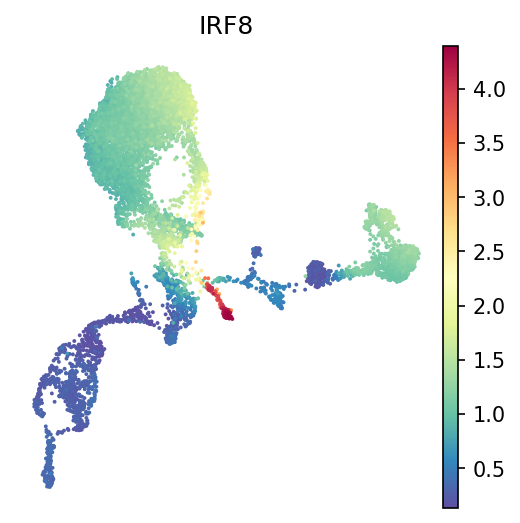

In [54]:
sc.pl.embedding(
    ad, basis="umap", color=CLP_Prom_genes[exists], layer="MAGIC_imputed_data", frameon=False
)

In [55]:
import numpy as np

CLP_GB_genes = """


'DOCK1' 'RBM38'

"""

# Clean up and extract genes
CLP_GB_genes = CLP_GB_genes.replace("\n", " ").replace("'", "").split()
CLP_GB_genes = np.asarray(sorted(set(CLP_GB_genes)))  # use set() to remove duplicates if any

# Preview result
print(CLP_GB_genes)


['DOCK1' 'RBM38']


In [56]:
exists = np.asarray([g in ad.var_names for g in CLP_GB_genes])
n_missing = np.sum(~exists)
if n_missing:
    print(
        f"The following {n_missing} genes are not in the anndata: "
        + ", ".join(CLP_GB_genes[~exists])
    )

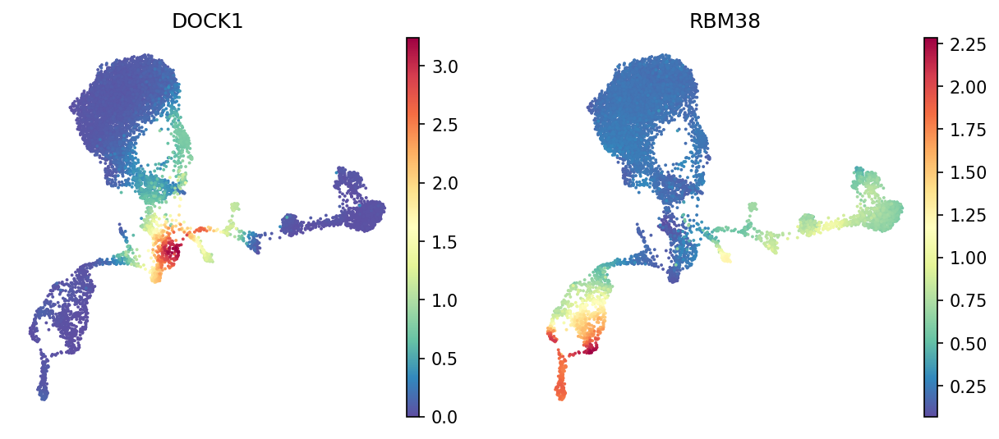

In [57]:
sc.pl.embedding(
    ad, basis="umap", color=CLP_GB_genes[exists], layer="MAGIC_imputed_data", frameon=False
)

# Pseudotime and Gene Trends

In [58]:
import palantir

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.lines import Line2D

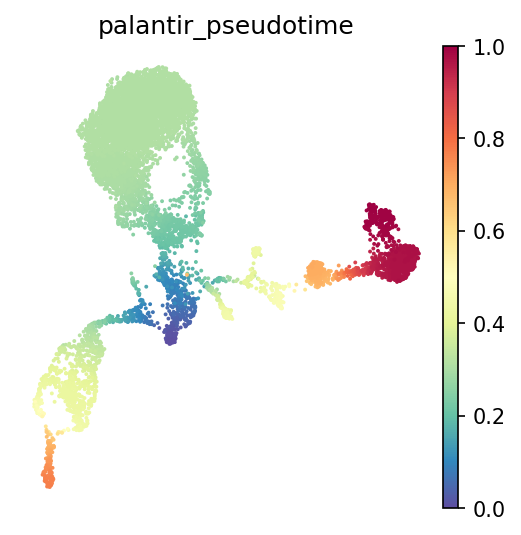

In [59]:
matplotlib.rcParams["figure.figsize"] = [4, 4]
matplotlib.rcParams["figure.dpi"] = 150
sc.pl.embedding(ad, "umap", color="palantir_pseudotime", frameon=False)

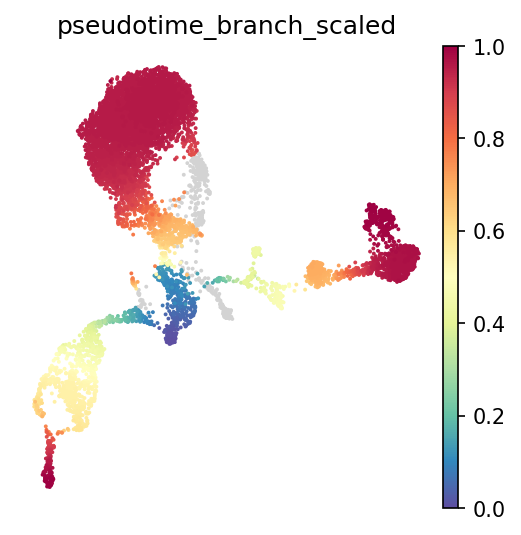

In [60]:
ad.obs["pseudotime_branch_scaled"] = np.nan

for branch in ["Ery", "Mono", "NaiveB"]:
    mask = ad.obsm["branch_masks"][branch]
    vals = ad.obs.loc[mask, "palantir_pseudotime"]
    scaled = (vals - vals.min()) / (vals.max() - vals.min())
    ad.obs.loc[mask, "pseudotime_branch_scaled"] = scaled

sc.pl.embedding(ad, "umap", color="pseudotime_branch_scaled", frameon=False)


fig = sc.pl.embedding(
    ad,
    basis="umap",
    color="pseudotime_branch_scaled",
    frameon=False,
    show=False,
    return_fig=True
)

fig.savefig("umap_pseudotime_0_to_1_scale.png", dpi=300, bbox_inches="tight")
plt.close(fig)


In [61]:
palantir.presults.compute_gene_trends(ad, ls=.3);

Mono
[2025-09-24 18:25:11,100] [INFO    ] Using sparse Gaussian Process since n_landmarks (500) < n_samples (5,750) and rank = 1.0.
[2025-09-24 18:25:11,100] [INFO    ] Using covariance function Matern52(ls=0.3).
[2025-09-24 18:25:11,154] [INFO    ] Sigma interpreted as element-wise standard deviation.
pDC
[2025-09-24 18:25:11,792] [INFO    ] Using sparse Gaussian Process since n_landmarks (500) < n_samples (548) and rank = 1.0.
[2025-09-24 18:25:11,792] [INFO    ] Using covariance function Matern52(ls=0.3).
[2025-09-24 18:25:11,807] [INFO    ] Sigma interpreted as element-wise standard deviation.
NaiveB
[2025-09-24 18:25:12,419] [INFO    ] Using sparse Gaussian Process since n_landmarks (500) < n_samples (1,826) and rank = 1.0.
[2025-09-24 18:25:12,420] [INFO    ] Using covariance function Matern52(ls=0.3).
[2025-09-24 18:25:12,446] [INFO    ] Sigma interpreted as element-wise standard deviation.
Ery
[2025-09-24 18:25:12,892] [INFO    ] Using sparse Gaussian Process since n_landmarks 

In [70]:
def plot_palantir_lineage_trends(
    ad,
    gene_sets,
    pad: float = 0.05,
    plot_cells: bool = True,
    plot_vlines: bool = True,
):
    """
    Plot Palantir gene trends with optional cell scatter and vertical lines.

    Parameters
    ----------
    ad : AnnData
        AnnData with palantir results, trends in ad.varm['gene_trends_<branch>'].
    gene_sets : dict
        { branch: {
            'label': str,
            'genes': [str,...],
            'colors': [str,...],
            'target_celltype': str,
            'include_celltypes': [str,...]
        }, ... }
    pad : float
        Fraction of (ymax-ymin) to offset cell‐scatter below ymin. Default = 0.05.
    plot_cells : bool
        Draw cell‐type scatter along pseudotime.
    plot_vlines : bool
        Draw shaded + vlines for target cell‐type window.
    """
    pt_all = ad.obs['palantir_pseudotime']
    ct_all = ad.obs['celltype']
    cats    = ct_all.cat.categories
    ct_map  = dict(zip(cats, ad.uns['celltype_colors']))
    masks   = ad.obsm['branch_masks']

    for branch, cfg in gene_sets.items():
        key = f'gene_trends_{branch}'
        if key not in ad.varm:
            print(f"Missing {key!r}, skipping.")
            continue

        # 1) trends_df: index=genes, columns=pseudotime
        trends_df = ad.varm[key]
        pt_grid   = pd.to_numeric(trends_df.columns, errors='coerce').values

        # 2) filter genes
        genes  = [g for g in cfg['genes'] if g in trends_df.index]
        colors = [c for g,c in zip(cfg['genes'], cfg['colors']) if g in trends_df.index]
        if not genes:
            print(f"No valid genes for {branch}, skipping.")
            continue

        # 3) mask cells by branch & inclusion list
        m_branch   = masks[branch]
        allowed_ct = cfg.get('include_celltypes', ct_all.cat.categories)
        final_mask = m_branch & ct_all.isin(allowed_ct)

        pt_branch   = pt_all[final_mask].values
        ct_branch   = ct_all[final_mask].values

        fig, ax = plt.subplots(figsize=(10, 4))

        # 4) plot gene trends & annotate ends
        for gene, col in zip(genes, colors):
            y = trends_df.loc[gene].values
            ax.plot(pt_grid, y, color=col)
            ax.text(
                pt_grid[-1], y[-1], f" {gene}",
                va='center', ha='left',
                color=col, fontsize=9, alpha=0.8
            )

        ax.set_title(cfg['label'], pad=10)
        ax.set_ylabel('Expression')
        ax.set_xlabel('Pseudotime')

        # compute y‐limits once
        ymin, ymax = ax.get_ylim()
        y_range = ymax - ymin
        cell_y  = ymin - pad * y_range

        # 5) optional: shade + vlines + window label
        if plot_vlines:
            tgt = cfg['target_celltype']
            sel = (ct_branch == tgt)
            if sel.any():
                t0 = np.quantile(pt_branch[sel], 0.05)
                t1 = np.quantile(pt_branch[sel], 0.95)
                ax.axvspan(t0, t1, color='gray', alpha=0.2)
                ax.axvline(t0, linestyle=':', color='gray')
                ax.axvline(t1, linestyle=':', color='gray')
                ax.text(
                    (t0 + t1)/2, ymax,
                    tgt, ha='center', va='bottom',
                    fontsize=10, color='gray'
                )

        # 6) optional: scatter cells at y=cell_y + legend
        if plot_cells:
            colors_sc = [ct_map[c] for c in ct_branch]
            ax.scatter(pt_branch, np.full_like(pt_branch, cell_y),
                       c=colors_sc, s=8, linewidths=0)

            present = np.unique(ct_branch)
            handles = [
                Line2D([0], [0],
                       marker='o', color='w',
                       markerfacecolor=ct_map[c],
                       markersize=6)
                for c in present
            ]
            ax.legend(
                handles, present,
                title='Cell type',
                bbox_to_anchor=(1.05, 1.02),
                loc='upper left',
                frameon=False,
                borderaxespad=1.0
            )

        plt.tight_layout()
        plt.show()

KeyError: 'target_celltype'

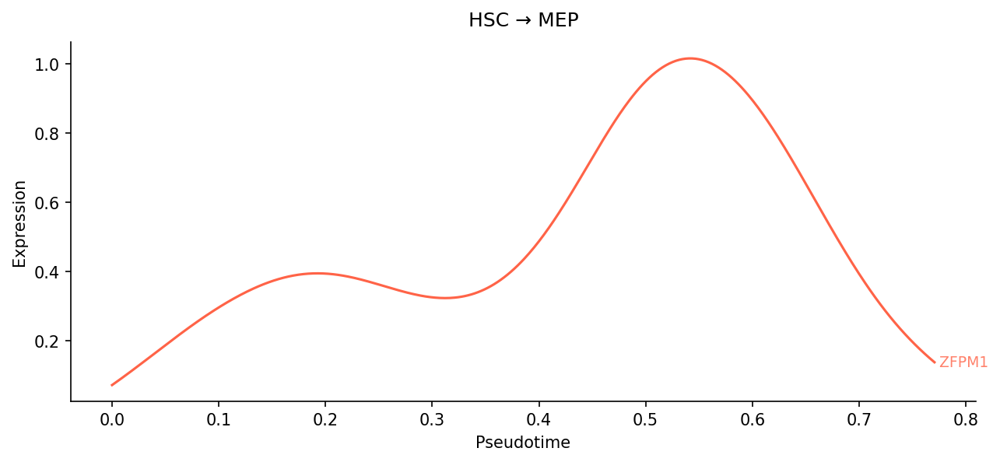

In [71]:
gene_sets = {
    'Ery': {
        'label': 'HSC → MEP',
        'genes': [
        #PnR    
        'ZFPM1'], 
        'colors': [
             #PnR    
            'tomato', 'tomato','tomato','tomato', 'tomato', 'tomato', 'tomato', 'tomato', 'tomato', 'tomato', 'tomato',
                  'tomato', 'tomato', 'tomato', 'tomato', 'tomato', 'tomato', 'tomato', 'tomato', 'tomato', 'tomato', 'tomato', 
                 #InR   
            'royalblue', 'royalblue', 'royalblue', 'royalblue', 'royalblue', 'royalblue', 'royalblue', 'royalblue', 'royalblue',
                  'royalblue', 'royalblue'],
        'include_celltypes': ['HSC', 'EryPre1', 'EryPre2', 'MEP', 'Ery', 'MylEry']
    }
}

plot_palantir_lineage_trends(ad, gene_sets, plot_cells=True, plot_vlines=True)

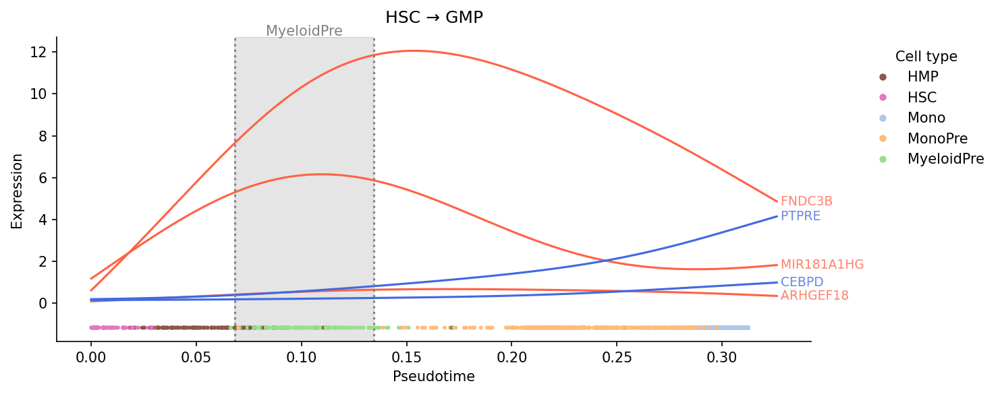

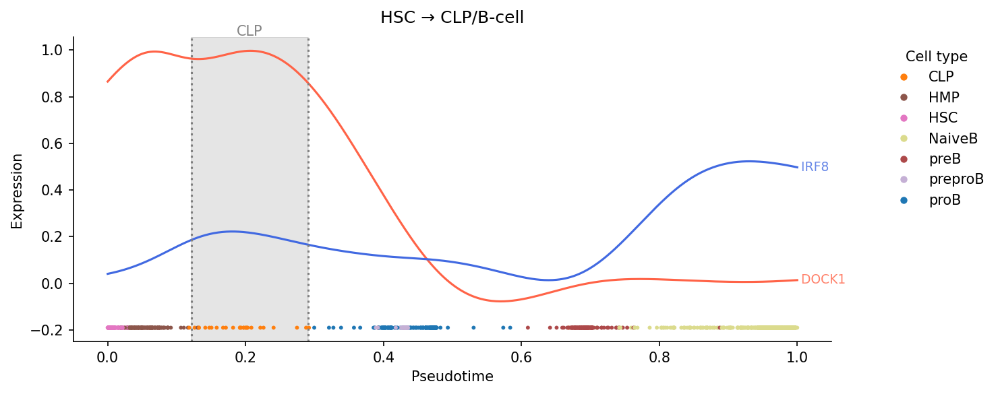

KeyError: 'target_celltype'

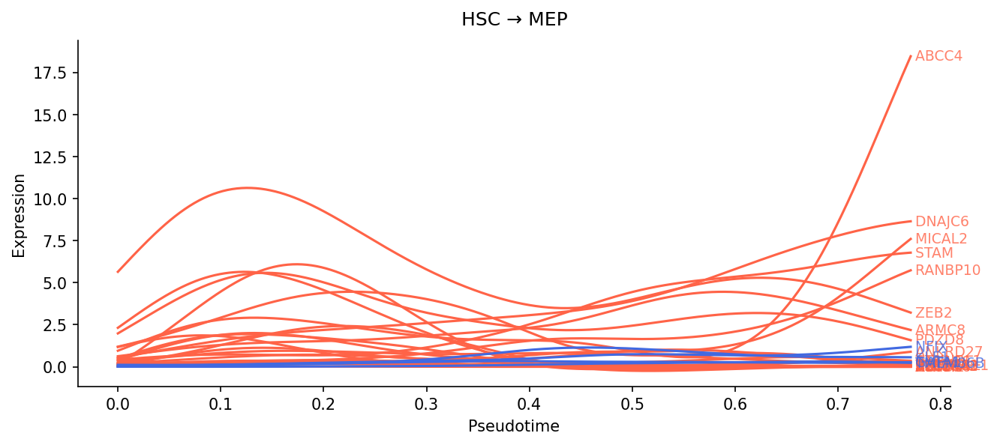

In [72]:
gene_sets = {
    'Mono': {
        'label': 'HSC → GMP',
        'genes': [
            #PnR
            'MIR181A1HG', 'ARHGEF18', 'FNDC3B',
            #InR 
            'PTPRE', 'PKD1L2', 'GDF1', 'CERS1', 'TRPM2-AS', 'GPR151', 'CEBPD'
                 ], 
        'colors': ['tomato', 'tomato','tomato', 'royalblue', 'royalblue', 'royalblue', 'royalblue', 'royalblue', 'royalblue', 'royalblue'],
        'target_celltype': 'MEP',
        'target_celltype': 'MyeloidPre',
        'include_celltypes': ['HSC', 'HMP', 'MonoPre', 'Mono', 'MyeloidPre']
    },
    'NaiveB': {
        'label': 'HSC → CLP/B-cell',
        'genes': [
            #PnR
            'DOCK1',
            #InR 
            'IRF8'
        ],
        'colors': ['tomato', 'royalblue', ],
        'target_celltype': 'CLP',
        'include_celltypes': ['HSC', 'HMP', 'CLP', 'NaiveB', 'preB', 'proB', 'preproB']
    },
    'Ery': {
        'label': 'HSC → MEP',
        'genes': [
        #PnR    
        'DNAJC6', 'STAM', 'SLC18A2', 'PDZD8', 'MICAL2', 'ZBTB16', 'ABCC4', 'RYR3',
        'RANBP10', 'ZFPM1', 'ANKRD27', 'ZEB2', 'SLC24A3', 'CTNNBL1', 'CSF2RB', 'ARMC8',
        'SLC39A8', 'RNF130', 'VKORC1L1', 'PVT1', 
         #InR 
        'NNMT', 'ACSM1', 'SLC38A8', 'PABPN1L', 'LINC00868', 'KLF1', 'NFIX', 'TMEM86B',
         'DNAJB8', 'GATA1'], 
        'colors': [
             #PnR    
            'tomato', 'tomato','tomato','tomato', 'tomato', 'tomato', 'tomato', 'tomato', 'tomato', 'tomato', 'tomato',
                  'tomato', 'tomato', 'tomato', 'tomato', 'tomato', 'tomato', 'tomato', 'tomato', 'tomato', 'tomato', 'tomato', 
                 #InR   
            'royalblue', 'royalblue', 'royalblue', 'royalblue', 'royalblue', 'royalblue', 'royalblue', 'royalblue', 'royalblue',
                  'royalblue', 'royalblue'],
        'include_celltypes': ['HSC', 'EryPre1', 'EryPre2', 'MEP', 'Ery', 'MylEry']
    }
}

plot_palantir_lineage_trends(ad, gene_sets, plot_cells=True, plot_vlines=True)

In [95]:
def plot_zscaled_gene_group_averages_combined(
    ad,
    branches: list,
    pooled_groups: dict,
    group_colors: dict,
    title: str = "Z-scaled trends by lineage: PnR vs InR"
):
    """
    Plot combined z-scaled average gene expression trends for gene groups across multiple branches.

    Parameters
    ----------
    ad : AnnData
        AnnData with Palantir results; expects ad.varm['gene_trends_<branch>'] per lineage.
    branches : list of str
        List of branch names (e.g., ["Ery", "Mono", "NaiveB"]).
    pooled_groups : dict
        { group_label: {branch_name: [genes]} }
    group_colors : dict
        { group_label: color_string }
    title : str
        Plot title.
    """
    import numpy as np
    import matplotlib.pyplot as plt

    fig, ax = plt.subplots(figsize=(10, 5))

    for group, branch_genes in pooled_groups.items():
        all_trends = []

        for branch, genes in branch_genes.items():
            key = f'gene_trends_{branch}'
            if key not in ad.varm:
                print(f"Missing: {key}")
                continue

            trends_df = ad.varm[key]
            pt_grid = pd.to_numeric(trends_df.columns, errors="coerce").values

            valid_genes = [g for g in genes if g in trends_df.index]
            if not valid_genes:
                print(f"No valid genes for {group} in {branch}")
                continue

            zscaled = []
            for g in valid_genes:
                x = trends_df.loc[g].values
                x_z = (x - np.mean(x)) / np.std(x)
                zscaled.append(x_z)

            all_trends.append(np.vstack(zscaled))

        if not all_trends:
            print(f"No data for group: {group}")
            continue

        all_trends = np.vstack(all_trends)
        mean_trend = np.mean(all_trends, axis=0)
        std_trend = np.std(all_trends, axis=0)

        color = group_colors.get(group, "black")
        ax.plot(pt_grid, mean_trend, label=group, color=color, linewidth=2.5)
        ax.fill_between(pt_grid, mean_trend - std_trend, mean_trend + std_trend, color=color, alpha=0.2)

    # Plot formatting
    #ax.axhline(0, linestyle="--", color="gray", linewidth=1)
    ax.set_title(title, fontsize=14)
    ax.set_xlabel("Pseudotime", fontsize=12)
    ax.set_ylabel("Average expression (z-scaled)", fontsize=12)
    ax.set_xlim(0, 1)

    for spine in ["bottom", "left"]:
        ax.spines[spine].set_linewidth(2.0)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    ax.tick_params(axis="both", width=2, length=6, labelsize=12)
    ax.legend(frameon=False, bbox_to_anchor=(1.02, 1), loc="upper left")

    plt.tight_layout()
    plt.savefig('PnR_InR_zscaled_trends_combined.png', dpi=300)
    plt.show()


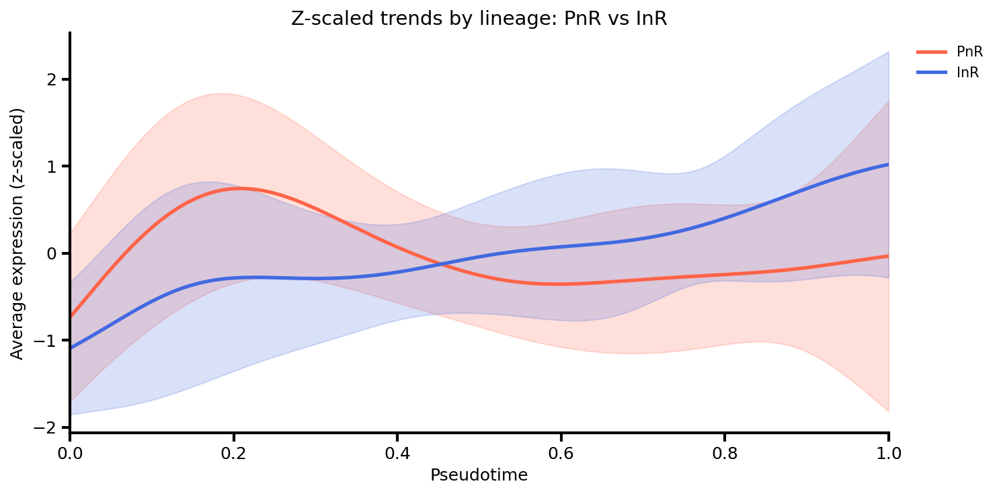

In [96]:
# Define pooled gene sets by lineage
pooled_groups = {
    "PnR": {
        "Ery": ['DNAJC6', 'STAM', 'SLC18A2', 'PDZD8', 'MICAL2', 'ZBTB16', 'ABCC4', 'RYR3',
                'RANBP10', 'ZFPM1', 'ANKRD27', 'ZEB2', 'SLC24A3', 'CTNNBL1', 'CSF2RB',
                'ARMC8', 'SLC39A8', 'RNF130', 'VKORC1L1', 'PVT1'],
        "Mono": ["MIR181A1HG", "ARHGEF18", "FNDC3B"],
        "NaiveB": ["DOCK1"]
    },
    "InR": {
        "Ery": ['NNMT', 'ACSM1', 'SLC38A8', 'PABPN1L', 'LINC00868', 'KLF1', 'NFIX', 'TMEM86B',
                'DNAJB8', 'GATA1'],
        "Mono": ["PTPRE", "PKD1L2", "GDF1", "CERS1", "TRPM2-AS", "GPR151", "CEBPD"],
        "NaiveB": ["IRF8"]
    }
}

# Define colors
group_colors = {
    "PnR": "tomato",
    "InR": "royalblue"
}

# Call the plotter
plot_zscaled_gene_group_averages_combined(
    ad=ad,
    branches=["Ery", "Mono", "NaiveB"],
    pooled_groups=pooled_groups,
    group_colors=group_colors,
    title="Z-scaled trends by lineage: PnR vs InR"
)


In [101]:
import numpy as np
import pandas as pd
from scipy.stats import ttest_ind

def compare_mean_zscores_in_windows(
    ad,
    branches: list,
    pooled_groups: dict,
    time_windows: list,
    equal_var: bool = False
):
    """
    Compare average z-scaled expression (per gene) across specific pseudotime windows,
    pooled over multiple branches.

    Parameters
    ----------
    ad : AnnData
        AnnData with Palantir trends in ad.varm['gene_trends_<branch>'].
    branches : list
        List of branches to include (e.g., ["Ery", "Mono", "NaiveB"]).
    pooled_groups : dict
        {
            "PnR": {"Ery": [genes], ...},
            "InR": {"Ery": [genes], ...}
        }
    time_windows : list of tuples
        List of (start, end) pseudotime intervals (0–1 range).
    equal_var : bool
        Use equal variance in t-test? (default=False = Welch's)

    Returns
    -------
    results_df : pd.DataFrame
        DataFrame with mean z-scores, t-stats, p-values per time window.
    """
    results = []

    for t0, t1 in time_windows:
        pnr_z = []
        inr_z = []

        for branch in branches:
            key = f"gene_trends_{branch}"
            if key not in ad.varm:
                continue

            trends_df = ad.varm[key]
            pt = pd.to_numeric(trends_df.columns, errors='coerce').values

            mask = (pt >= t0) & (pt <= t1)
            if not mask.any():
                continue

            for g in pooled_groups["PnR"].get(branch, []):
                if g in trends_df.index:
                    x = trends_df.loc[g].values
                    x_z = (x - x.mean()) / x.std()
                    pnr_z.append(x_z[mask].mean())

            for g in pooled_groups["InR"].get(branch, []):
                if g in trends_df.index:
                    x = trends_df.loc[g].values
                    x_z = (x - x.mean()) / x.std()
                    inr_z.append(x_z[mask].mean())

        if pnr_z and inr_z:
            t_stat, p_val = ttest_ind(pnr_z, inr_z, equal_var=equal_var)
            results.append({
                "window_start": t0,
                "window_end": t1,
                "PnR_mean": np.mean(pnr_z),
                "InR_mean": np.mean(inr_z),
                "t_stat": t_stat,
                "pval": p_val,
                "n_PnR": len(pnr_z),
                "n_InR": len(inr_z)
            })

    return pd.DataFrame(results)


In [102]:
time_windows = [(0.0, 0.1), (0.1, 0.2), (0.2, 0.3), (0.3, 0.4),
                (0.4, 0.5), (0.5, 0.6), (0.6, 0.7), (0.7, 0.8),
                (0.8, 0.9), (0.9, 1.0)]

res_window_df = compare_mean_zscores_in_windows(
    ad,
    branches=["Ery", "Mono", "NaiveB"],
    pooled_groups=pooled_groups,
    time_windows=time_windows,
    equal_var=False
)

res_window_df


/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/scipy/stats/_stats_py.py:1114: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/scipy/stats/_stats_py.py:1114: RuntimeWarning: invalid value encountered in scalar multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero


,window_start,window_end,PnR_mean,InR_mean,t_stat,pval,n_PnR,n_InR
0,0.0,0.1,0.051331,-0.742498,1.990278,0.067207,24,9
1,0.1,0.2,0.816281,-0.212546,2.491704,0.026181,24,9
2,0.2,0.3,0.304659,0.083173,0.722316,0.481420,24,9
3,0.3,0.4,-0.315077,0.490266,-2.118372,0.062744,24,9
4,0.4,0.5,-0.461145,0.168313,-1.754618,0.118733,21,7
5,0.5,0.6,-0.358945,0.100923,-1.168050,0.270504,21,7
6,0.6,0.7,-0.187849,-0.014018,-0.436353,0.672275,21,7
7,0.7,0.8,0.022289,0.263525,-0.493803,0.628311,21,7
8,0.8,0.9,-0.796972,1.595427,NaN,NaN,1,1
9,0.9,1.0,-0.804289,2.020400,NaN,NaN,1,1


In [97]:
import numpy as np
import pandas as pd
from scipy.stats import ttest_ind
from scipy.interpolate import interp1d

def compare_zscaled_pooled_gene_groups_at_pseudotimes(
    ad,
    branches: list,
    pooled_groups: dict,
    query_times: list,
    n_grid: int = 200,
    equal_var: bool = False,
    verbose: bool = True
):
    """
    Compare z-scaled pooled gene groups (PnR vs InR) across multiple branches
    at given pseudotime points using Welch's t-test. Forces all branches onto a shared 0–1 pseudotime grid.

    Parameters
    ----------
    ad : AnnData
        AnnData with Palantir results in ad.varm['gene_trends_<branch>'].
    branches : list
        Branch names to use, e.g. ["Ery", "Mono", "NaiveB"].
    pooled_groups : dict
        {"PnR": {branch: [genes...]}, "InR": {branch: [genes...]}}
    query_times : list of floats
        Pseudotime values to test (0–1).
    n_grid : int
        Number of pseudotime points to interpolate to (default=200).
    equal_var : bool
        Assume equal variance in t-test (default False = Welch).
    verbose : bool
        Print results.

    Returns
    -------
    results_df : pd.DataFrame
        One row per pseudotime, with group means, t-stat, and p-value.
    """
    common_grid = np.linspace(0, 1, n_grid)
    pooled_expr = { "PnR": [], "InR": [] }

    for branch in branches:
        key = f"gene_trends_{branch}"
        if key not in ad.varm:
            print(f"⚠️ Missing {key}, skipping branch {branch}")
            continue

        trends_df = ad.varm[key]
        branch_grid = pd.to_numeric(trends_df.columns, errors="coerce").values.astype(float)

        for group in ["PnR", "InR"]:
            genes = pooled_groups.get(group, {}).get(branch, [])
            valid_genes = [g for g in genes if g in trends_df.index]
            if not valid_genes:
                continue

            for g in valid_genes:
                y = trends_df.loc[g].values.astype(float)
                if np.std(y) == 0:
                    continue  # Skip flat genes to avoid division by zero

                # Z-scale each gene before interpolation
                y_z = (y - np.mean(y)) / np.std(y)
                f = interp1d(branch_grid, y_z, kind="linear", bounds_error=False, fill_value="extrapolate")
                y_interp = f(common_grid)

                pooled_expr[group].append(y_interp)

    # Check data presence
    mat_pnr = np.vstack(pooled_expr["PnR"]) if pooled_expr["PnR"] else None
    mat_inr = np.vstack(pooled_expr["InR"]) if pooled_expr["InR"] else None

    if mat_pnr is None or mat_inr is None:
        raise ValueError("Missing pooled data for PnR or InR.")

    results = []
    for t in query_times:
        idx = np.argmin(np.abs(common_grid - t))
        actual_t = common_grid[idx]

        vals_pnr = mat_pnr[:, idx]
        vals_inr = mat_inr[:, idx]

        stat, pval = ttest_ind(vals_pnr, vals_inr, equal_var=equal_var)

        results.append({
            "pseudotime": actual_t,
            "PnR_mean": np.mean(vals_pnr),
            "InR_mean": np.mean(vals_inr),
            "t_stat": stat,
            "pval": pval
        })

    results_df = pd.DataFrame(results)

    if verbose:
        print("🧪 Z-scored PnR vs InR comparison across branches:")
        for _, row in results_df.iterrows():
            print(f"  • Pseudotime ≈ {row['pseudotime']:.2f}: "
                  f"PnR mean={row['PnR_mean']:.3f}, "
                  f"InR mean={row['InR_mean']:.3f}, "
                  f"t={row['t_stat']:.3f}, p={row['pval']:.2e}")

    return results_df


In [98]:
res_z_df = compare_zscaled_pooled_gene_groups_at_pseudotimes(
    ad,
    branches=["Ery", "Mono", "NaiveB"],
    pooled_groups=pooled_groups,  # same structure as for plotting
    query_times=[0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1],
    n_grid=200,
    equal_var=False
)


🧪 Z-scored PnR vs InR comparison across branches:
  • Pseudotime ≈ 0.00: PnR mean=-0.735, InR mean=-1.091, t=1.058, p=3.04e-01
  • Pseudotime ≈ 0.10: PnR mean=0.706, InR mean=-0.400, t=2.400, p=3.21e-02
  • Pseudotime ≈ 0.20: PnR mean=0.674, InR mean=-0.087, t=2.161, p=4.68e-02
  • Pseudotime ≈ 0.30: PnR mean=-0.083, InR mean=0.350, t=-1.176, p=2.65e-01
  • Pseudotime ≈ 0.40: PnR mean=-0.636, InR mean=1.069, t=-2.461, p=3.63e-02
  • Pseudotime ≈ 0.50: PnR mean=-0.815, InR mean=1.683, t=-2.319, p=4.41e-02
  • Pseudotime ≈ 0.60: PnR mean=-0.843, InR mean=2.065, t=-1.986, p=7.60e-02
  • Pseudotime ≈ 0.70: PnR mean=-0.840, InR mean=2.683, t=-1.904, p=8.63e-02
  • Pseudotime ≈ 0.80: PnR mean=-0.774, InR mean=3.551, t=-1.936, p=7.97e-02
  • Pseudotime ≈ 0.90: PnR mean=-0.729, InR mean=4.310, t=-1.879, p=8.60e-02
  • Pseudotime ≈ 1.00: PnR mean=-0.683, InR mean=4.932, t=-1.770, p=1.02e-01


In [45]:
import numpy as np
import pandas as pd
from scipy.stats import ttest_ind
from scipy.interpolate import interp1d

def compare_pooled_gene_groups_at_pseudotimes(
    ad,
    branches: list,
    pooled_groups: dict,
    query_times: list,
    n_grid: int = 200,
    equal_var: bool = False,
    verbose: bool = True
):
    """
    Compare pooled gene groups (PnR vs InR) across multiple branches
    at given pseudotime points using Welch's t-test.
    Forces all branches onto a shared 0–1 pseudotime grid.

    Parameters
    ----------
    ad : AnnData
        AnnData with Palantir results in ad.varm['gene_trends_<branch>'].
    branches : list
        Branch names to use, e.g. ["Ery", "Mono", "NaiveB"].
    pooled_groups : dict
        {"PnR": {branch: [genes...]}, "InR": {branch: [genes...]}}
    query_times : list of floats
        Pseudotime values to test (0–1).
    n_grid : int
        Number of pseudotime points to interpolate to (default=200).
    equal_var : bool
        Assume equal variance in t-test (default False = Welch).
    verbose : bool
        Print results.

    Returns
    -------
    results_df : pd.DataFrame
        One row per pseudotime, with group means, t-stat, and p-value.
    """
    # Define a common pseudotime grid from 0–1
    common_grid = np.linspace(0, 1, n_grid)

    pooled_expr = { "PnR": [], "InR": [] }

    for branch in branches:
        key = f"gene_trends_{branch}"
        if key not in ad.varm:
            print(f"⚠️ Missing {key}, skipping branch {branch}")
            continue

        trends_df = ad.varm[key]
        branch_grid = pd.to_numeric(trends_df.columns, errors="coerce").values.astype(float)

        for group in ["PnR", "InR"]:
            genes = pooled_groups[group].get(branch, [])
            valid_genes = [g for g in genes if g in trends_df.index]
            if not valid_genes:
                continue

            for g in valid_genes:
                y = trends_df.loc[g].values.astype(float)

                # Interpolate gene trend to common grid
                f = interp1d(branch_grid, y, kind="linear", bounds_error=False, fill_value="extrapolate")
                y_interp = f(common_grid)

                pooled_expr[group].append(y_interp)

    # Concatenate across all genes from all branches
    mat_pnr = np.vstack(pooled_expr["PnR"]) if pooled_expr["PnR"] else None
    mat_inr = np.vstack(pooled_expr["InR"]) if pooled_expr["InR"] else None

    if mat_pnr is None or mat_inr is None:
        raise ValueError("Missing pooled data for PnR or InR.")

    results = []
    for t in query_times:
        idx = np.argmin(np.abs(common_grid - t))
        actual_t = common_grid[idx]

        vals_pnr = mat_pnr[:, idx]
        vals_inr = mat_inr[:, idx]

        stat, pval = ttest_ind(vals_pnr, vals_inr, equal_var=equal_var)

        results.append({
            "pseudotime": actual_t,
            "PnR_mean": np.mean(vals_pnr),
            "InR_mean": np.mean(vals_inr),
            "t_stat": stat,
            "pval": pval
        })

    results_df = pd.DataFrame(results)

    if verbose:
        print("🧪 Comparing pooled PnR vs InR across branches (aligned to common grid):")
        for _, row in results_df.iterrows():
            print(f"  • Pseudotime ≈ {row['pseudotime']:.2f}: "
                  f"PnR mean={row['PnR_mean']:.3f}, "
                  f"InR mean={row['InR_mean']:.3f}, "
                  f"t={row['t_stat']:.3f}, p={row['pval']:.2e}")

    return results_df


In [46]:
res_df = compare_pooled_gene_groups_at_pseudotimes(
    ad,
    branches=["Ery", "Mono", "NaiveB"],
    pooled_groups=pooled_groups,
    query_times=[0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1],
    n_grid=200,
    equal_var=False
)

res_df.head(11)


🧪 Comparing pooled PnR vs InR across branches (aligned to common grid):
  • Pseudotime ≈ 0.00: PnR mean=0.797, InR mean=0.051, t=3.153, p=4.22e-03
  • Pseudotime ≈ 0.10: PnR mean=2.586, InR mean=0.287, t=3.879, p=6.40e-04
  • Pseudotime ≈ 0.20: PnR mean=2.609, InR mean=0.565, t=3.308, p=2.34e-03
  • Pseudotime ≈ 0.30: PnR mean=1.794, InR mean=0.970, t=1.445, p=1.64e-01
  • Pseudotime ≈ 0.40: PnR mean=1.453, InR mean=2.017, t=-0.479, p=6.41e-01
  • Pseudotime ≈ 0.50: PnR mean=1.560, InR mean=3.057, t=-0.774, p=4.54e-01
  • Pseudotime ≈ 0.60: PnR mean=1.728, InR mean=3.604, t=-0.804, p=4.36e-01
  • Pseudotime ≈ 0.70: PnR mean=2.163, InR mean=4.343, t=-0.760, p=4.60e-01
  • Pseudotime ≈ 0.80: PnR mean=2.844, InR mean=5.271, t=-0.675, p=5.09e-01
  • Pseudotime ≈ 0.90: PnR mean=3.460, InR mean=6.129, t=-0.616, p=5.46e-01
  • Pseudotime ≈ 1.00: PnR mean=4.077, InR mean=6.966, t=-0.566, p=5.78e-01


,pseudotime,PnR_mean,InR_mean,t_stat,pval
0,0.000000,0.797080,0.051377,3.152987,0.004220
1,0.100503,2.586326,0.286942,3.878976,0.000640
2,0.201005,2.608616,0.565356,3.308064,0.002343
3,0.301508,1.794297,0.970219,1.444876,0.164366
4,0.402010,1.452744,2.016567,-0.478839,0.640770
5,0.502513,1.559746,3.056741,-0.773562,0.453666
6,0.597990,1.727787,3.604384,-0.803665,0.436009
7,0.698492,2.163450,4.342983,-0.759738,0.460263
8,0.798995,2.844496,5.271473,-0.675432,0.509458
9,0.899497,3.460294,6.128521,-0.615981,0.545929


## Examine expression of Pol II Pausing Regulators

In [115]:
import numpy as np

PolII_Pausing_genes = """

'CDK9' 'NELFA' 'NELFB' 'NELFCD' 'NELFE' 'SUPT5H' 'SUPT4H1' 

"""
#'EZH1' 'EZH2' 
# Clean up and extract genes
PolII_Pausing_genes = PolII_Pausing_genes.replace("\n", " ").replace("'", "").split()
PolII_Pausing_genes = np.asarray(sorted(set(PolII_Pausing_genes)))  # use set() to remove duplicates if any

# Preview result
print(PolII_Pausing_genes)


['CDK9' 'NELFA' 'NELFB' 'NELFCD' 'NELFE' 'SUPT4H1' 'SUPT5H']


In [116]:
exists = np.asarray([g in ad.var_names for g in PolII_Pausing_genes])
n_missing = np.sum(~exists)
if n_missing:
    print(
        f"The following {n_missing} genes are not in the anndata: "
        + ", ".join(PolII_Pausing_genes[~exists])
    )

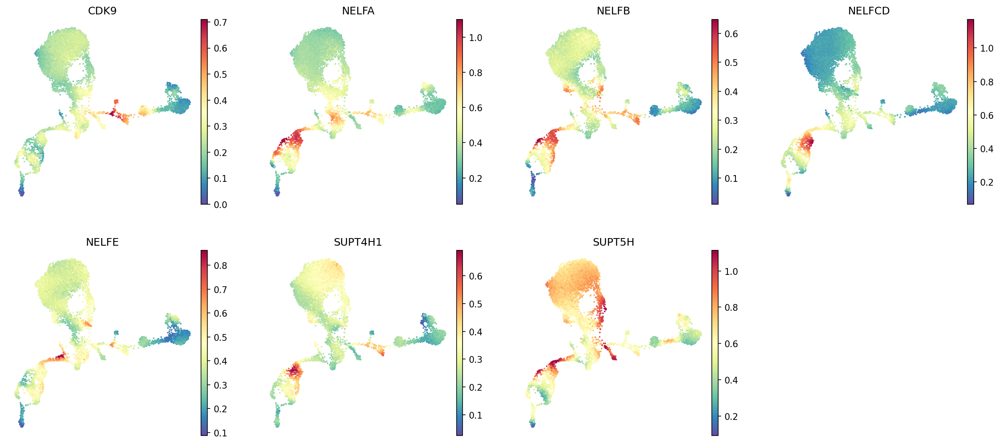

In [117]:
sc.pl.embedding(
    ad, basis="umap", color=PolII_Pausing_genes[exists], layer="MAGIC_imputed_data", frameon=False
)

# Dotplots

In [118]:
# Ensure raw var index matches var_names
ad.raw.var.index = ad.var_names

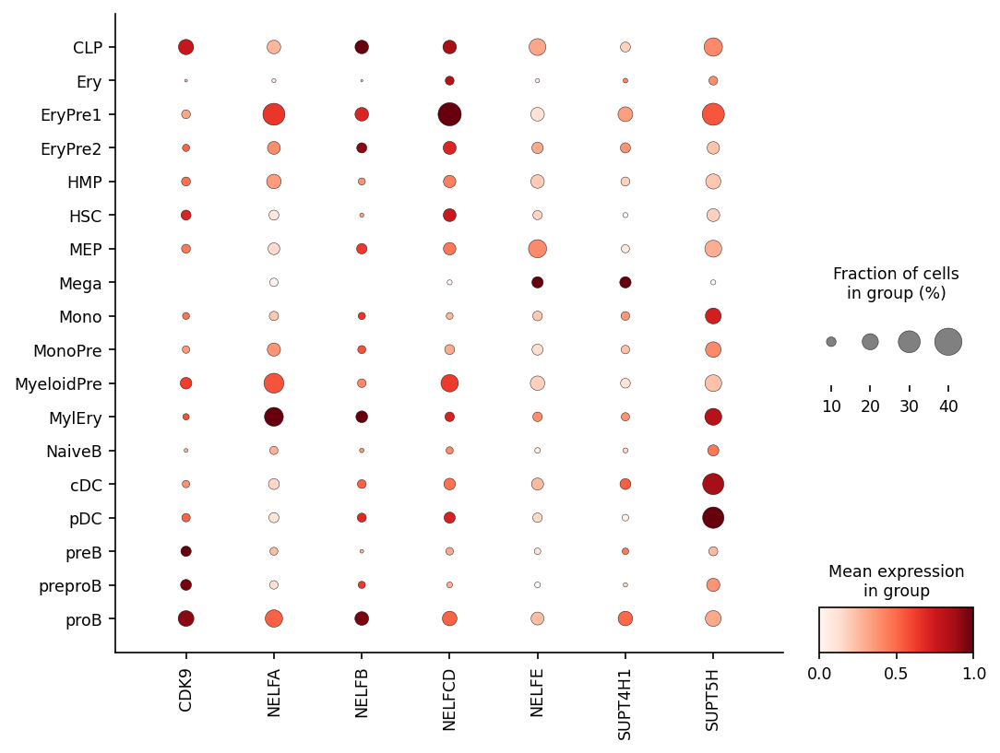

In [119]:
sc.pl.dotplot(
    ad,
    var_names=PolII_Pausing_genes[exists],   # list of genes
    groupby="celltype",        # group along y-axis
    use_raw=False,             # use processed data
    standard_scale="var",      # optional: scale across genes
    figsize=(8, 6)             # adjust size to fit
)

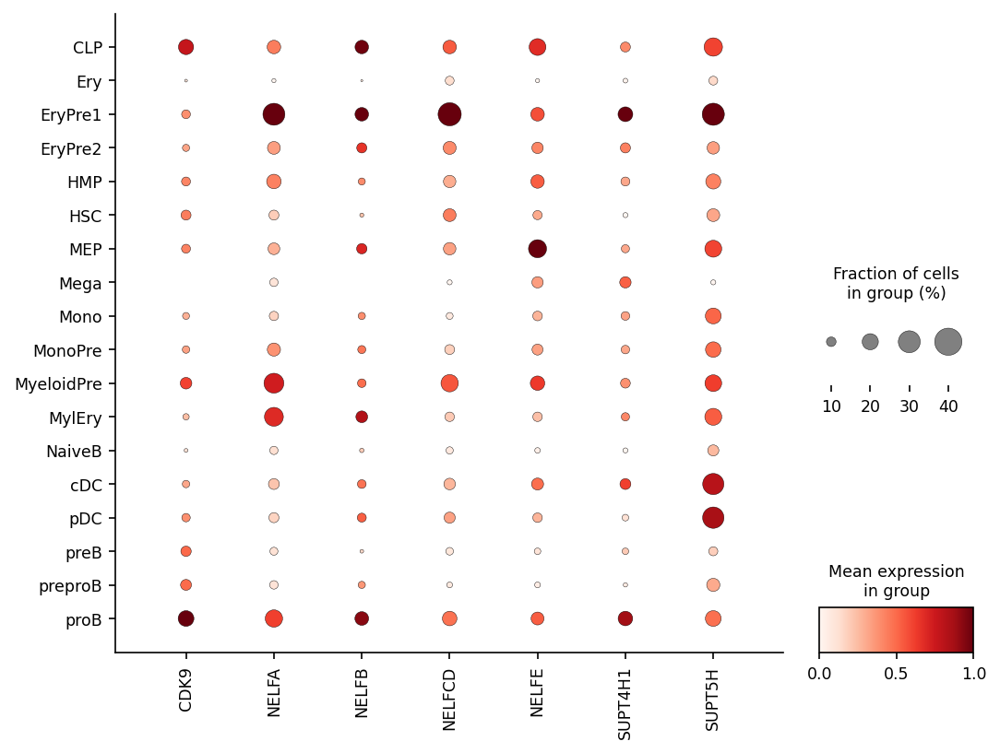

In [120]:
sc.pl.dotplot(
    ad,
    var_names=PolII_Pausing_genes[exists],   # list of genes
    groupby="celltype",        # group along y-axis
    use_raw=True,              # use unprocessed data
    standard_scale="var",      # optional: scale across genes
    figsize=(8, 6)             # adjust size to fit
)

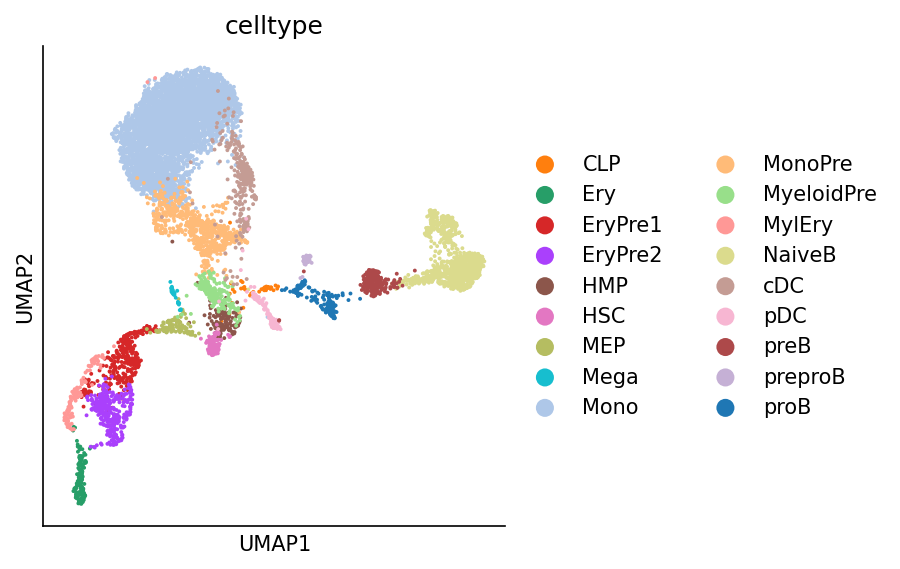

In [121]:
sc.pl.scatter(ad, basis="umap", color="celltype")

/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:900: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


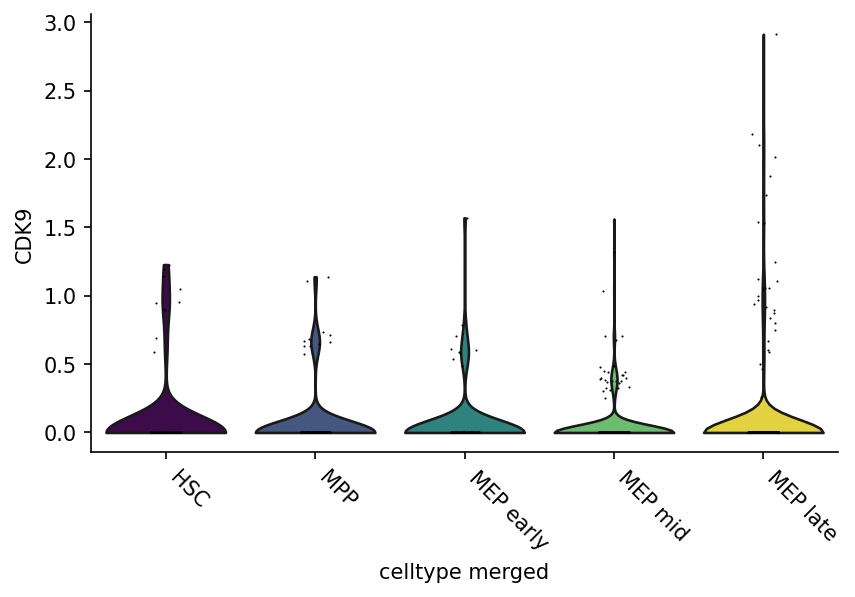

/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:900: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


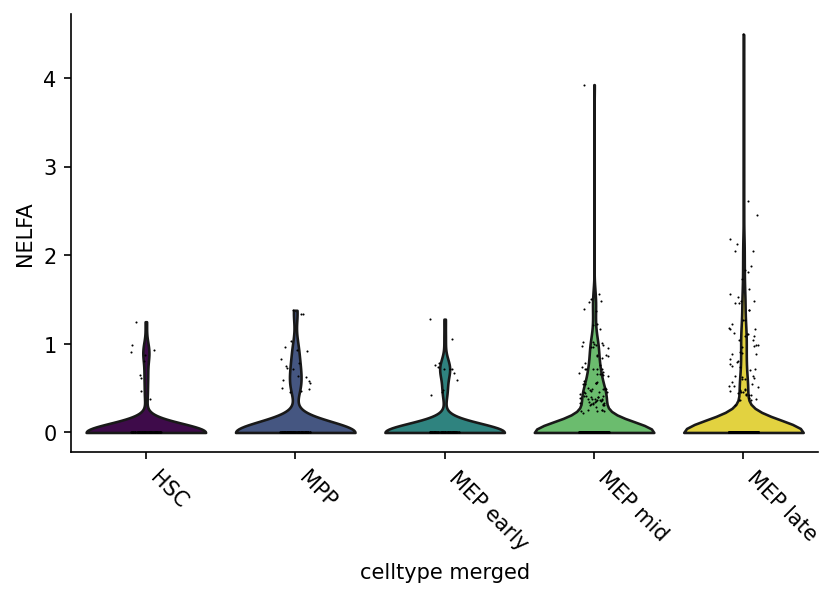

/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:900: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


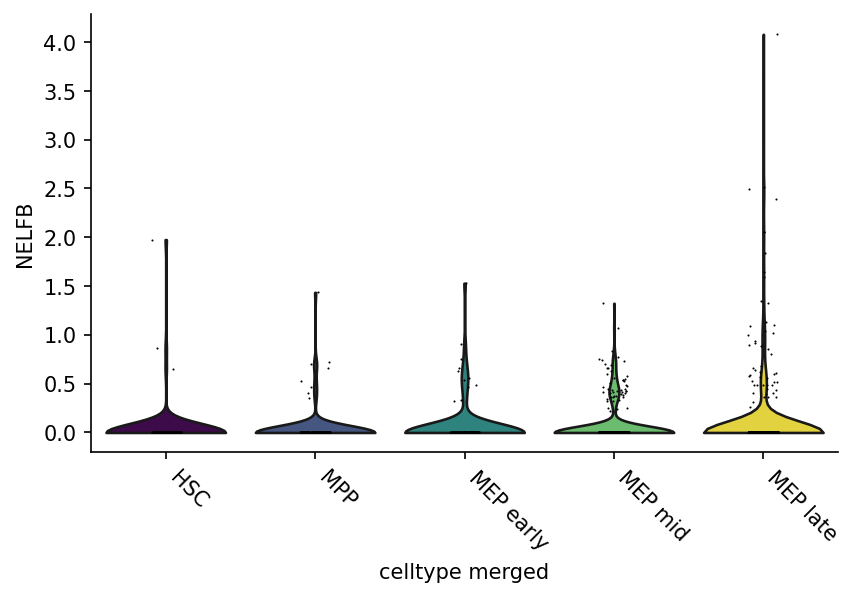

/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:900: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


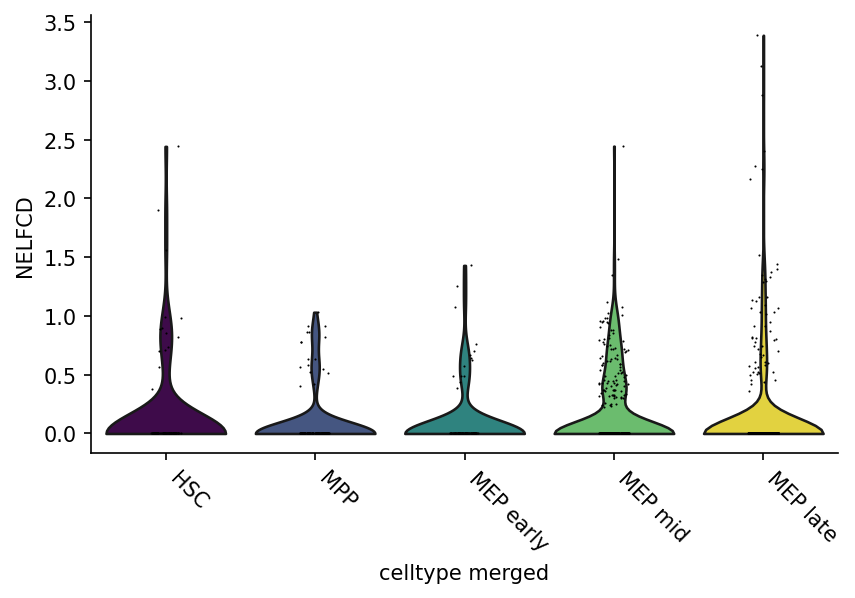

/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:900: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


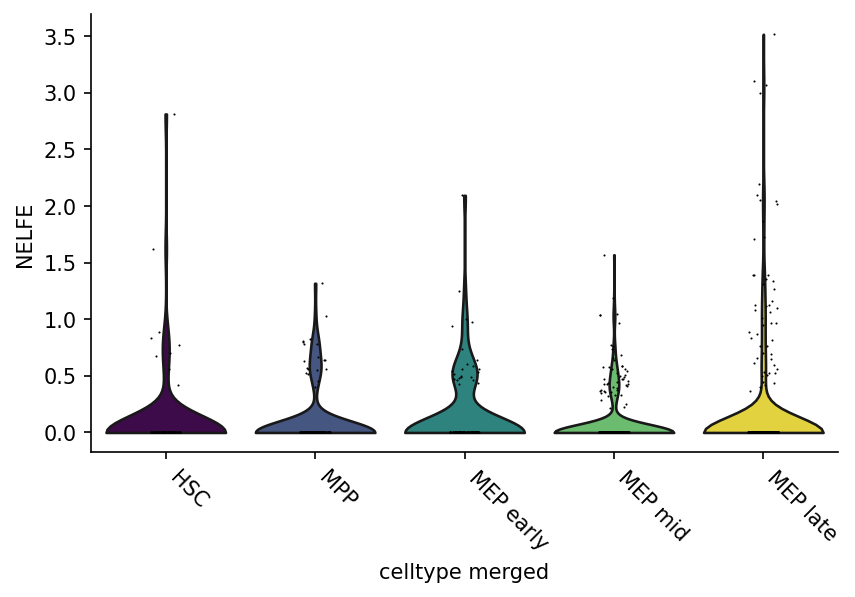

/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:900: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


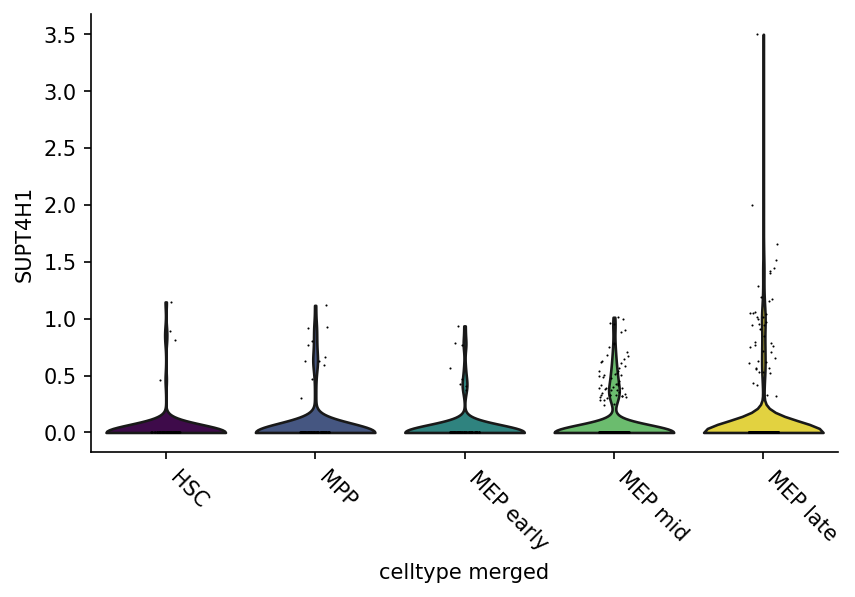

/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:900: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


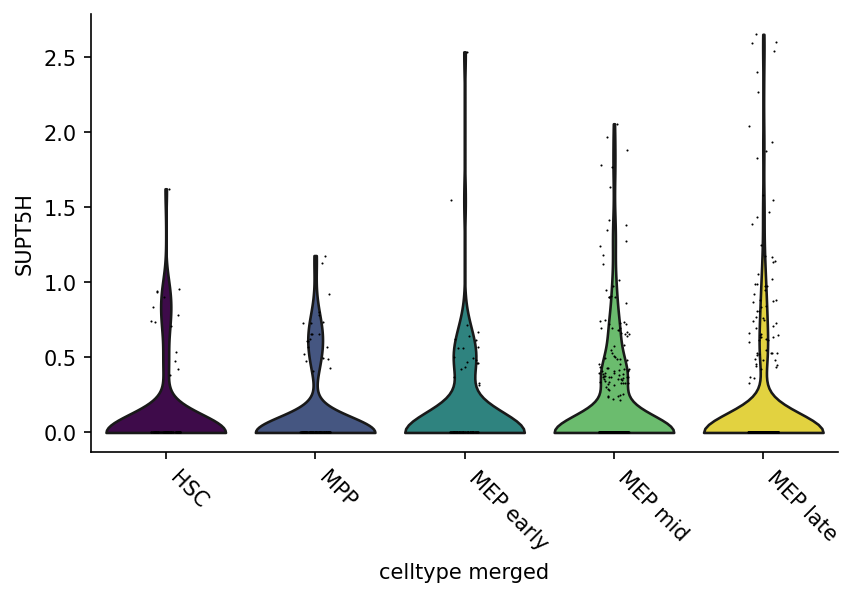

In [122]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib

# Desired order and relabeling
celltype_map = {
    'HSC': 'HSC',
    'HMP': 'MPP',
    'MEP': 'MEP early', 
    'EryPre1': 'MEP mid', 
   'EryPre2' : 'MEP late',
    'MylEry' : 'MEP late'
}

keep = ad.obs['celltype'].isin(celltype_map.keys())
ad_subset = ad[keep].copy()
ad_subset.obs['celltype_merged'] = ad_subset.obs['celltype'].map(celltype_map)

# Make it a categorical with the correct order
ordered_categories = ['HSC', 'MPP', 'MEP early', 'MEP mid', 'MEP late']
ad_subset.obs['celltype_merged'] = pd.Categorical(
    ad_subset.obs['celltype_merged'], 
    categories=ordered_categories,
    ordered=True
)

custom_colors = {
    'HSC': "#440154",
    'MPP': "#3b528b",
    'MEP early': "#21918c",
    'MEP mid': "#5ec962",
    'MEP late': "#fde725"
}

import os
os.makedirs("violin_plots", exist_ok=True)

matplotlib.rcParams["figure.figsize"] = [6, 4]

for gene in PolII_Pausing_genes[exists]:
    sc.pl.violin(
        ad_subset, 
        gene, 
        groupby="celltype_merged", 
        use_raw=False, 
        show=False, 
        palette=custom_colors
    )
    plt.xticks(rotation=-45, ha="left")
    plt.savefig(f"violin_plots/{gene}.png", dpi=300, bbox_inches="tight")
    plt.show()

# Reset to default
matplotlib.rcParams["figure.figsize"] = [4, 4]


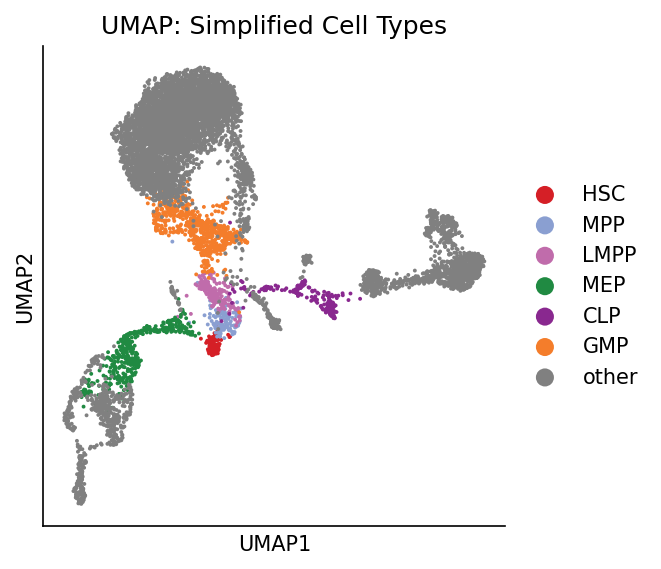

In [145]:
import scanpy as sc

# 1. Define mapping
celltype_map = {
    'HSC': 'HSC',
    'HMP': 'MPP',
    'MEP': 'MEP', 
    'EryPre1': 'MEP', 
    'MyeloidPre': 'LMPP',
    'MonoPre': 'GMP',
    'CLP': 'CLP',
    'proB': 'CLP',
}

# 2. Apply mapping to create simplified label
ad.obs["celltype_simplified"] = ad.obs["celltype"].map(celltype_map).fillna("other")

# 3. Define order and colors
simplified_order = ["HSC", "MPP", "LMPP", "MEP", "CLP", "GMP", "other"]
simplified_colors = [
    "#D51F26",  # HSC
    "#8A9FD1",  # MPP
    "#C06CAB",  # LMPP
    "#208A42",  # MEP
    "#89288F",  # CLP
    "#F47D2B",  # GMP
    "grey"      # other
]

# 4. Set as categorical with order
ad.obs["celltype_simplified"] = pd.Categorical(
    ad.obs["celltype_simplified"],
    categories=simplified_order,
    ordered=True
)

# 5. Save UMAP plot to file (e.g. "umap_simplified.pdf")
sc.pl.scatter(
    ad,
    basis="umap",
    color="celltype_simplified",
    palette=simplified_colors,
    title="UMAP: Simplified Cell Types",
    save="_simplified_clusters.png"  # saves to `figures/umap_simplified.pdf`
)


In [146]:
# --- Genes of interest ---
genes_of_interest = ["CDK9","NELFA","NELFB","NELFCD","NELFE","SUPT5H","SUPT4H1"]

# --- Original celltype column in adata.obs ---
label_col = "celltype"

# --- Celltype remapping ---
celltype_map = {
    'HSC': 'HSC',
    'HMP': 'MPP',
    'MEP': 'MEP', 
    'EryPre1': 'MEP', 
    'MyeloidPre': 'LMPP',
    'MonoPre': 'GMP',
    'CLP': 'CLP',
    'proB': 'CLP',
}

# --- Pairwise comparisons, with mapping applied ---
pairs = [
    ("HSC", "MPP"),
    ("MPP", "MEP"),
    ("MPP", "LMPP"),
    ("LMPP", "GMP"),
    ("LMPP", "CLP"),
]

# --- Use raw or not ---
use_raw_default = False


In [147]:
res_combined = pairwise_pvals_for_genes(
    ad,
    pairs=pairs,
    genes=genes_of_interest,
    label="celltype",
    method="wilcoxon",
    use_raw=use_raw_default,
    celltype_map = {
    'HSC': 'HSC',
    'HMP': 'MPP',
    'MEP': 'MEP', 
    'EryPre1': 'MEP', 
    'MyeloidPre': 'LMPP',
    'MonoPre': 'GMP',
    'CLP': 'CLP',
    'proB': 'CLP',
}
)
display(res_combined)
res_combined.to_csv("PolII_Pausing_pairwise_pvals_combined_late.csv", index=False)

,comparison,gene,n_cells_g1,n_cells_g2,scores,logfoldchanges,pval,fdr,mean_g1,mean_g2,delta_mean,pct_expr_g1,pct_expr_g2
0,HSC vs MPP,CDK9,95,121,0.484294,0.591616,0.628177,0.732874,0.101004,0.067809,0.033195,0.105263,0.090909
1,HSC vs MPP,NELFA,95,121,-1.397613,-0.756434,0.162229,0.472898,0.082874,0.137349,-0.054475,0.105263,0.173554
2,HSC vs MPP,NELFB,95,121,-1.102540,-0.247282,0.270227,0.472898,0.036758,0.043528,-0.006770,0.031579,0.066116
3,HSC vs MPP,NELFCD,95,121,0.314778,0.664836,0.752930,0.752930,0.151752,0.097560,0.054192,0.147368,0.140496
4,HSC vs MPP,NELFE,95,121,-1.234471,-0.147673,0.217027,0.472898,0.097707,0.107854,-0.010147,0.094737,0.157025
5,HSC vs MPP,SUPT5H,95,121,-0.533909,-0.084171,0.593405,0.732874,0.115497,0.122150,-0.006653,0.147368,0.181818
6,HSC vs MPP,SUPT4H1,95,121,-1.366219,-0.901183,0.171870,0.472898,0.034898,0.064507,-0.029608,0.042105,0.090909
28,LMPP vs CLP,CDK9,186,193,-1.809067,-0.552674,0.070441,0.164361,0.088350,0.127809,-0.039460,0.129032,0.191710
29,LMPP vs CLP,NELFA,186,193,1.135517,0.163868,0.256159,0.438546,0.182603,0.164068,0.018535,0.263441,0.207254
30,LMPP vs CLP,NELFB,186,193,-2.298339,-1.303384,0.021543,0.150798,0.046281,0.111644,-0.065363,0.086022,0.160622


In [148]:
PolII_Pausing_res_fixed_lfc = de_all_genes_for_pairs(
    ad,
    pairs=pairs,
    label="celltype",
    use_raw=False,
    layer="logp2",
    method="wilcoxon",
    celltype_map = {
    'HSC': 'HSC',
    'HMP': 'MPP',
    'MEP': 'MEP', 
    'EryPre1': 'MEP', 
    'MyeloidPre': 'LMPP',
    'MonoPre': 'GMP',
    'CLP': 'CLP',
    'proB': 'CLP',
}
)
display(res_all_combined.head())

/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:320: RuntimeWarning: invalid value encountered in divide
  scores = (
/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:320: RuntimeWarning: invalid value encountered in divide
  scores = (
/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:320: RuntimeWarning: invalid value encountered in divide
  scores = (
/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:320: RuntimeWarning: invalid value encountered in divide
  scores = (
/home/derek.janssens/jupyter_bbc2_python3_python-3.11.3_/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:320: RuntimeWarning: invalid value encountered in divide
  scores = (


,gene,scores,logfoldchanges,pval,fdr,comparison,n_cells_g1,n_cells_g2,log2FC,neglog10p
0,AJ009632.2,8.876476,2.498344,6.901155e-19,5.943965e-15,HSC vs MPP,95,121,3.604348,18.161078
1,PRKG1,8.692360,2.167208,3.549879e-18,1.844329e-14,HSC vs MPP,95,121,3.126621,17.449786
2,PLXDC2,8.671021,1.663203,4.282662e-18,1.844329e-14,HSC vs MPP,95,121,2.399495,17.368286
3,ZNF385D,8.357456,2.842376,6.408503e-17,1.839881e-13,HSC vs MPP,95,121,4.100682,16.193243
4,PRKG2,7.949333,2.134439,1.875183e-15,4.037738e-12,HSC vs MPP,95,121,3.079344,14.726956


In [149]:
from adjustText import adjust_text
import matplotlib.pyplot as plt
import os

def plot_volcano_panels(
    df_all,
    highlight_genes,
    outdir="volcano_plots_combined",
    point_size=20,          # Larger base points
    alpha=1.0,              # Fully opaque
    label_offset=(0.05, 0.2),
    use_adjusttext=True,
    grey_color="#D3D3D3",   # Lighter grey
    highlight_size=60,      # Larger black highlight points
    fontsize=10             # Bigger gene labels
):
    os.makedirs(outdir, exist_ok=True)
    comps = list(df_all["comparison"].dropna().unique())

    for comp in comps:
        d = df_all[df_all["comparison"] == comp].copy()
        if d.empty:
            continue

        fig, ax = plt.subplots(figsize=(6.5, 5.5))

        # Mask for genes of interest
        is_highlight = d["gene"].isin(highlight_genes)

        # Background genes (light grey)
        ax.scatter(
            -d.loc[~is_highlight, "log2FC"],
            d.loc[~is_highlight, "neglog10p"],
            s=point_size,
            color=grey_color,
            edgecolors='none',
            alpha=alpha
        )

        # Highlight genes (big black points)
        ax.scatter(
            -d.loc[is_highlight, "log2FC"],
            d.loc[is_highlight, "neglog10p"],
            s=highlight_size,
            color='black',
            edgecolors='none',
            alpha=1.0,
            zorder=3
        )

        # Label genes of interest
        texts = []
        for g in highlight_genes:
            sub = d[d["gene"] == g]
            if sub.empty:
                continue
            x = -float(sub["log2FC"].iloc[0])
            y = float(sub["neglog10p"].iloc[0])

            if use_adjusttext:
                txt = ax.text(
                    x + label_offset[0],
                    y + label_offset[1],
                    g,
                    fontsize=fontsize,
                    color="black"
                )
                texts.append(txt)
            else:
                ax.annotate(
                    g,
                    xy=(x, y),
                    xytext=(x + label_offset[0], y + label_offset[1]),
                    textcoords="data",
                    fontsize=fontsize,
                    color="black",
                    arrowprops=dict(arrowstyle="-", lw=0.5),
                    ha="left",
                    va="bottom"
                )

        if use_adjusttext and texts:
            adjust_text(
                texts,
                only_move={"points": "y", "text": "xy", "objects": "xy"},
                autoalign=True,
                expand_points=(1.2, 1.4),
                expand_text=(1.2, 1.4),
                ax=ax,
            )

        # Axis labels and layout
        ax.axvline(0, lw=0.7, color="black", linestyle="--")
        ax.set_xlabel("log2 fold change (group1 over group2)", fontsize=12)
        ax.set_ylabel("-log10 p-value", fontsize=12)
        ax.set_title(comp, fontsize=13)
        plt.tight_layout()

        # Save
        fn = os.path.join(outdir, f"volcano_{comp.replace(' ', '').replace(',', '_').replace('/', '-')}.png")
        plt.savefig(fn, dpi=300)
        plt.show()
        print(f"[saved] {fn}")


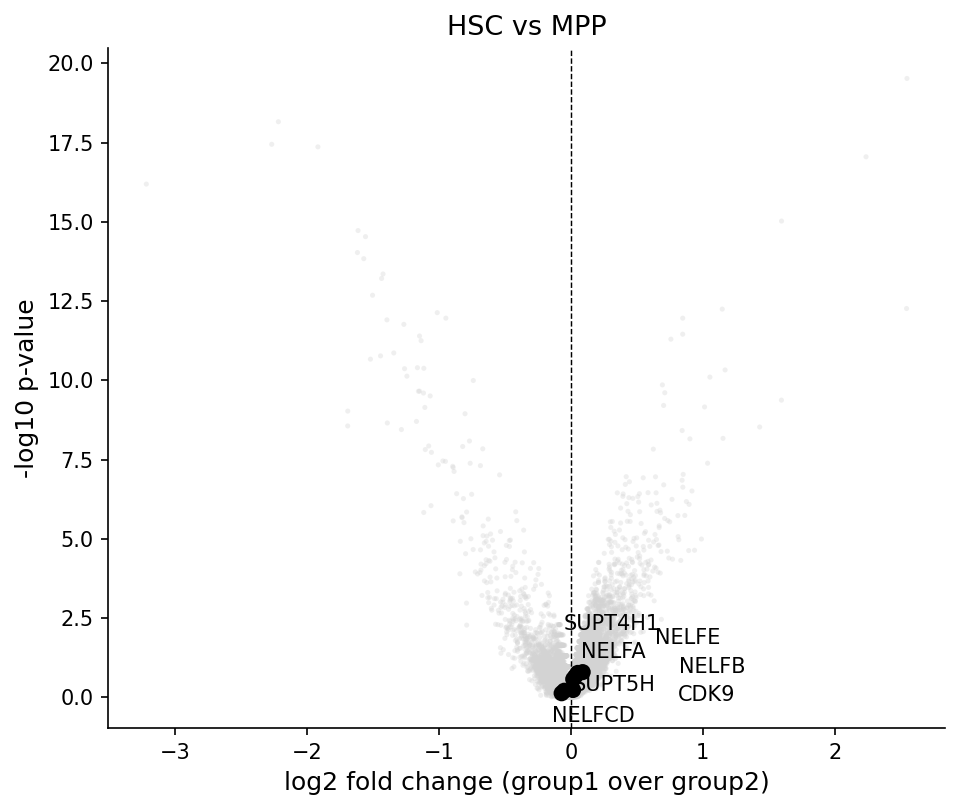

[saved] PolII_Pausing_volcano_plots_corrected_lfc/volcano_HSCvsMPP.png


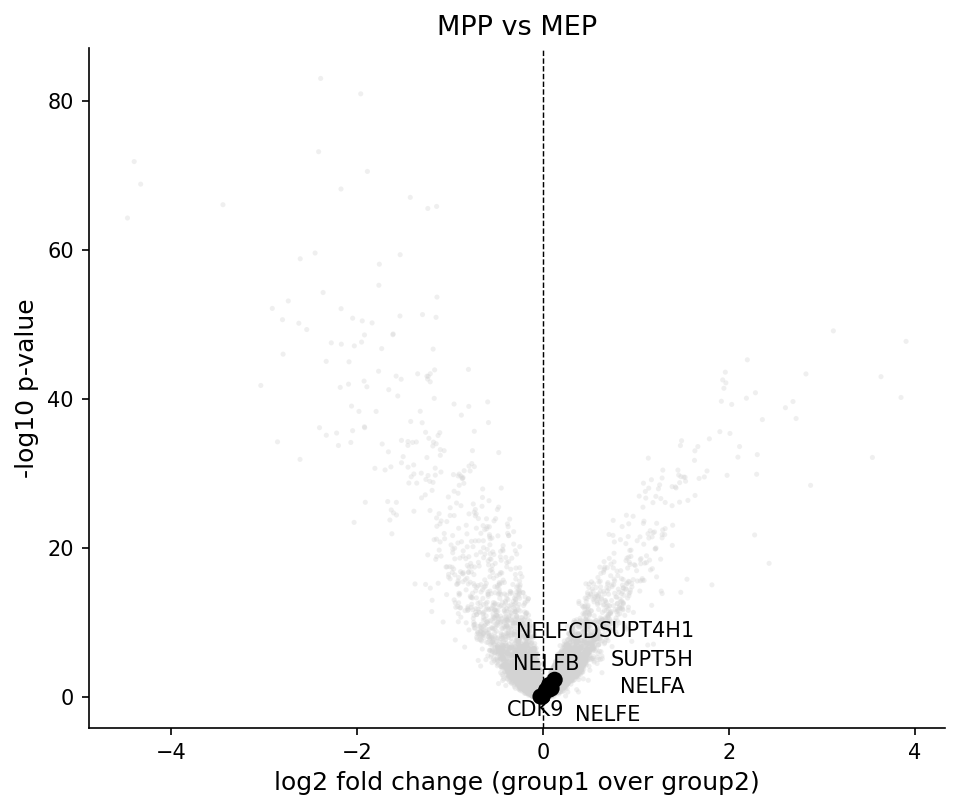

[saved] PolII_Pausing_volcano_plots_corrected_lfc/volcano_MPPvsMEP.png


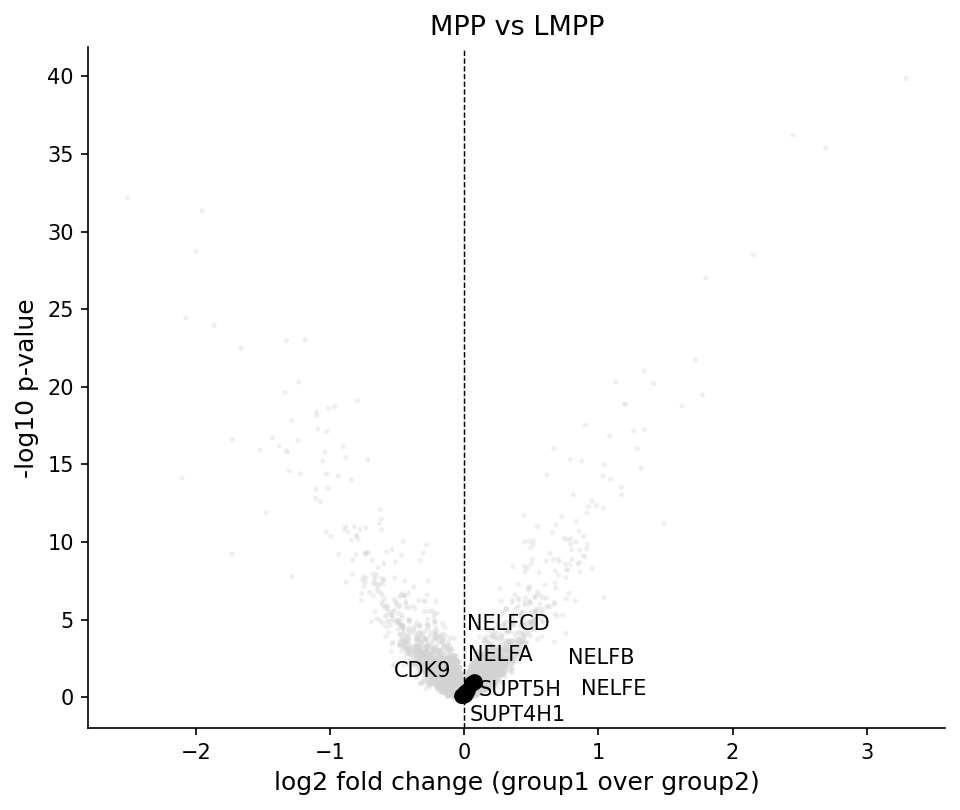

[saved] PolII_Pausing_volcano_plots_corrected_lfc/volcano_MPPvsLMPP.png


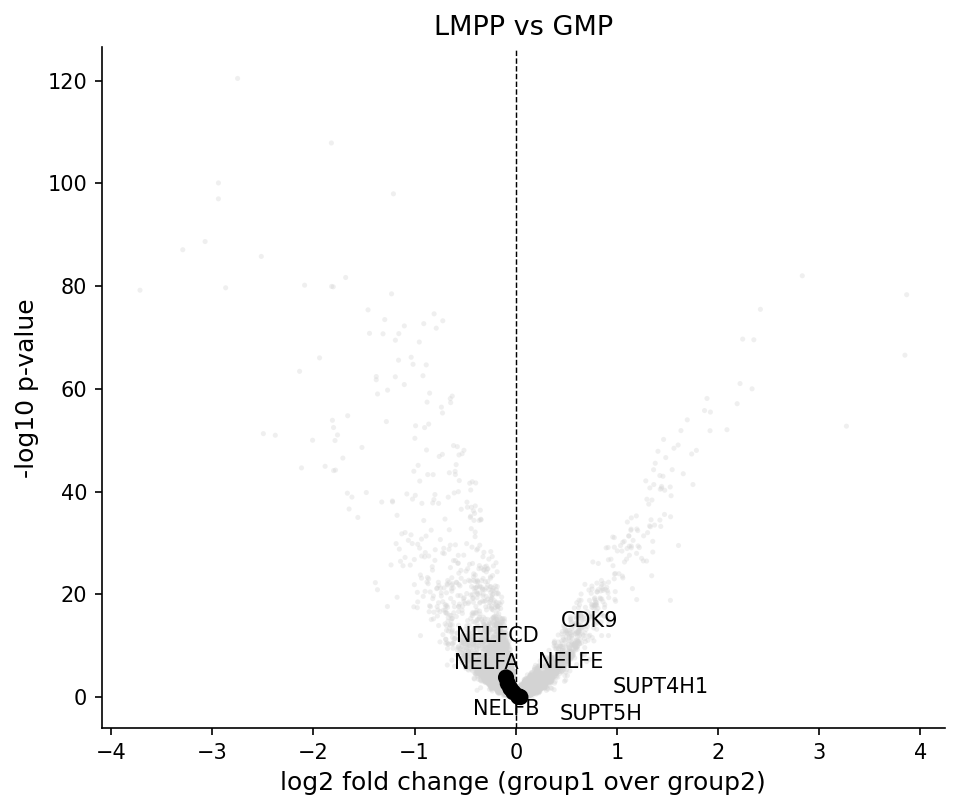

[saved] PolII_Pausing_volcano_plots_corrected_lfc/volcano_LMPPvsGMP.png


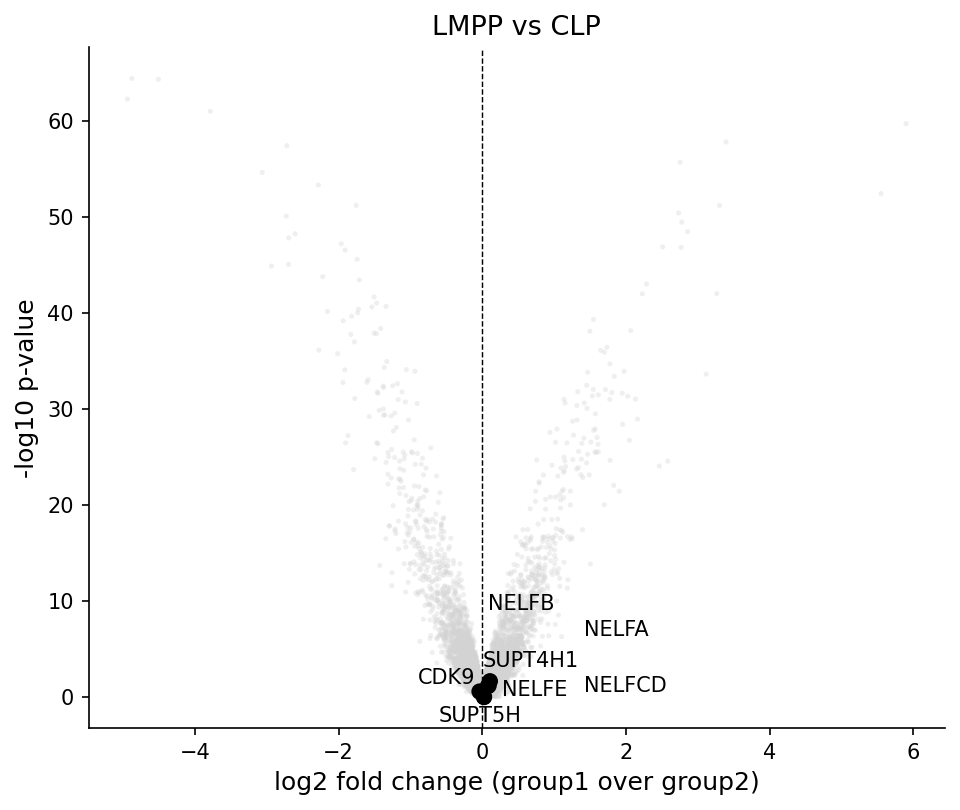

[saved] PolII_Pausing_volcano_plots_corrected_lfc/volcano_LMPPvsCLP.png


In [150]:
plot_volcano_panels(
    PolII_Pausing_res_fixed_lfc,
    highlight_genes=genes_of_interest,
    outdir="PolII_Pausing_volcano_plots_corrected_lfc",
    point_size=6,
    alpha=0.35,
    label_offset=(0.05, 0.2),
)

In [160]:
import matplotlib.pyplot as plt
from adjustText import adjust_text
import os

def plot_volcano_panels(
    df_all,
    highlight_genes,
    outdir="volcano_plots_combined",
    point_size=60,          # Larger background points
    highlight_size=120,     # Larger highlight points
    alpha=1.0,              # Fully opaque
    grey_color="#D3D3D3",   # Light grey
    show_labels=False       # Toggle for gene labels
):
    os.makedirs(outdir, exist_ok=True)
    comps = list(df_all["comparison"].dropna().unique())

    for comp in comps:
        d = df_all[df_all["comparison"] == comp].copy()
        if d.empty:
            continue

        fig, ax = plt.subplots(figsize=(6.5, 5.5))

        is_highlight = d["gene"].isin(highlight_genes)

        # Background genes (now plotting group2 over group1)
        ax.scatter(
            -d.loc[~is_highlight, "log2FC"],
            d.loc[~is_highlight, "neglog10p"],
            s=point_size,
            color=grey_color,
            edgecolors='none',
            alpha=alpha
        )

        # Highlighted genes
        ax.scatter(
            -d.loc[is_highlight, "log2FC"],
            d.loc[is_highlight, "neglog10p"],
            s=highlight_size,
            color='black',
            edgecolors='none',
            alpha=1.0,
            zorder=3
        )


        # Optional gene labels
        if show_labels:
            texts = []
            for g in highlight_genes:
                sub = d[d["gene"] == g]
                if sub.empty:
                    continue
                x = float(sub["log2FC"].iloc[0])
                y = float(sub["neglog10p"].iloc[0])
                txt = ax.text(
                    x + 0.05, y + 0.2, g,
                    fontsize=10,
                    color="black"
                )
                texts.append(txt)

            if texts:
                adjust_text(
                    texts,
                    only_move={"points": "y", "text": "xy", "objects": "xy"},
                    autoalign=True,
                    expand_points=(1.2, 1.4),
                    expand_text=(1.2, 1.4),
                    ax=ax,
                )

        # Axis styling
        ax.axvline(0, lw=2.8, color="black", linestyle="--")  # Center line, now thicker
        ax.set_xlabel("log2 fold change (group1 over group2)", fontsize=12)
        ax.set_ylabel("-log10 p-value", fontsize=12)
        ax.set_title(comp, fontsize=13)

        # Make x and y axis lines thicker
        ax.spines['bottom'].set_linewidth(2.8)
        ax.spines['left'].set_linewidth(2.8)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

        plt.tight_layout()

        # Save
        fn = os.path.join(outdir, f"volcano_{comp.replace(' ', '').replace(',', '_').replace('/', '-')}.png")
        plt.savefig(fn, dpi=300)
        plt.show()
        print(f"[saved] {fn}")


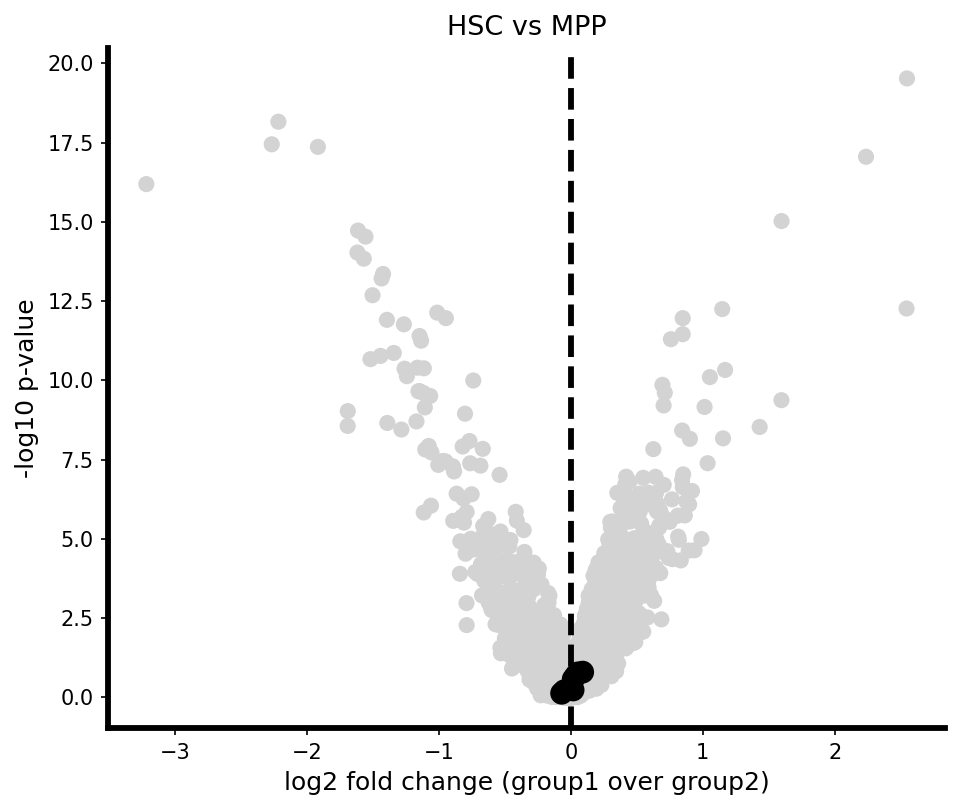

[saved] PolII_Pausing_volcano_plots_corrected_lfc_No_Gene_Labels/volcano_HSCvsMPP.png


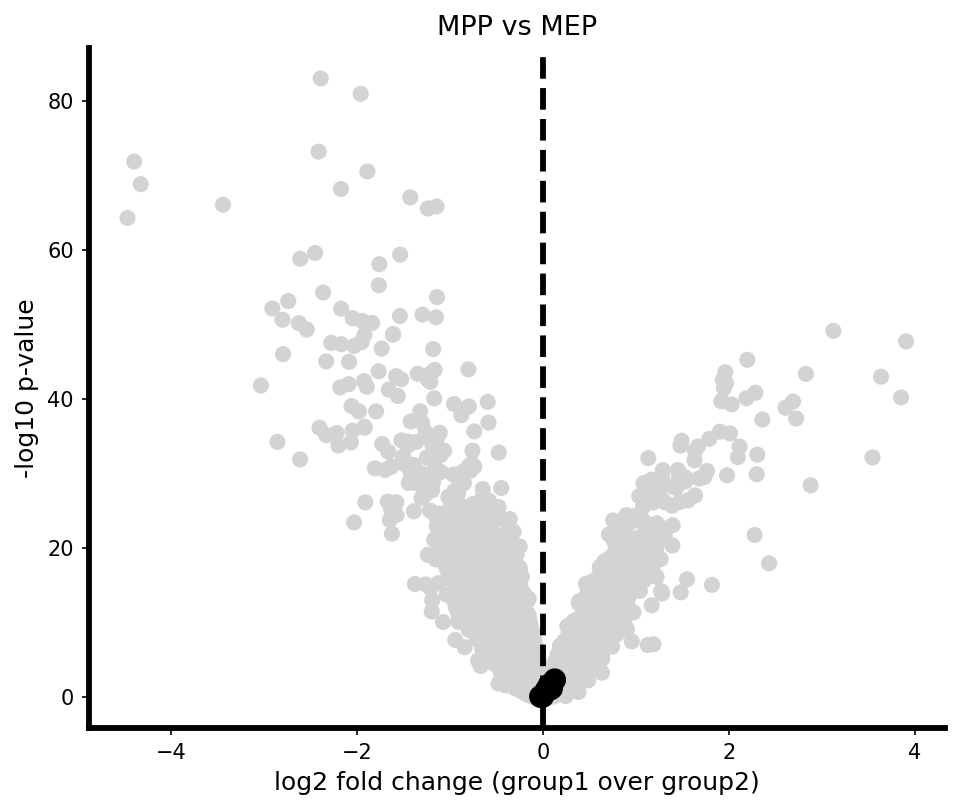

[saved] PolII_Pausing_volcano_plots_corrected_lfc_No_Gene_Labels/volcano_MPPvsMEP.png


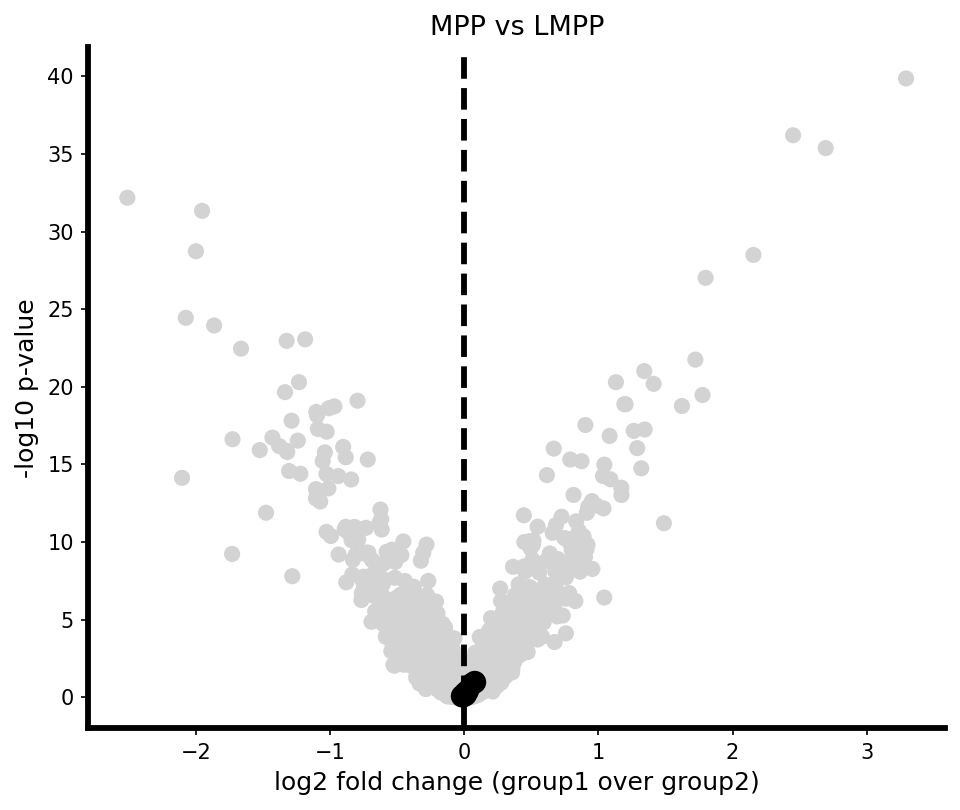

[saved] PolII_Pausing_volcano_plots_corrected_lfc_No_Gene_Labels/volcano_MPPvsLMPP.png


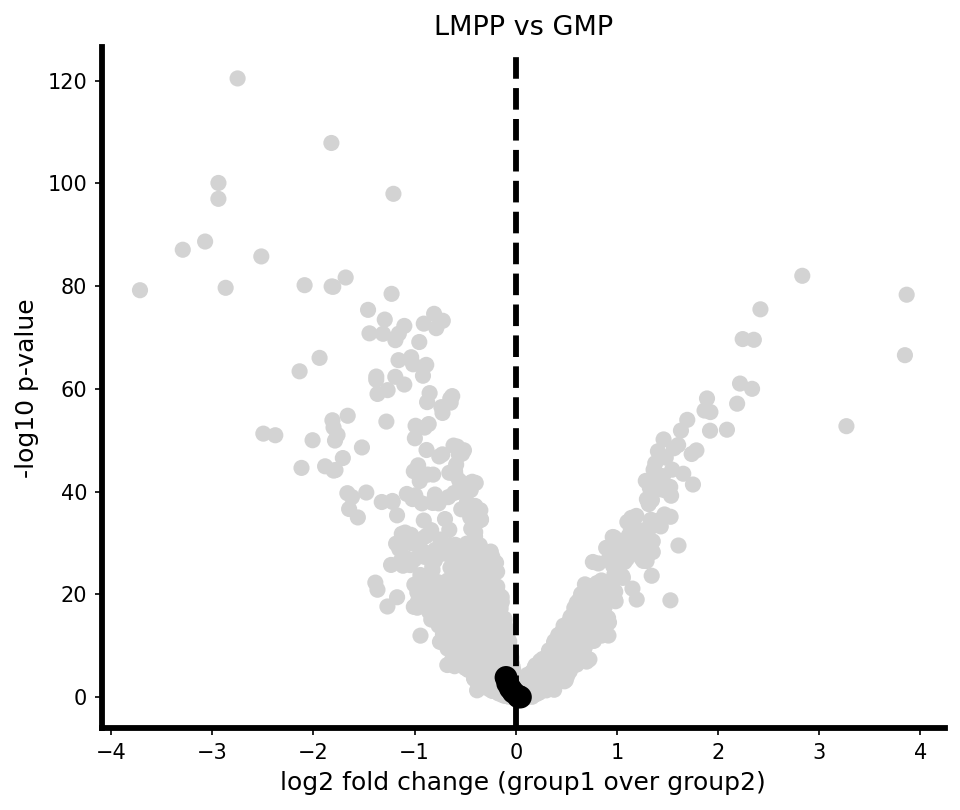

[saved] PolII_Pausing_volcano_plots_corrected_lfc_No_Gene_Labels/volcano_LMPPvsGMP.png


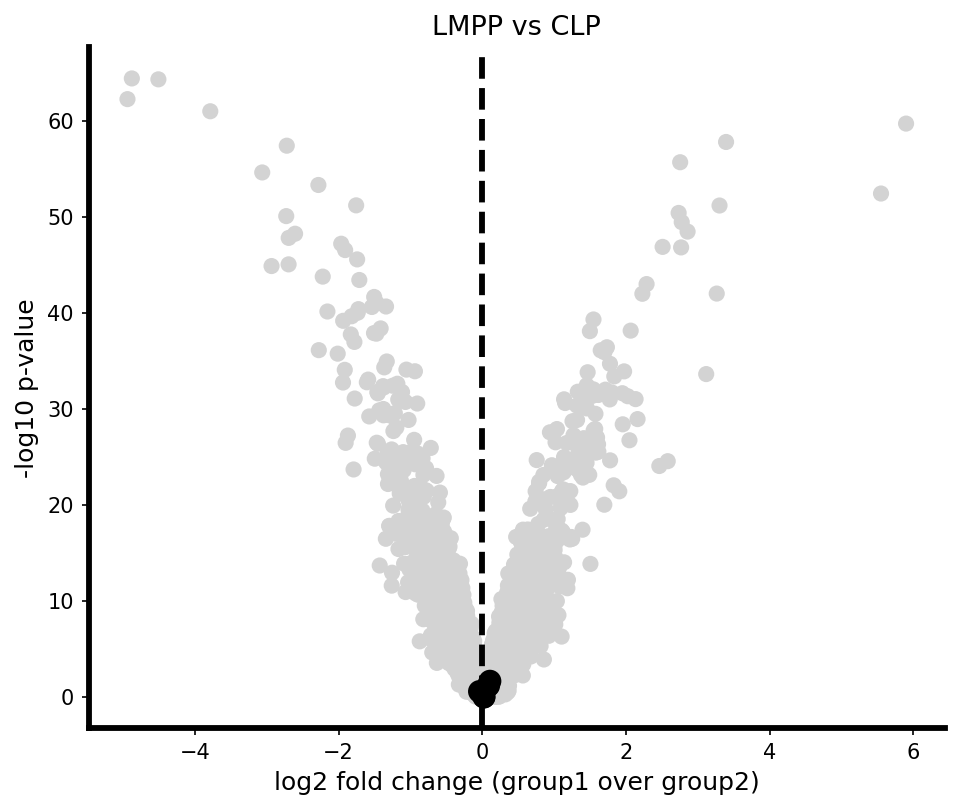

[saved] PolII_Pausing_volcano_plots_corrected_lfc_No_Gene_Labels/volcano_LMPPvsCLP.png


In [161]:
genes_of_interest = ["CDK9","NELFA","NELFB","NELFCD","NELFE","SUPT5H","SUPT4H1"]
plot_volcano_panels(
    PolII_Pausing_res_fixed_lfc,
    highlight_genes=genes_of_interest,
    outdir="PolII_Pausing_volcano_plots_corrected_lfc_No_Gene_Labels",
    #point_size=6,
    #alpha=0.35,
    #label_offset=(0.05, 0.2),
)